In [ ]:
#Instalación librerías requeridas
!pip install torch torchvision torchaudio
!pip install numpy
!pip install matplotlib
!pip install opencv-python-headless



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3108, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.10/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2901, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/base_command.py", line 169, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/cli/req_command.py", line 242, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 441, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.10/dist-packages/pip/_internal/commands/install.py", line 

In [ ]:

# Se importan las librerías

import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import cv2

print(torch.__version__)

2.1.0+cu121


In [ ]:
# Se monta Google Drive para acceder a los datos
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

In [ ]:
# Función para cargar las mamografías y las máscaras

import cv2
import os
import numpy as np


def load_matched_images_and_masks(image_folder, mask_folder):
    images = []
    masks = []
    image_filenames = []
    mask_filenames = []

    for img_filename in os.listdir(image_folder):
        img_path = os.path.join(image_folder, img_filename)
        mask_filename = os.path.splitext(img_filename)[0] + "_LI.png"
        mask_path = os.path.join(mask_folder, mask_filename)

        if os.path.exists(img_path) and os.path.exists(mask_path):
            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            if img is not None and mask is not None:
                images.append(img)
                masks.append(mask)
                image_filenames.append(img_filename)
                mask_filenames.append(mask_filename)

    return images, masks, image_filenames, mask_filenames

mamographies, masks, mamographies_filenames, mask_filenames = load_matched_images_and_masks('/content/drive/MyDrive/TFM/MIAS_seg', '/content/drive/MyDrive/TFM/MIAS_seg_lab')



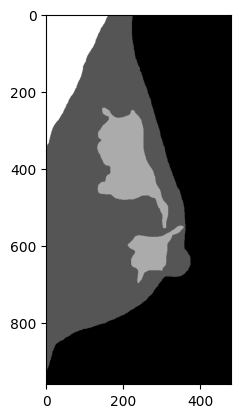

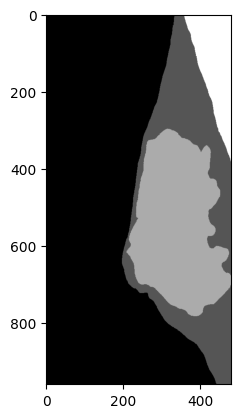

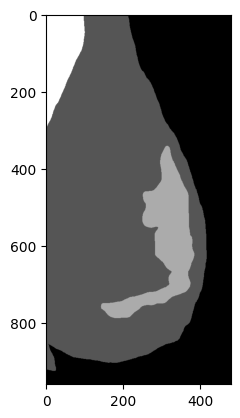

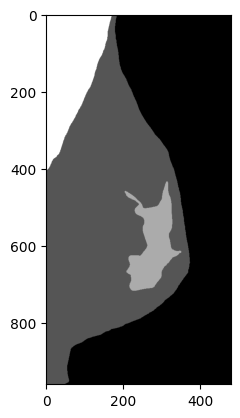

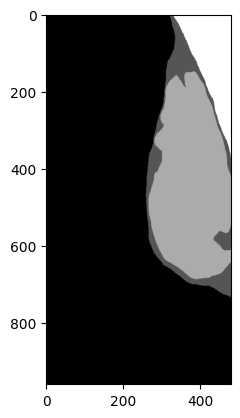

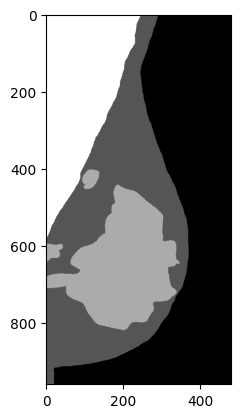

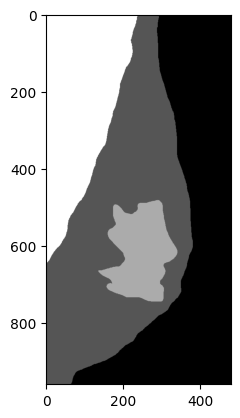

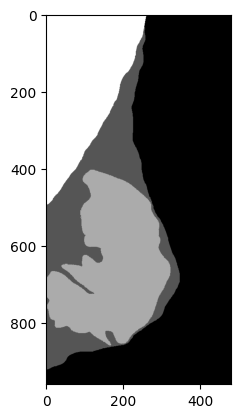

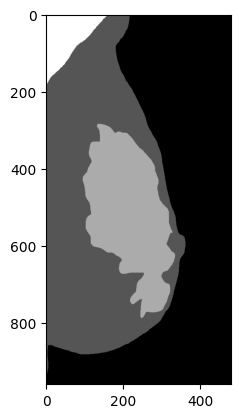

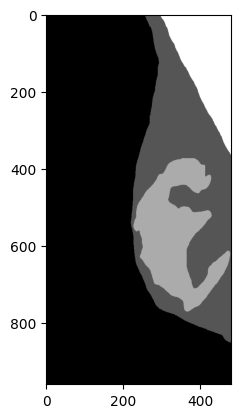

In [ ]:
#Se comprueban las máscaras, observando que tienen 4 clases, cuando solamente se precisa de dos, el músculo pectoral frente al resto
for i in range(10):
    plt.imshow(masks[i], cmap='gray')
    plt.show()


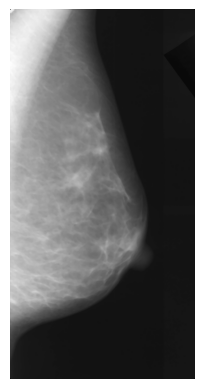

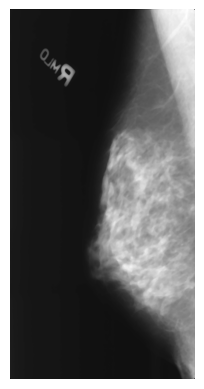

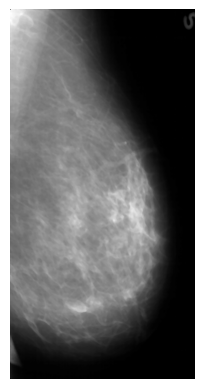

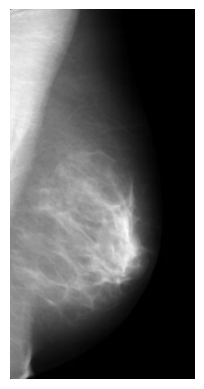

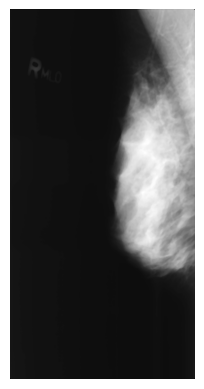

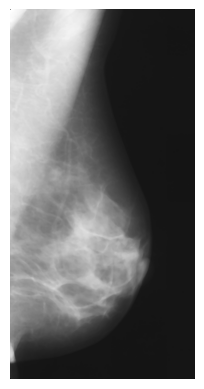

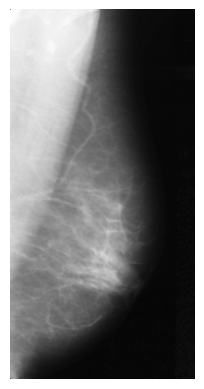

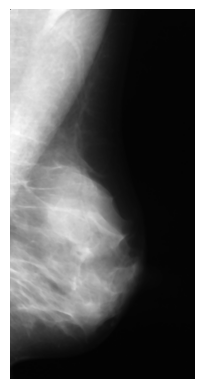

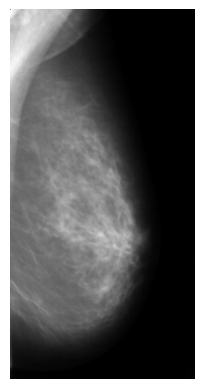

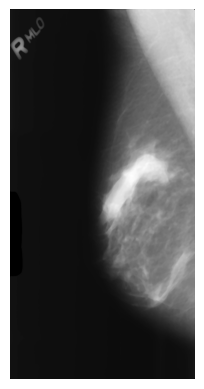

In [ ]:
import matplotlib.pyplot as plt

#Se comprueban las mamografías
for i in range(10):
    plt.imshow(cv2.cvtColor(mamographies[i], cv2.COLOR_BGR2RGB)) # Convierte de BGR a RGB
    plt.axis('off')   # Esconde los ejes
    plt.show()


In [ ]:
unique_values = np.unique(masks[0])
print("Valores únicos en la máscara:", unique_values)


Valores únicos en la máscara: [ 64 128 192 255]


In [ ]:
unique_values = np.unique(mamographies[0])
print("Valores únicos en las imágenes originales:", unique_values)

Valores únicos en las imágenes originales: [  0   8   9  10  12  13  14  15  17  18  19  21  22  23  24  26  27  28
  29  31  32  33  35  36  37  38  40  41  42  44  45  46  47  49  50  51
  53  54  55  56  58  59  60  62  63  64  65  67  68  69  70  72  73  74
  76  77  78  79  81  82  83  85  86  87  88  90  91  92  94  95  96  97
  99 100 101 103 104 105 106 108 109 110 111 113 114 115 117 118 119 120
 122 123 124 126 127 128 129 131 132 133 135 136 137 138 140 141 142 144
 145 146 147 149 150 151 152 154 155 156 158 159 160 161 163 164 165 167
 168 169 170 172 173 174 176 177 178 179 181 182 183 185 186 187 188 190
 191 192 193 195 196 197 199 200 201 202 204 205 206 208 209 210 211 213
 214 215 217 218 219 220 222 223 224 226 227 228 229 231 232 233 234 236
 237 238 240 241 242 243 245 246 247 249 250 251 252 254 255]


In [ ]:
#Se crea una función para binarizar las máscaras, concretamente el músculo pectoral frente al resto.
def binarize_masks(masks):
    binarized_masks = []
    for mask in masks:

        if len(mask.shape) > 2:
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        # Binariza específicamente para el valor 255
        _, binarized_mask = cv2.threshold(mask, 254, 1, cv2.THRESH_BINARY)
        binarized_masks.append(binarized_mask)
    return binarized_masks

masks = binarize_masks(masks)


In [ ]:
#Se calculan los valores de las máscaras
unique_values = np.unique(masks[0])
print("Valores únicos en la máscara:", unique_values)


Valores únicos en la máscara: [0 1]


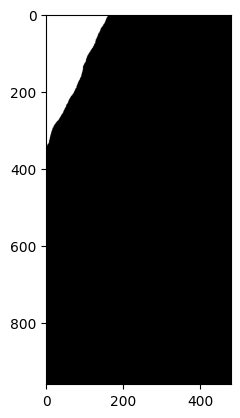

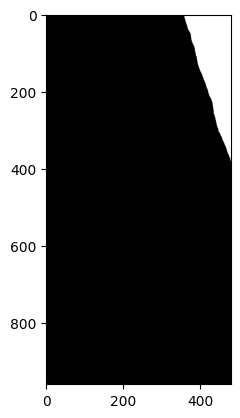

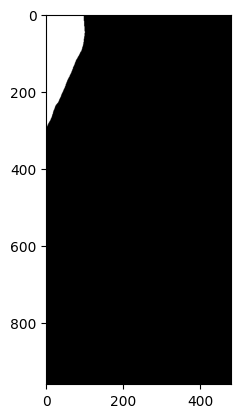

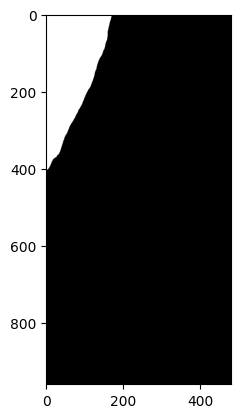

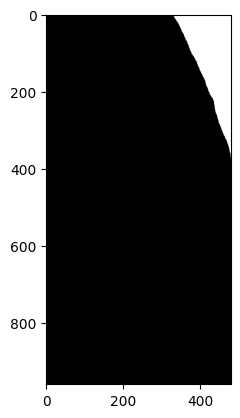

In [ ]:
#Se muestran las máscaras binarizadas
for i in range(5):
    plt.imshow(masks[i], cmap='gray')
    plt.show()


In [ ]:
# Se comprueba la asociación entre las mamografías y la máscara asociada
for img_name, mask_name in zip(mamographies_filenames, mask_filenames):
    # Quita la extensión y el sufijo "_LI" del nombre de la máscara
    img_name_without_ext = os.path.splitext(img_name)[0]
    mask_name_without_ext = os.path.splitext(mask_name.replace('_LI', ''))[0]

    # Comprueba si los nombres base son iguales
    if img_name_without_ext != mask_name_without_ext:
        print(f"Error de correspondencia: {img_name} no coincide con {mask_name}")
    else:
        print(f"Correspondencia correcta: {img_name} y {mask_name}")


Correspondencia correcta: A_0096_1.RIGHT_MLO.png y A_0096_1.RIGHT_MLO_LI.png
Correspondencia correcta: B_3627_1.RIGHT_MLO.png y B_3627_1.RIGHT_MLO_LI.png
Correspondencia correcta: D_4574_1.RIGHT_MLO.png y D_4574_1.RIGHT_MLO_LI.png
Correspondencia correcta: D_4588_1.RIGHT_MLO.png y D_4588_1.RIGHT_MLO_LI.png
Correspondencia correcta: B_3680_1.RIGHT_MLO.png y B_3680_1.RIGHT_MLO_LI.png
Correspondencia correcta: A_0040_1.RIGHT_MLO.png y A_0040_1.RIGHT_MLO_LI.png
Correspondencia correcta: A_0570_1.RIGHT_MLO.png y A_0570_1.RIGHT_MLO_LI.png
Correspondencia correcta: A_0039_1.RIGHT_MLO.png y A_0039_1.RIGHT_MLO_LI.png
Correspondencia correcta: D_4538_1.RIGHT_MLO.png y D_4538_1.RIGHT_MLO_LI.png
Correspondencia correcta: B_3649_1.RIGHT_MLO.png y B_3649_1.RIGHT_MLO_LI.png
Correspondencia correcta: A_2034_1.RIGHT_MLO.png y A_2034_1.RIGHT_MLO_LI.png
Correspondencia correcta: A_2019_1.RIGHT_MLO.png y A_2019_1.RIGHT_MLO_LI.png
Correspondencia correcta: B_3620_1.RIGHT_MLO.png y B_3620_1.RIGHT_MLO_LI.png

In [ ]:
#División de datos

from sklearn.model_selection import train_test_split

train_imgs, test_imgs, train_masks, test_masks = train_test_split(mamographies, masks, test_size=0.2, random_state=40)
val_imgs, test_imgs, val_masks, test_masks = train_test_split(test_imgs, test_masks, test_size=0.5, random_state=40)


In [ ]:
# Creación clase dataset personalizada

from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
import torchvision.transforms.functional as TF

class MamographyDataset(Dataset):
    def __init__(self, images, masks, image_transform=None):
        self.images = images
        self.masks = masks
        self.image_transform = image_transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]


        if image.ndim == 3 and image.shape[-1] == 3:  # Imagenes RGB
            image = Image.fromarray(image.astype('uint8'), 'RGB')
        else:  # Imagenes en escala de grises
            image = Image.fromarray(image.squeeze().astype('uint8'), 'L')

        if mask.ndim == 3 and mask.shape[-1] == 3:  # Mascaras RGB
            mask = Image.fromarray(mask.astype('uint8'), 'RGB')
        else:  # Mascaras en escala de grises
            mask = Image.fromarray(mask.squeeze().astype('uint8'), 'L')

        # Convierte de nuevo en tensors
        image = TF.to_tensor(image)
        mask = TF.to_tensor(mask)

        return image, mask

In [ ]:

# Creación DataLoaders

from torch.utils.data import DataLoader

batch_size = 2  # Se ajusta el tamaño del lote a 2 según las necesidades del modelo y las limitaciones del hardware

# Transformación con normalización para las imágenes
image_transform = T.Compose([
    T.RandomHorizontalFlip(),
    T.RandomRotation(10),
    T.ToTensor(),
    T.Normalize(mean=[0.5], std=[0.5])  # Normalización
])


# Crea el dataset y los dataloaders
train_dataset = MamographyDataset(train_imgs, train_masks, image_transform=image_transform)
val_dataset = MamographyDataset(val_imgs, val_masks, image_transform=None)  # Sin transformaciones para la validación
test_dataset = MamographyDataset(test_imgs, test_masks, image_transform=None)  # Sin transformaciones para el test

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


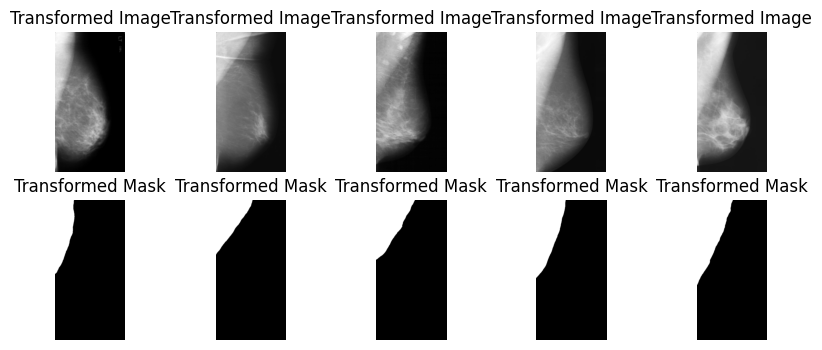

In [ ]:
def visualize_transformed_data(dataset, num_samples=5):
    plt.figure(figsize=(10, 4))
    for i in range(num_samples):
        image, mask = dataset[i]
        image_np = image.numpy().transpose(1, 2, 0)
        mask_np = mask.numpy().transpose(1, 2, 0)

        plt.subplot(2, num_samples, i+1)
        plt.imshow(image_np, cmap='gray')
        plt.title('Transformed Image')
        plt.axis('off')

        plt.subplot(2, num_samples, num_samples+i+1)
        plt.imshow(mask_np.squeeze(), cmap='gray')
        plt.title('Transformed Mask')
        plt.axis('off')

    plt.show()

# Visualiza datos transformados del conjunto de entrenamiento
visualize_transformed_data(train_dataset)


In [ ]:
# Obtiene un único lote de datos del DataLoader de entrenamiento
images, masks = next(iter(train_loader))

# Imprime las dimensiones de la primera imagen y máscara del lote
print(f"Dimensiones de la primera imagen: {images[0].shape}")
print(f"Dimensiones de la primera máscara: {masks[0].shape}")


Dimensiones de la primera imagen: torch.Size([3, 960, 480])
Dimensiones de la primera máscara: torch.Size([1, 960, 480])


In [ ]:
import torch
import torch.nn as nn
import torchvision

#Bloque Convolutivo
# Este bloque realizará dos convoluciones seguidas de Batch Normalization y una activación ReLU

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, dropout_rate):
        super(ConvBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)
        x = self.dropout(x)
        return x


In [ ]:
#Bloque de Decodificador
#El bloque decodificador en PyTorch utilizará una convolución traspuesta para el upsampling, seguido de la concatenación con las características de salto (skip connections) y luego aplicará el ConvBlock.



class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, skip_channels, dropout_rate):
        super(DecoderBlock, self).__init__()
        self.upconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        self.conv_block = ConvBlock(out_channels + skip_channels, out_channels, dropout_rate)

    def forward(self, x, skip_features):
        x = self.upconv(x)
        x = torch.cat((x, skip_features), dim=1)
        x = self.conv_block(x)
        return x


In [ ]:
#Construcción del Modelo U-Net con ResNet-50
#Finalmente, para construir el modelo completo, se utiliza ResNet-50 preentrenado de torchvision como el backbone, y se construye el decodificador con los DecoderBlock.
import torch.nn.functional as F


class ResNet50UNet(nn.Module):
    def __init__(self, dropout_rate=0.5):
        super(ResNet50UNet, self).__init__()
        # Carga ResNet50 preentrenado como backbone
        self.resnet50 = torchvision.models.resnet50(pretrained=True)
        # Extrae características específicas para las conexiones de salto
        self.s1 = nn.Sequential(*list(self.resnet50.children())[:3])  # Hasta antes de maxpool
        self.s2 = nn.Sequential(*list(self.resnet50.children())[3:5])  # capa 1
        self.s3 = self.resnet50.layer2  # capa 2
        self.s4 = self.resnet50.layer3  # capa 3
        self.bridge = self.resnet50.layer4  # capa 4

        # Define bloques de decodificador
        self.d1 = DecoderBlock(2048, 1024, 1024, dropout_rate)
        self.d2 = DecoderBlock(1024, 512, 512, dropout_rate)
        self.d3 = DecoderBlock(512, 256, 256, dropout_rate)
        self.d4 = DecoderBlock(256, 64, 64, dropout_rate)

        # Capa final: 1 canal de salida para segmentación binaria
        self.final_conv = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, x):
        # Encoder (ResNet-50)
        s1 = self.s1(x)
        s2 = self.s2(s1)
        s3 = self.s3(s2)
        s4 = self.s4(s3)
        b1 = self.bridge(s4)

        # Decoder
        d1 = self.d1(b1, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        # Salida final
        out = self.final_conv(d4)
        out = torch.sigmoid(out)  # Aplica sigmoide para obtener probabilidades
        out = F.interpolate(out, size=(960, 480), mode='bilinear', align_corners=False)  # Ajusta a tamaño de máscaras
        return out

In [ ]:
#Definimos la función de pérdida y el optimizador
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Define el modelo
model = ResNet50UNet()

# Define la función de pérdida

def dice_loss(true, pred, smooth=1e-15):
    true_flat = true.view(-1)
    pred_flat = pred.view(-1)

    intersection = (true_flat * pred_flat).sum()

    # Calcula la pérdida de Dice
    dice_coeff = (2. * intersection + smooth) / (true_flat.sum() + pred_flat.sum() + smooth)
    dice_loss = 1 - dice_coeff

    return dice_loss

# Asigna la función de pérdida de Dice a la variable 'criterion'
criterion = dice_loss


# Define el optimizador
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-5)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True) #el scheduler reducirá la tasa de aprendizaje a la mitad (factor=0.5) si la métrica de rendimiento no mejora durante 5 épocas (patience=5). El parámetro mode='min' significa que el scheduler asume que la métrica debe minimizarse.


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
import matplotlib.pyplot as plt

# Función auxiliar para visualizar imágenes y máscaras
def plot_images(images, true_masks, model_preds=None, num_images=5):
    num_images = min(num_images, len(images))
    fig, axs = plt.subplots(3, num_images, figsize=(20, 10))
    for i in range(num_images):
        axs[0, i].imshow(images[i][0], cmap='gray')
        axs[0, i].set_title('Original Image')
        axs[0, i].axis('off')

        axs[1, i].imshow(true_masks[i].squeeze(), cmap='gray')
        axs[1, i].set_title('True Mask')
        axs[1, i].axis('off')

        if model_preds is not None:
            axs[2, i].imshow(model_preds[i].squeeze().cpu().detach(), cmap='gray')
            axs[2, i].set_title('Predicted Mask')
            axs[2, i].axis('off')

    plt.show()


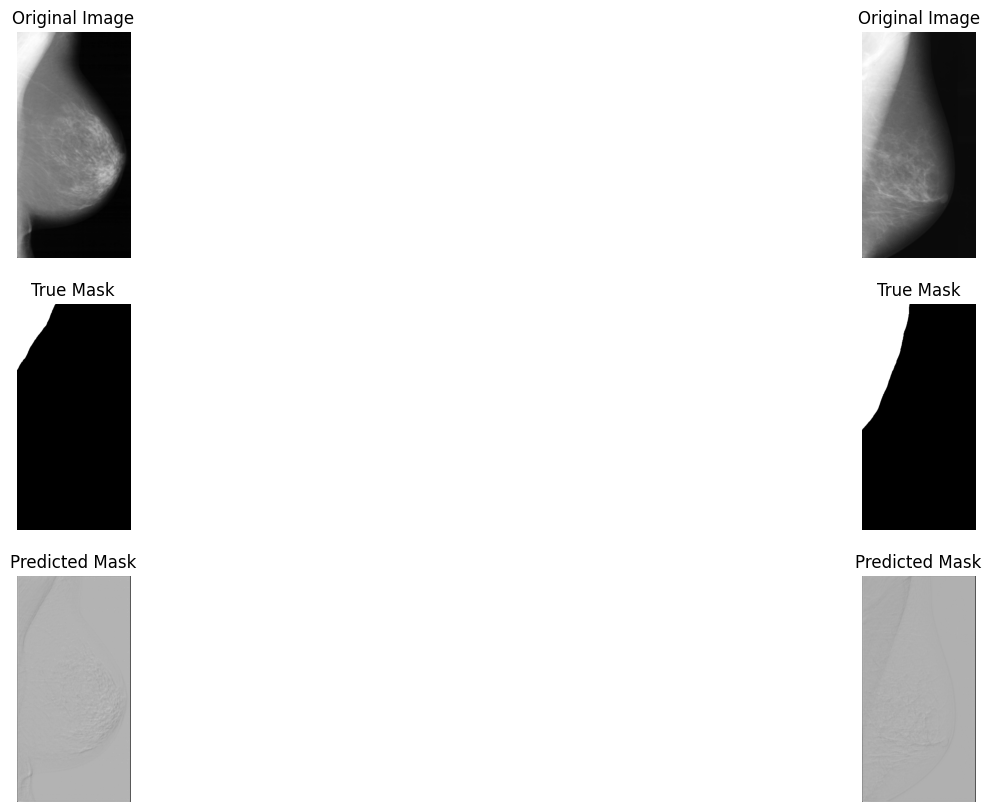

Epoch 1/150, Train Loss: 0.9983, Validation Loss: 0.9986, Dice Coef: 0.0014, Precision: 0.8055, Sensitivity: 0.4172, Specificity: 0.9855, IoU: 0.3822


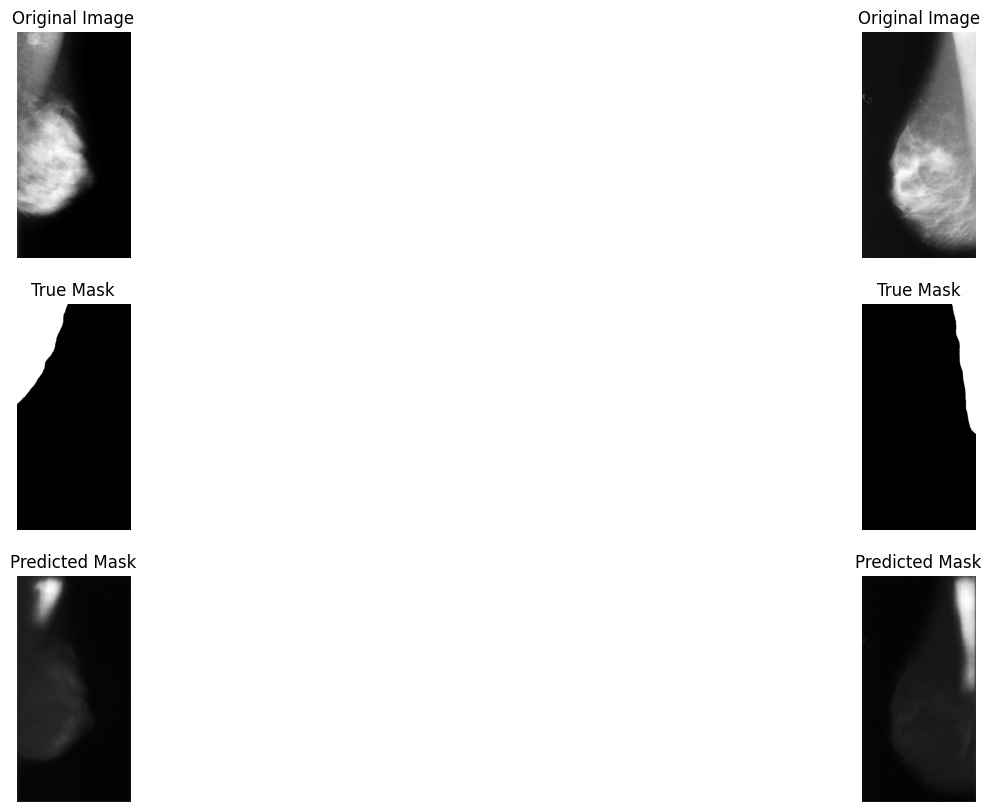

Epoch 2/150, Train Loss: 0.9978, Validation Loss: 0.9977, Dice Coef: 0.0023, Precision: 0.7320, Sensitivity: 0.7508, Specificity: 0.9656, IoU: 0.6198


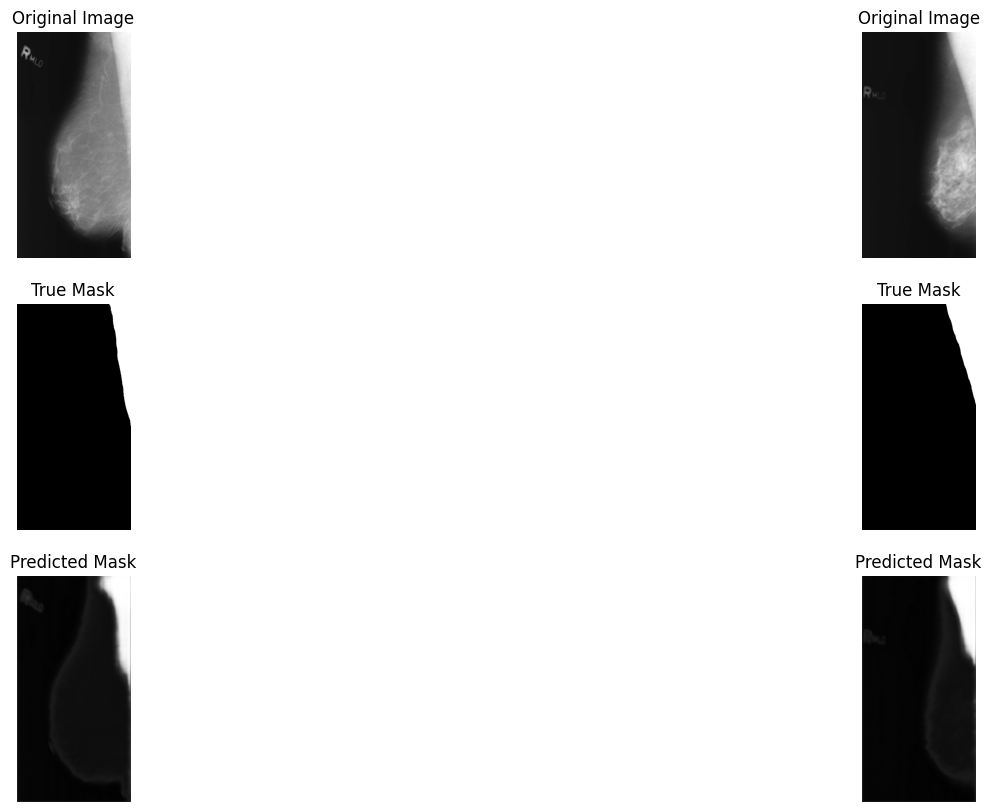

Epoch 3/150, Train Loss: 0.9976, Validation Loss: 0.9974, Dice Coef: 0.0026, Precision: 0.8028, Sensitivity: 0.7362, Specificity: 0.9769, IoU: 0.6516


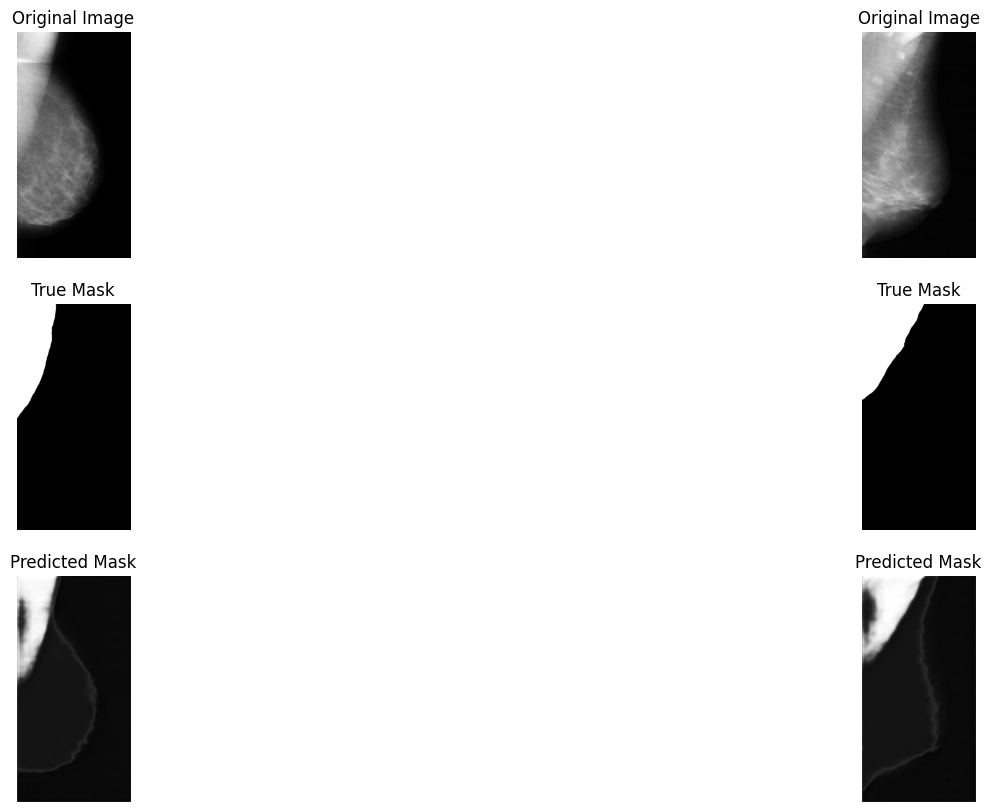

Epoch 4/150, Train Loss: 0.9975, Validation Loss: 0.9972, Dice Coef: 0.0028, Precision: 0.6983, Sensitivity: 0.8048, Specificity: 0.9522, IoU: 0.6246


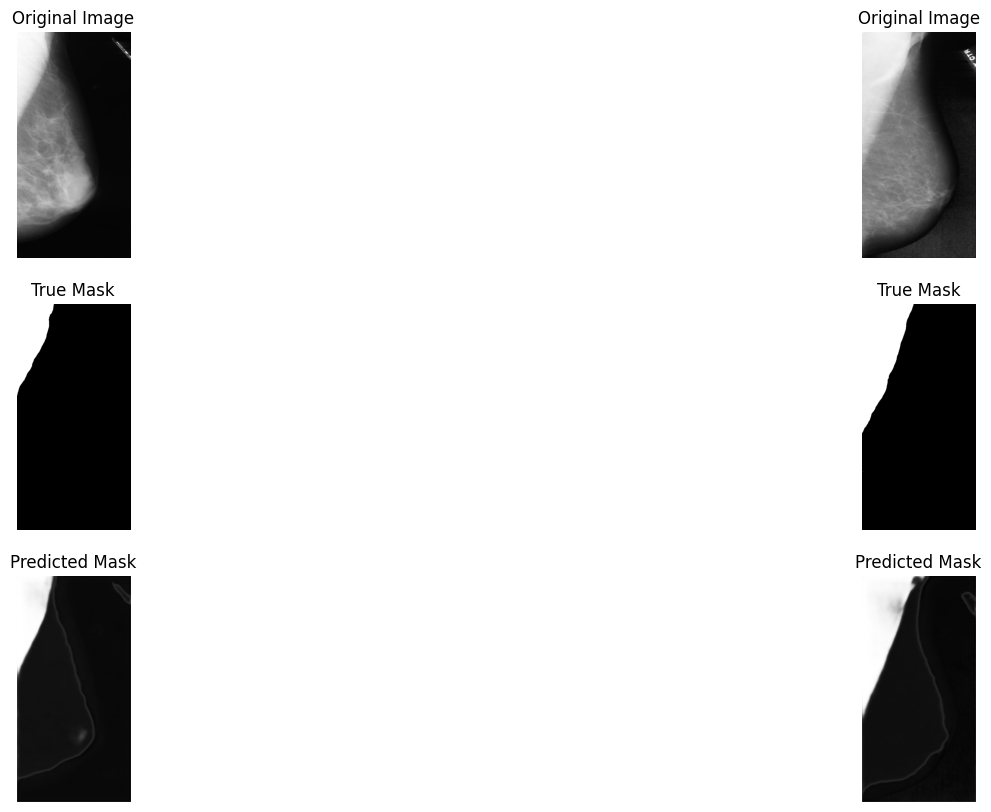

Epoch 5/150, Train Loss: 0.9974, Validation Loss: 0.9971, Dice Coef: 0.0029, Precision: 0.6534, Sensitivity: 0.8157, Specificity: 0.9481, IoU: 0.5939


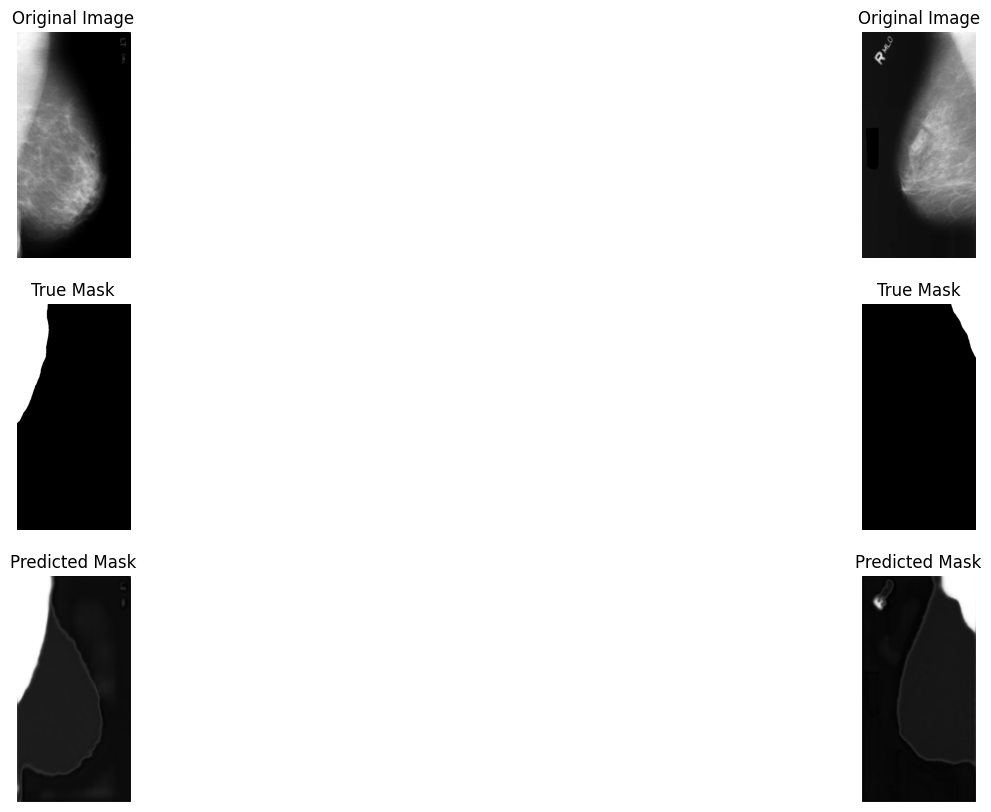

Epoch 6/150, Train Loss: 0.9973, Validation Loss: 0.9974, Dice Coef: 0.0026, Precision: 0.8114, Sensitivity: 0.5952, Specificity: 0.9831, IoU: 0.5455


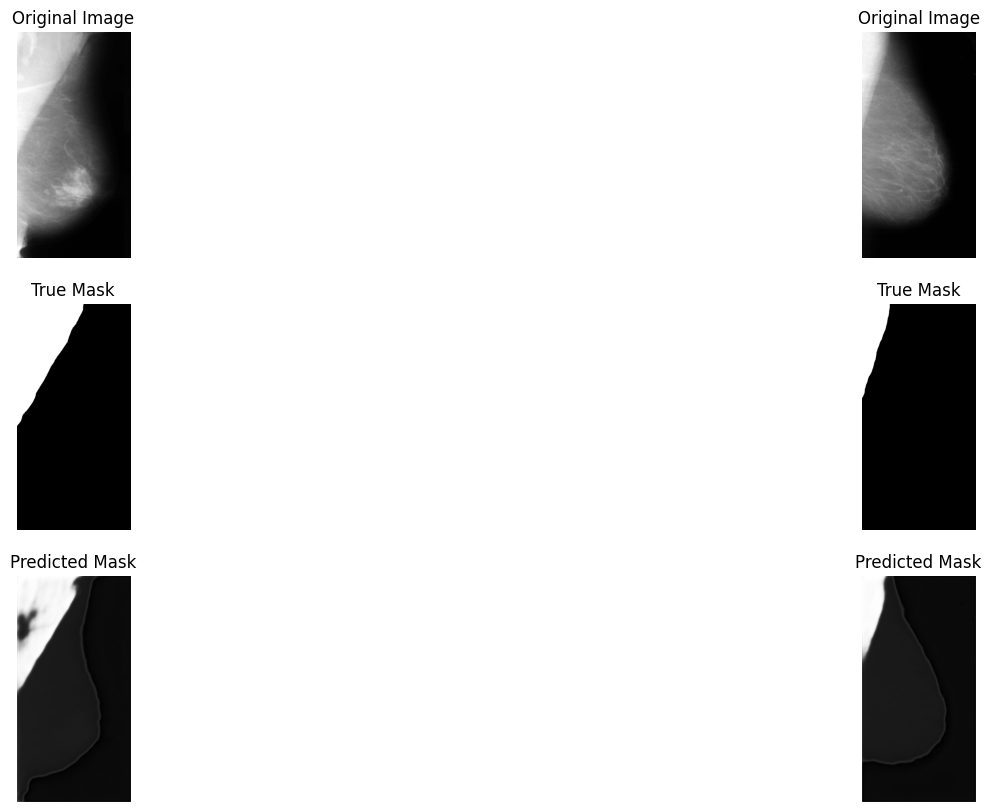

Epoch 7/150, Train Loss: 0.9972, Validation Loss: 0.9969, Dice Coef: 0.0031, Precision: 0.7882, Sensitivity: 0.7568, Specificity: 0.9724, IoU: 0.6577


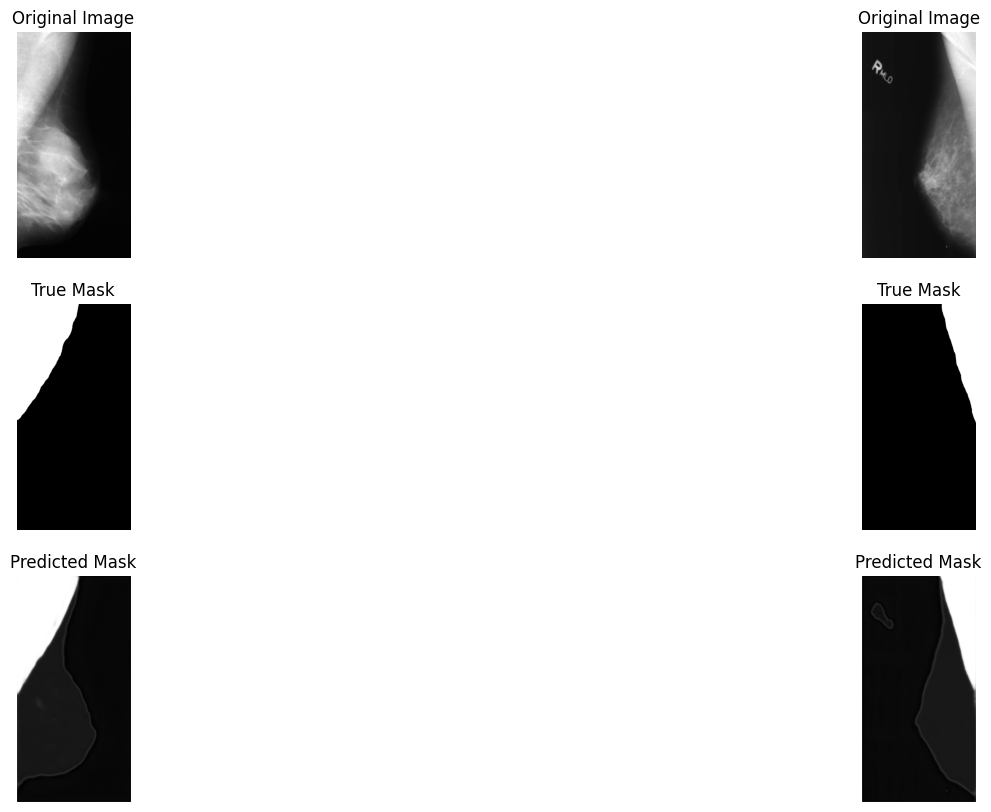

Epoch 8/150, Train Loss: 0.9971, Validation Loss: 0.9970, Dice Coef: 0.0030, Precision: 0.7254, Sensitivity: 0.8003, Specificity: 0.9584, IoU: 0.6437


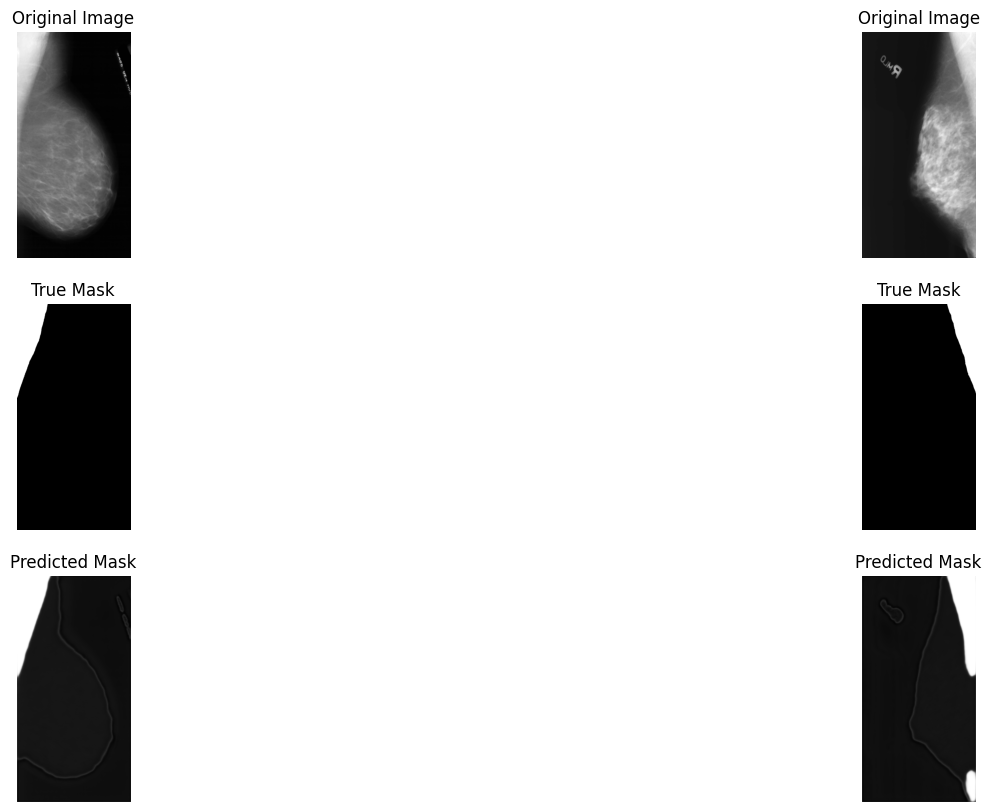

Epoch 9/150, Train Loss: 0.9970, Validation Loss: 0.9968, Dice Coef: 0.0032, Precision: 0.7757, Sensitivity: 0.7673, Specificity: 0.9699, IoU: 0.6580


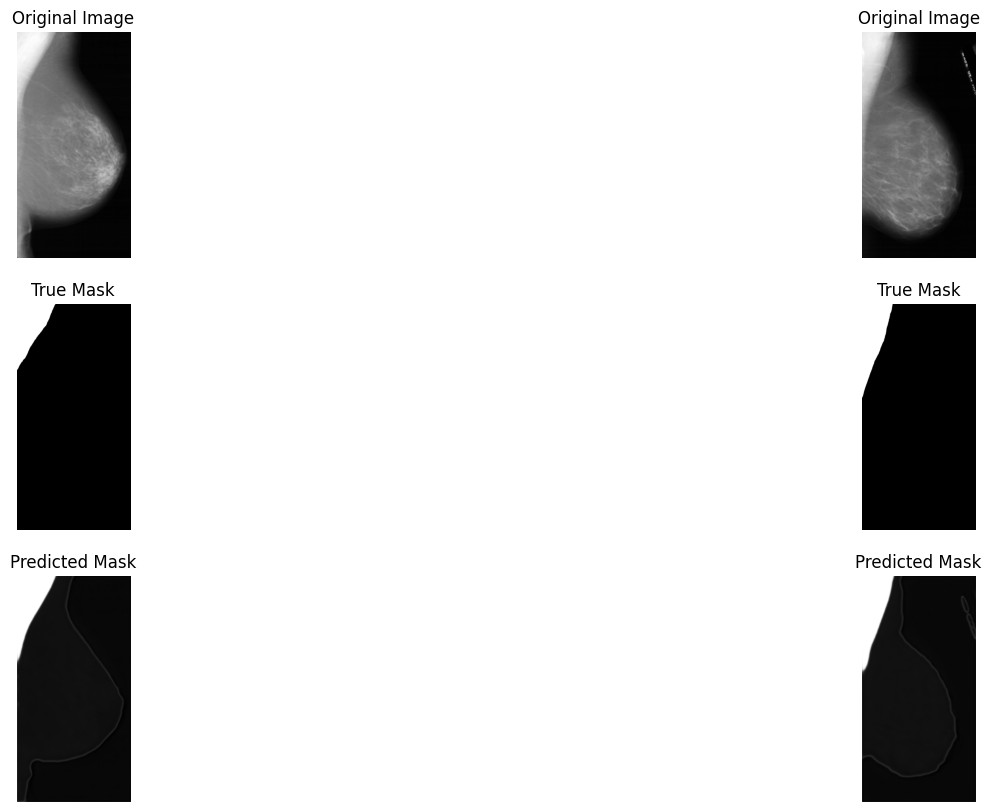

Epoch 10/150, Train Loss: 0.9969, Validation Loss: 0.9968, Dice Coef: 0.0032, Precision: 0.8011, Sensitivity: 0.7096, Specificity: 0.9768, IoU: 0.6276


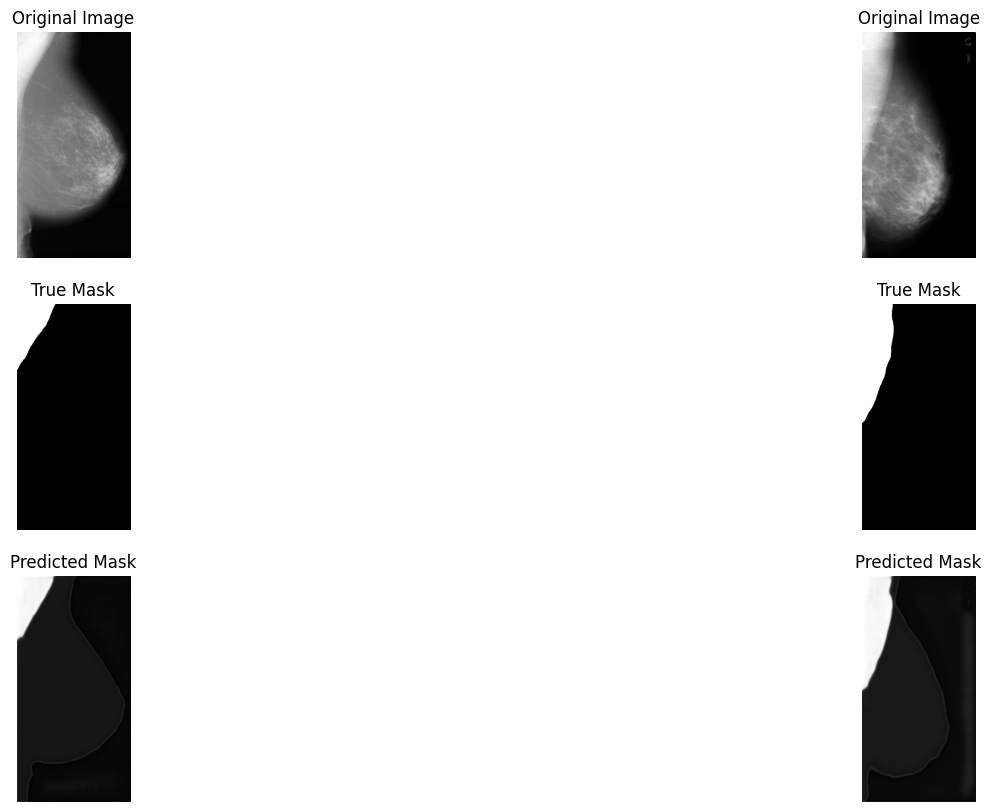

Epoch 11/150, Train Loss: 0.9968, Validation Loss: 0.9966, Dice Coef: 0.0034, Precision: 0.7459, Sensitivity: 0.7811, Specificity: 0.9633, IoU: 0.6449


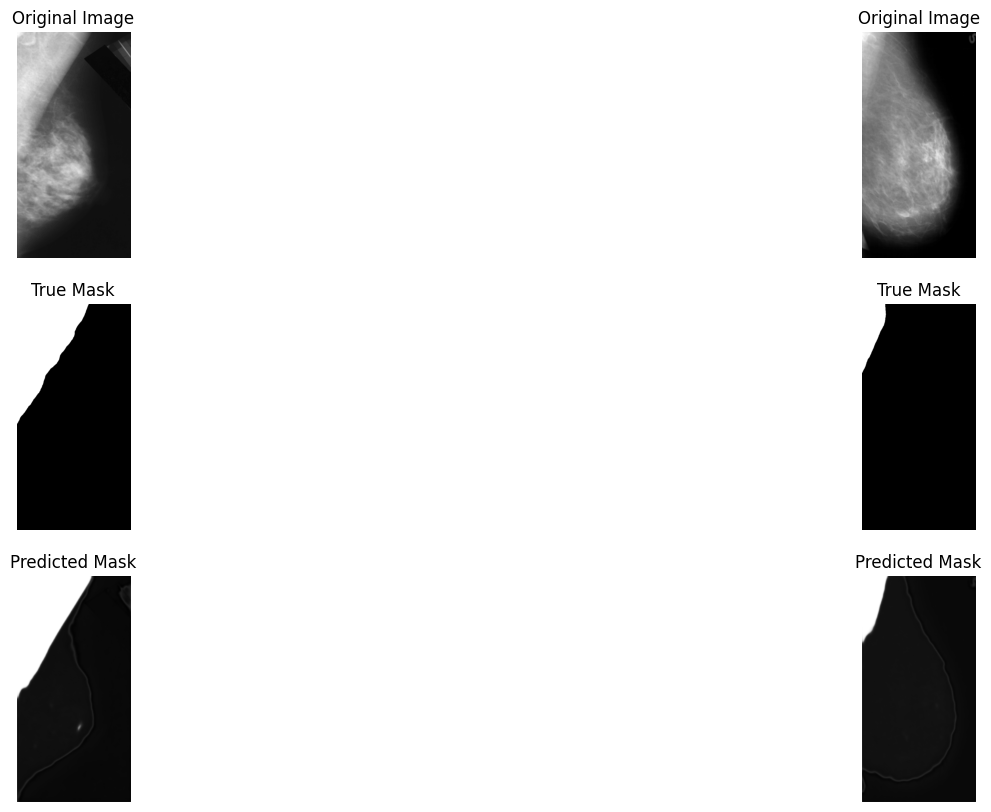

Epoch 12/150, Train Loss: 0.9967, Validation Loss: 0.9963, Dice Coef: 0.0037, Precision: 0.7706, Sensitivity: 0.7586, Specificity: 0.9729, IoU: 0.6508


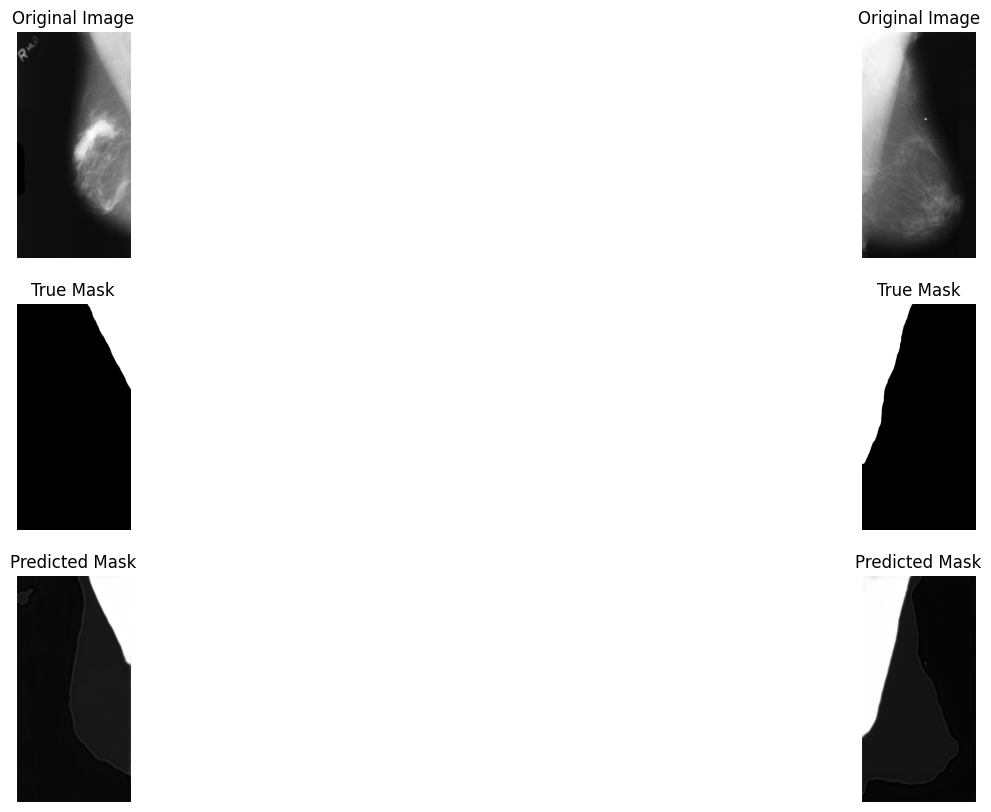

Epoch 13/150, Train Loss: 0.9967, Validation Loss: 0.9967, Dice Coef: 0.0033, Precision: 0.6424, Sensitivity: 0.8370, Specificity: 0.9355, IoU: 0.6023


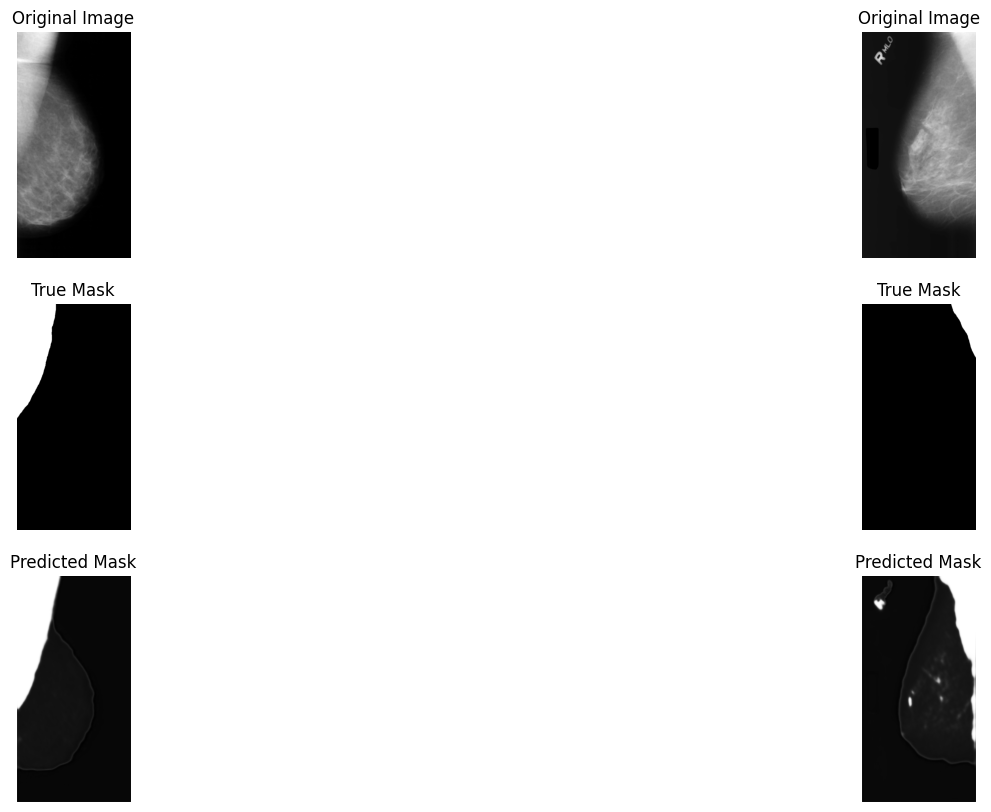

Epoch 14/150, Train Loss: 0.9966, Validation Loss: 0.9965, Dice Coef: 0.0035, Precision: 0.8061, Sensitivity: 0.6906, Specificity: 0.9786, IoU: 0.6207


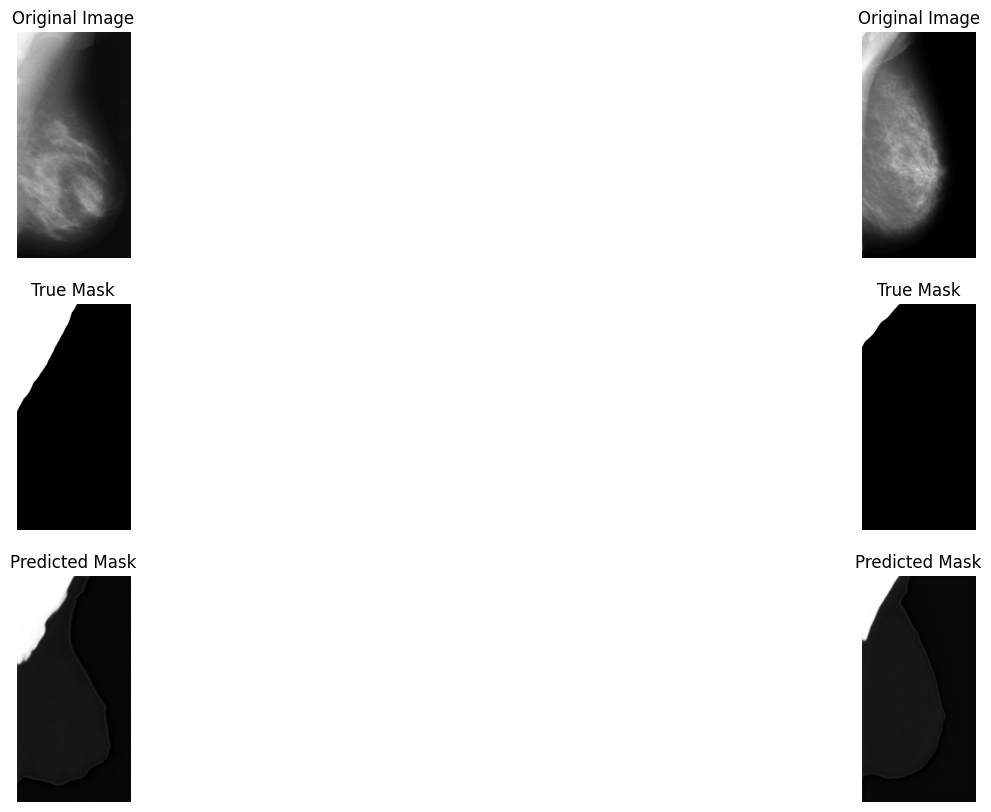

Epoch 15/150, Train Loss: 0.9965, Validation Loss: 0.9963, Dice Coef: 0.0037, Precision: 0.7855, Sensitivity: 0.7600, Specificity: 0.9725, IoU: 0.6595


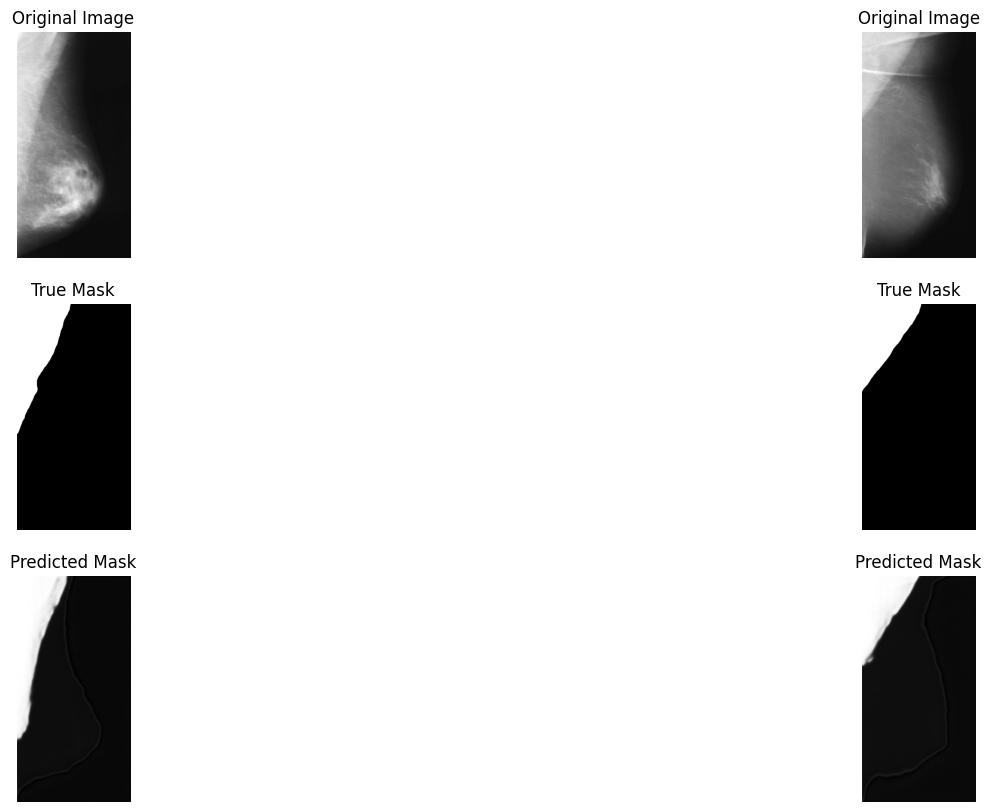

Epoch 16/150, Train Loss: 0.9964, Validation Loss: 0.9969, Dice Coef: 0.0031, Precision: 0.4936, Sensitivity: 0.8345, Specificity: 0.8825, IoU: 0.4750


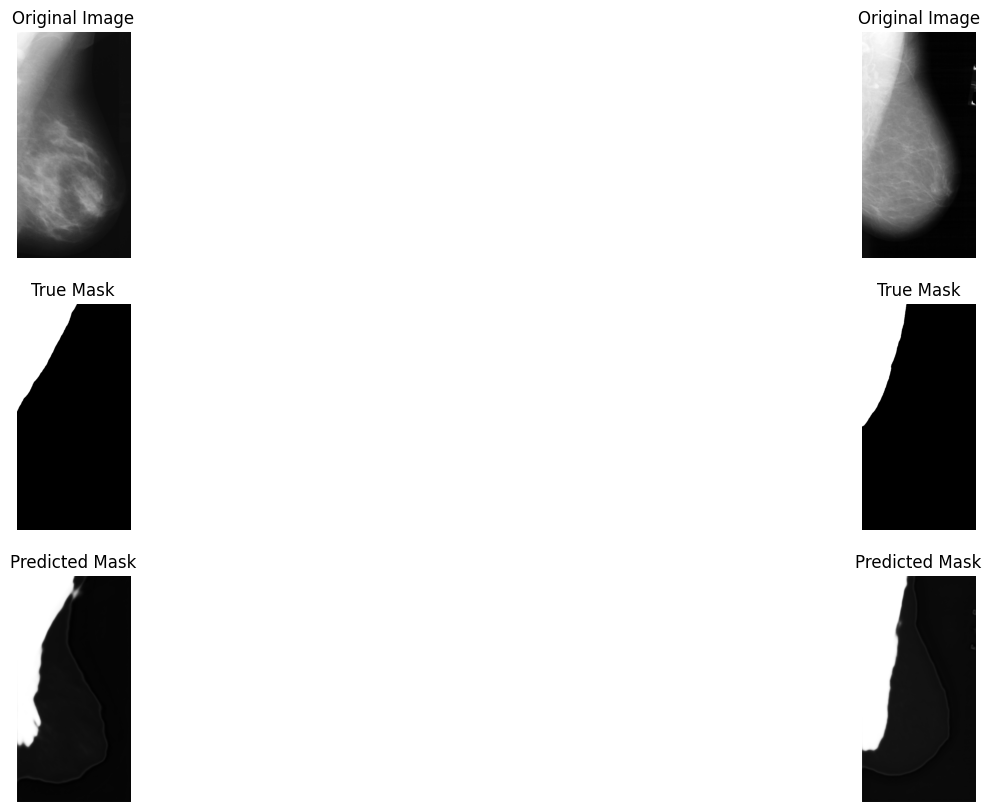

Epoch 17/150, Train Loss: 0.9963, Validation Loss: 0.9962, Dice Coef: 0.0038, Precision: 0.7131, Sensitivity: 0.8046, Specificity: 0.9537, IoU: 0.6382


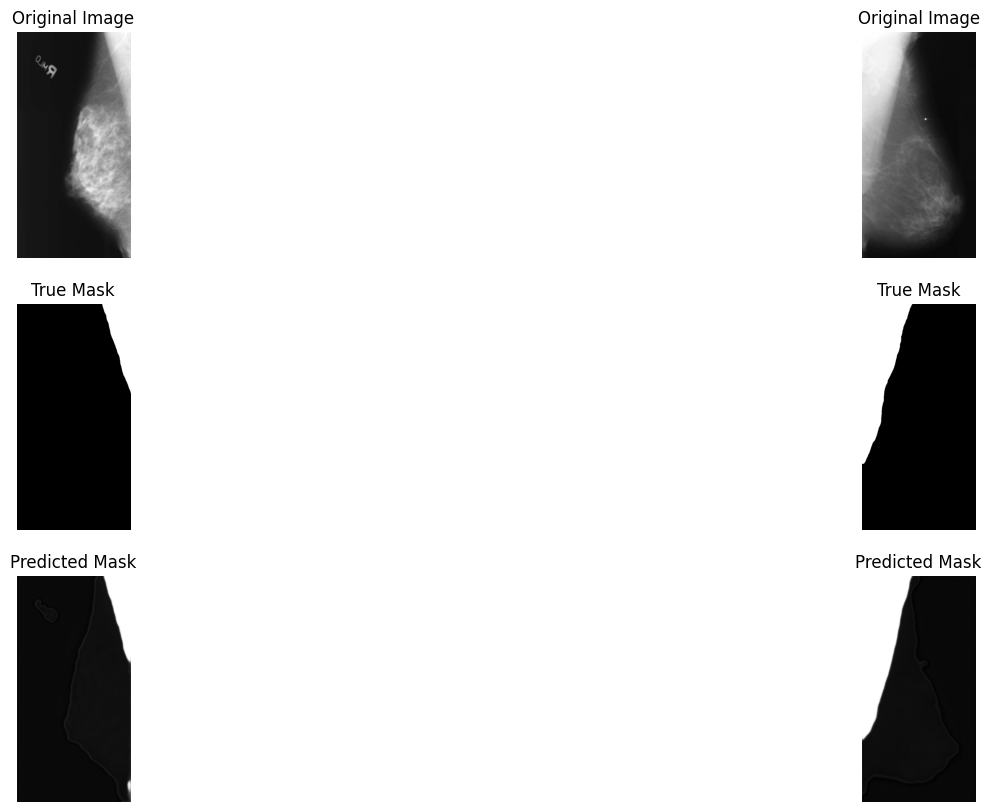

Epoch 18/150, Train Loss: 0.9962, Validation Loss: 0.9958, Dice Coef: 0.0042, Precision: 0.7859, Sensitivity: 0.7178, Specificity: 0.9731, IoU: 0.6284


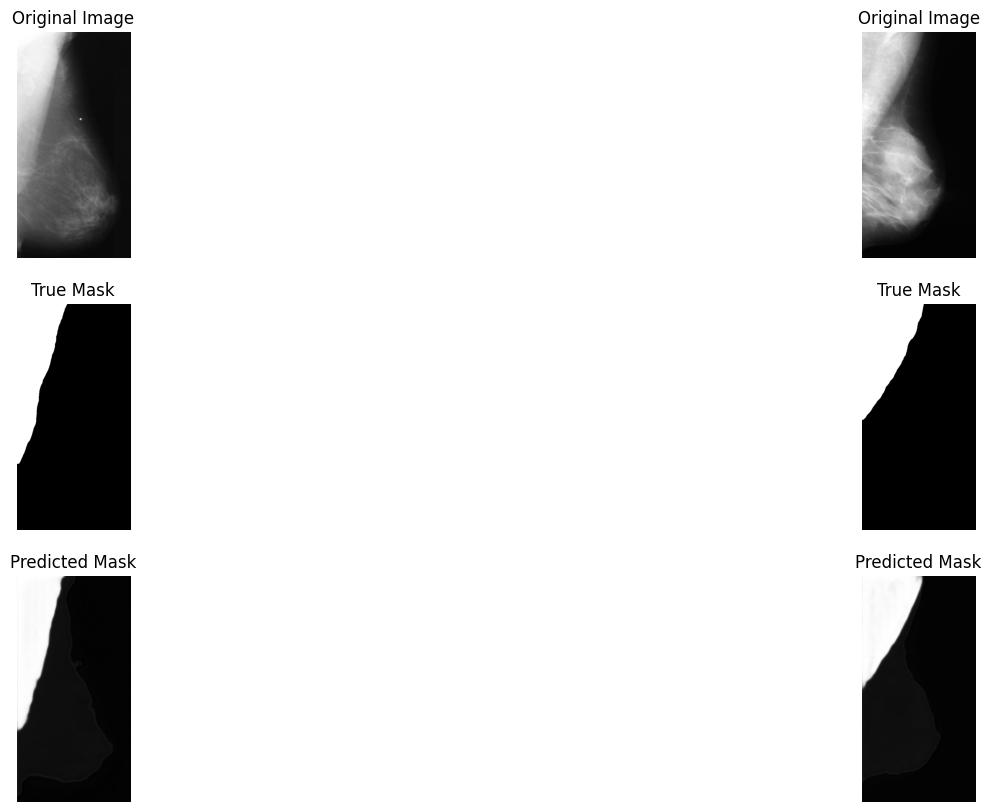

Epoch 19/150, Train Loss: 0.9960, Validation Loss: 0.9958, Dice Coef: 0.0042, Precision: 0.8164, Sensitivity: 0.7312, Specificity: 0.9796, IoU: 0.6587


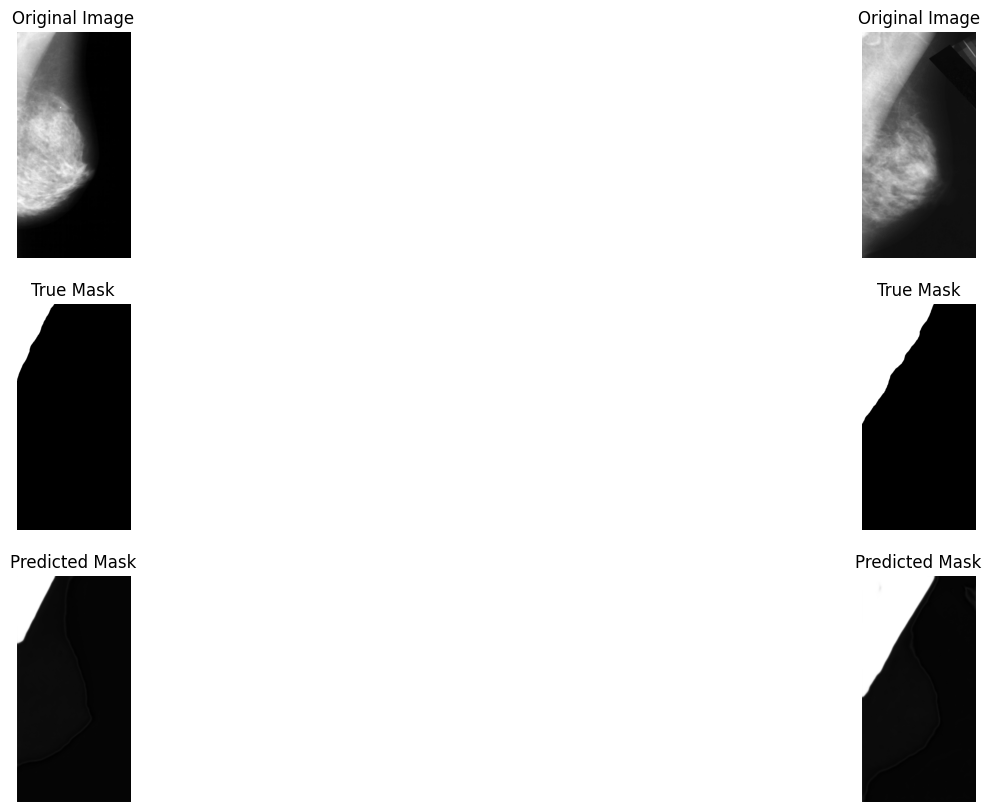

Epoch 20/150, Train Loss: 0.9959, Validation Loss: 0.9957, Dice Coef: 0.0043, Precision: 0.7146, Sensitivity: 0.7994, Specificity: 0.9551, IoU: 0.6430


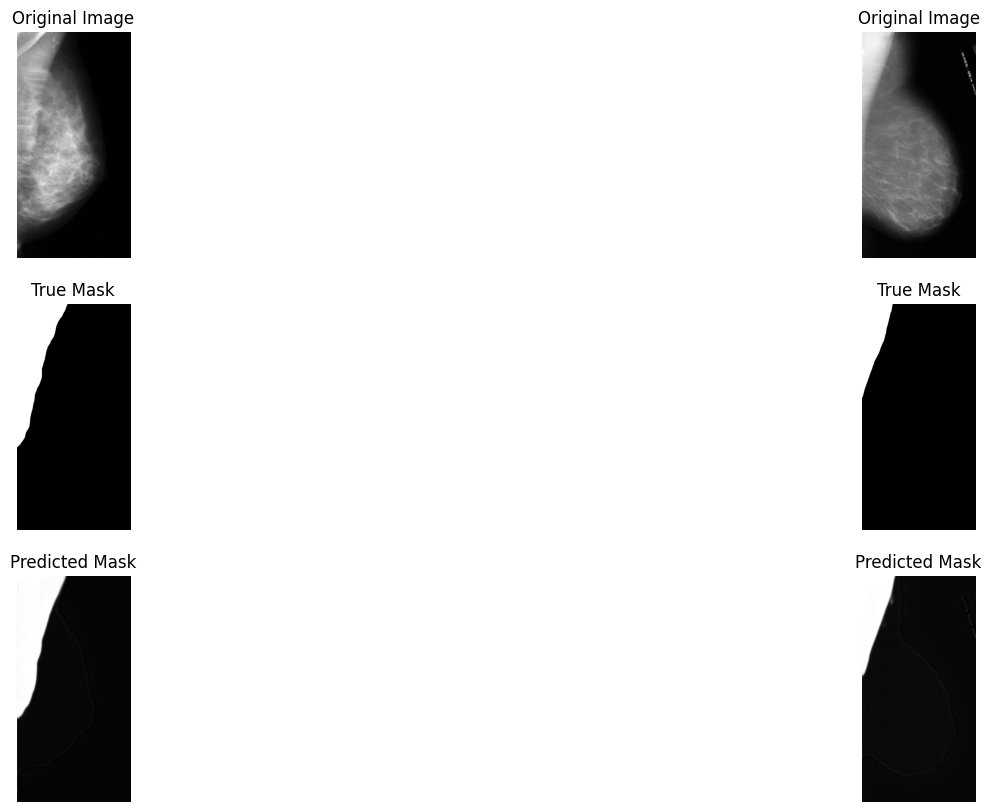

Epoch 21/150, Train Loss: 0.9958, Validation Loss: 0.9958, Dice Coef: 0.0042, Precision: 0.7132, Sensitivity: 0.7981, Specificity: 0.9609, IoU: 0.6341


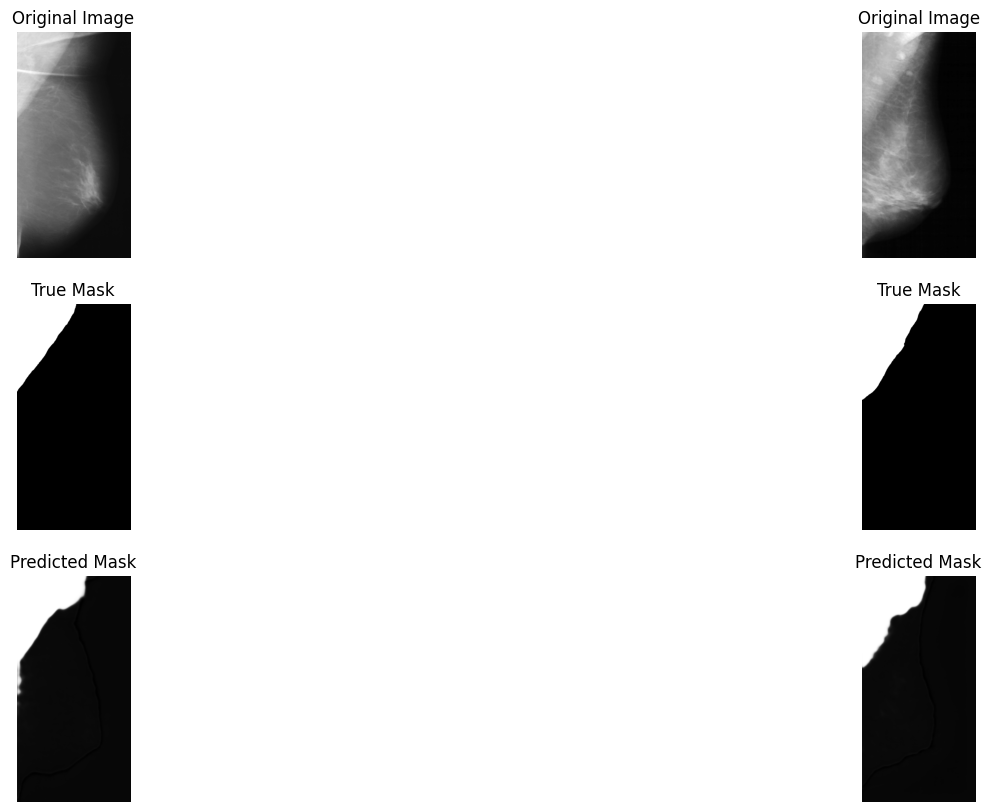

Epoch 22/150, Train Loss: 0.9956, Validation Loss: 0.9954, Dice Coef: 0.0046, Precision: 0.8102, Sensitivity: 0.7217, Specificity: 0.9798, IoU: 0.6521


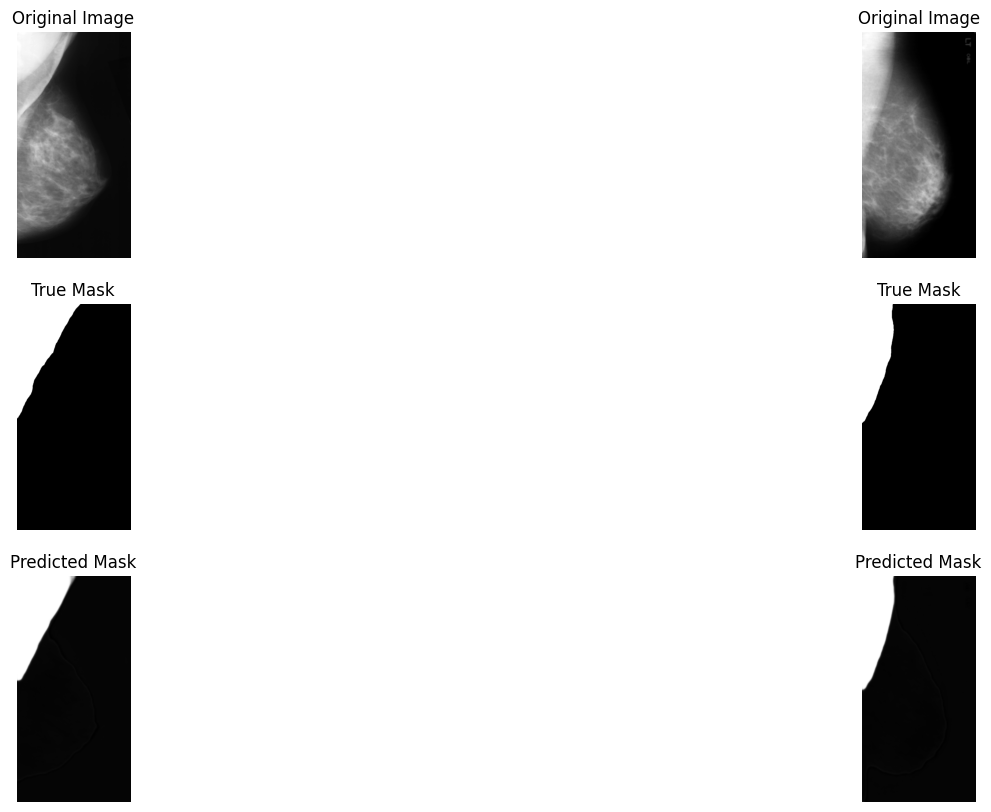

Epoch 23/150, Train Loss: 0.9955, Validation Loss: 0.9953, Dice Coef: 0.0047, Precision: 0.8165, Sensitivity: 0.7206, Specificity: 0.9785, IoU: 0.6452


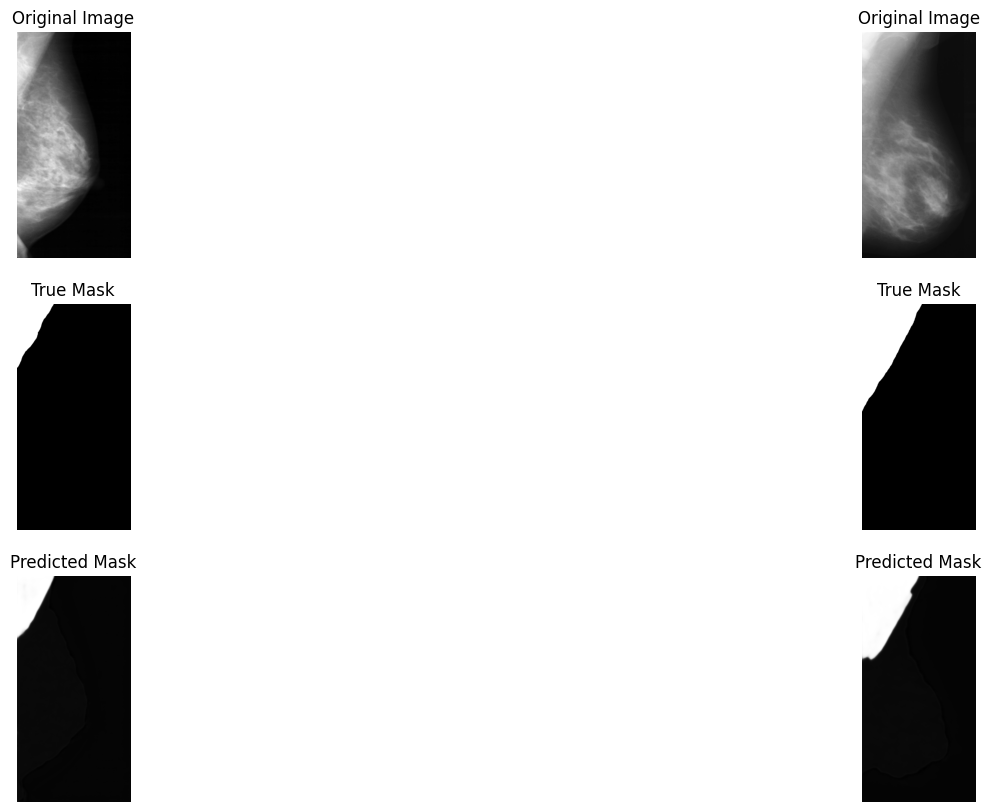

Epoch 24/150, Train Loss: 0.9955, Validation Loss: 0.9951, Dice Coef: 0.0049, Precision: 0.8021, Sensitivity: 0.7594, Specificity: 0.9747, IoU: 0.6672


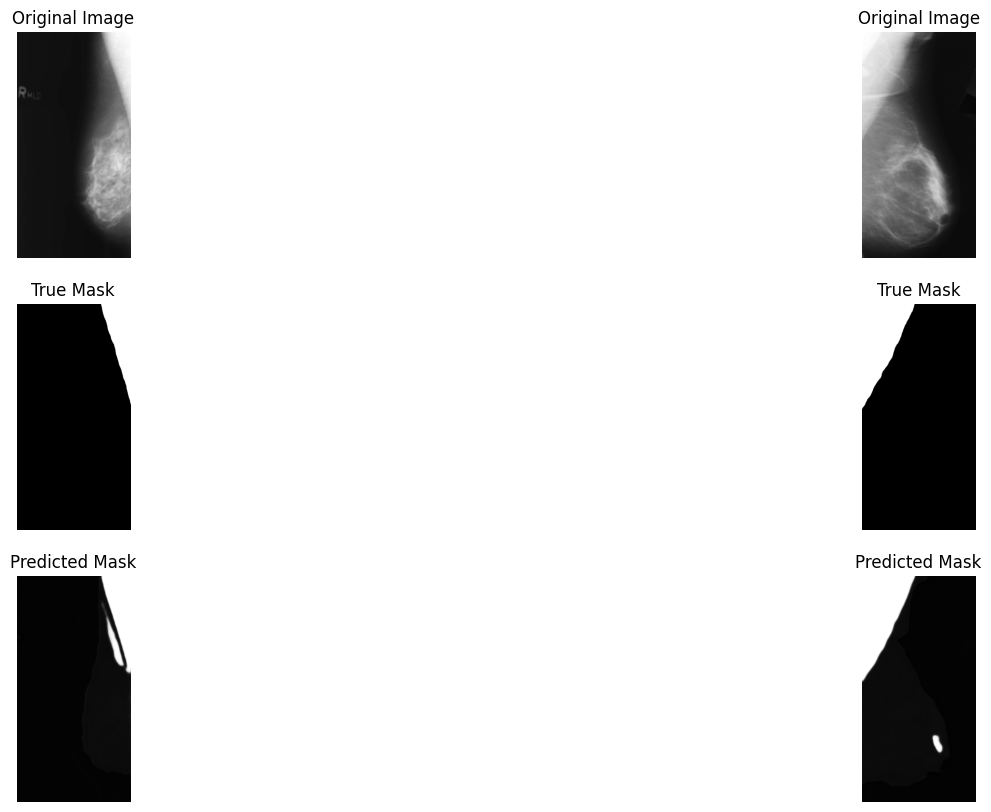

Epoch 25/150, Train Loss: 0.9953, Validation Loss: 0.9949, Dice Coef: 0.0051, Precision: 0.8067, Sensitivity: 0.7448, Specificity: 0.9766, IoU: 0.6612


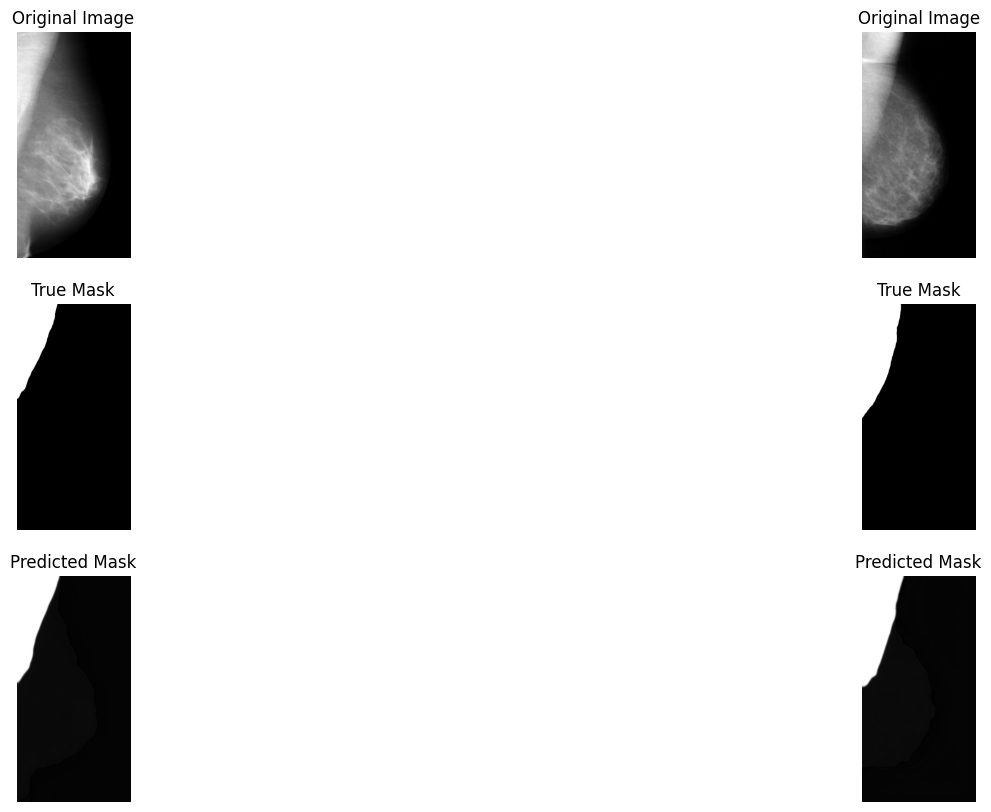

Epoch 26/150, Train Loss: 0.9953, Validation Loss: 0.9954, Dice Coef: 0.0046, Precision: 0.7348, Sensitivity: 0.7368, Specificity: 0.9666, IoU: 0.6125


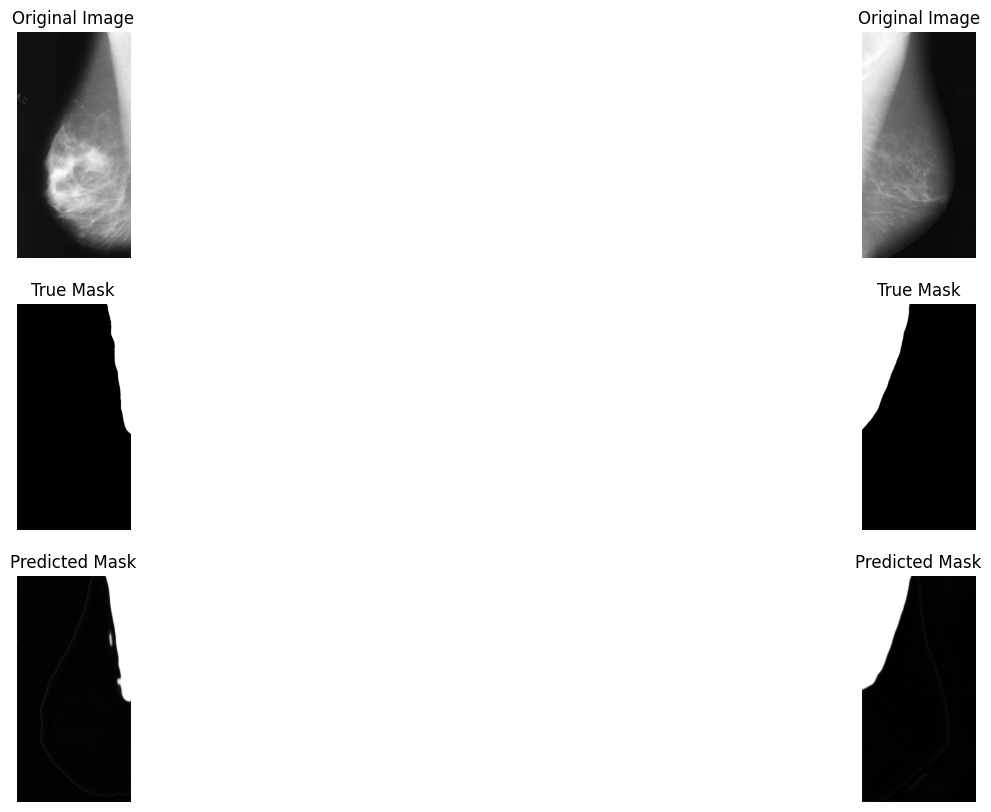

Epoch 27/150, Train Loss: 0.9952, Validation Loss: 0.9950, Dice Coef: 0.0050, Precision: 0.7667, Sensitivity: 0.7435, Specificity: 0.9717, IoU: 0.6355


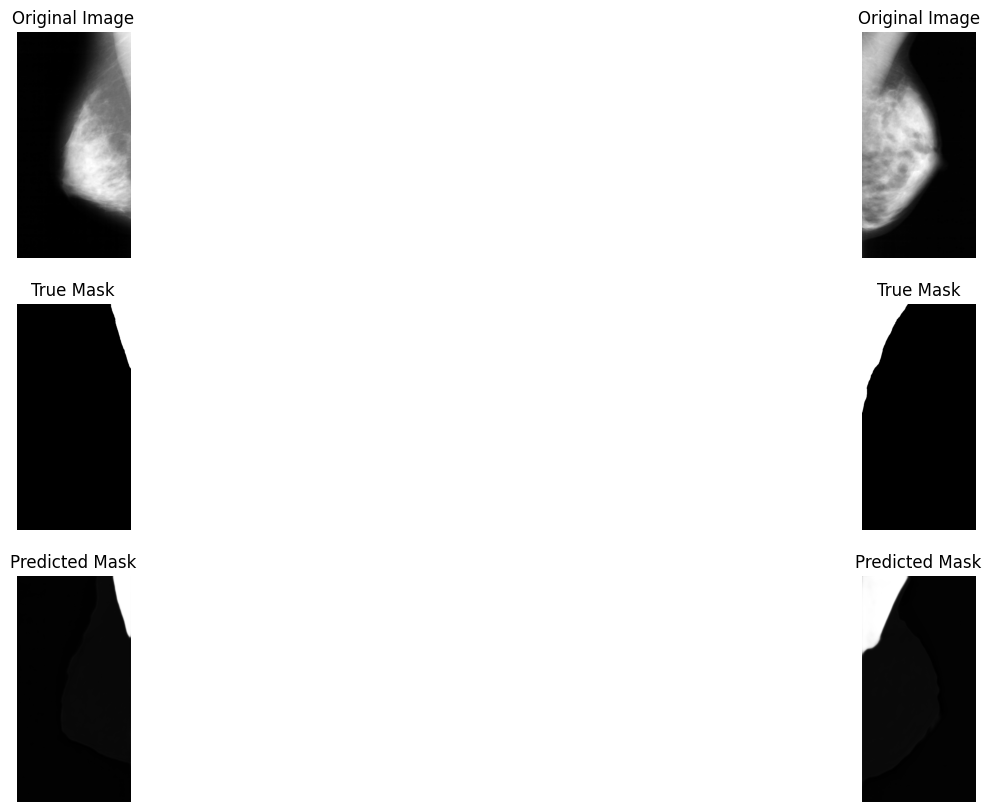

Epoch 28/150, Train Loss: 0.9951, Validation Loss: 0.9947, Dice Coef: 0.0053, Precision: 0.8038, Sensitivity: 0.7328, Specificity: 0.9782, IoU: 0.6550


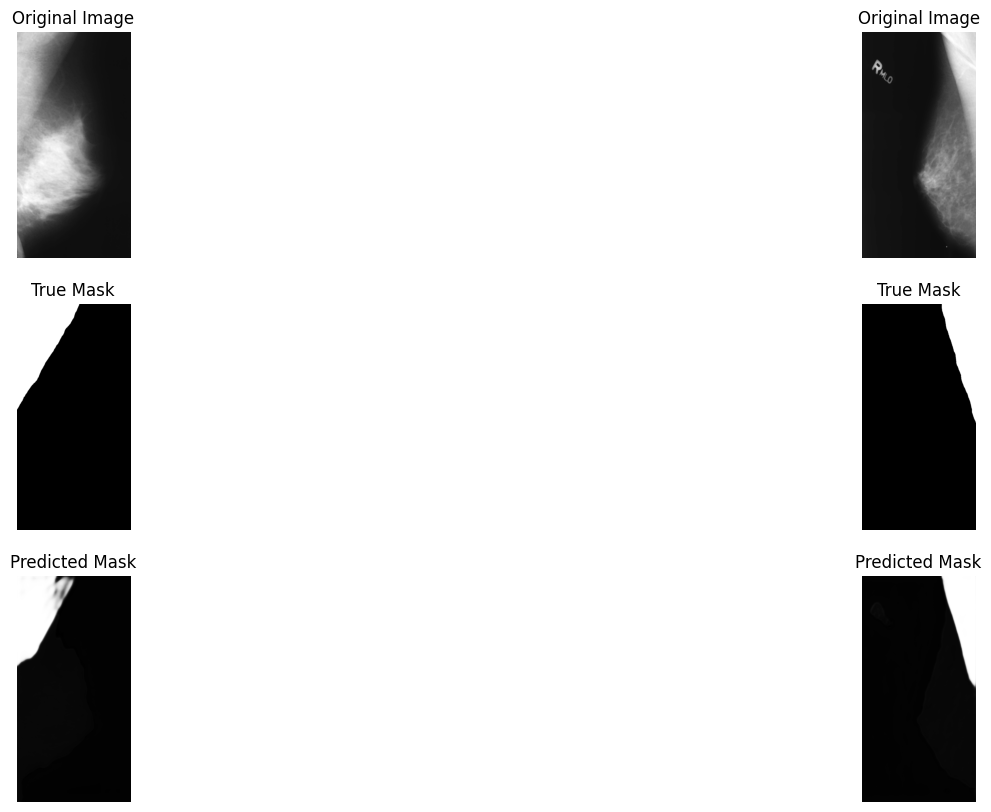

Epoch 29/150, Train Loss: 0.9950, Validation Loss: 0.9959, Dice Coef: 0.0041, Precision: 0.5358, Sensitivity: 0.8146, Specificity: 0.9071, IoU: 0.5038


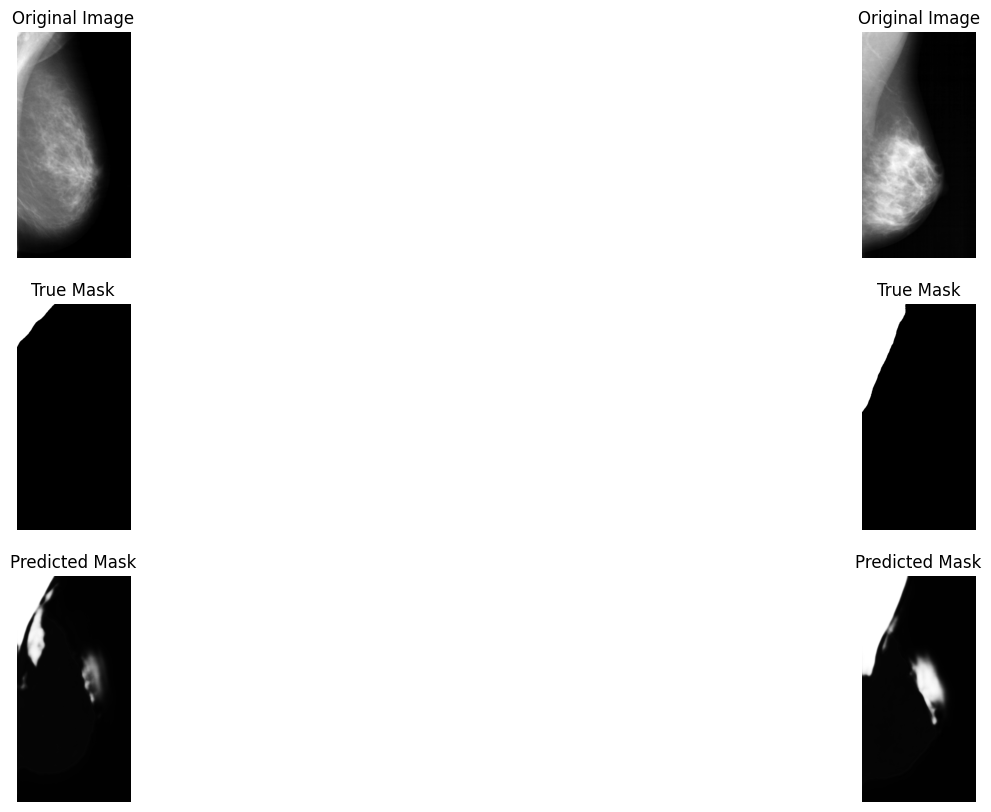

Epoch 30/150, Train Loss: 0.9949, Validation Loss: 0.9944, Dice Coef: 0.0056, Precision: 0.7898, Sensitivity: 0.7199, Specificity: 0.9744, IoU: 0.6331


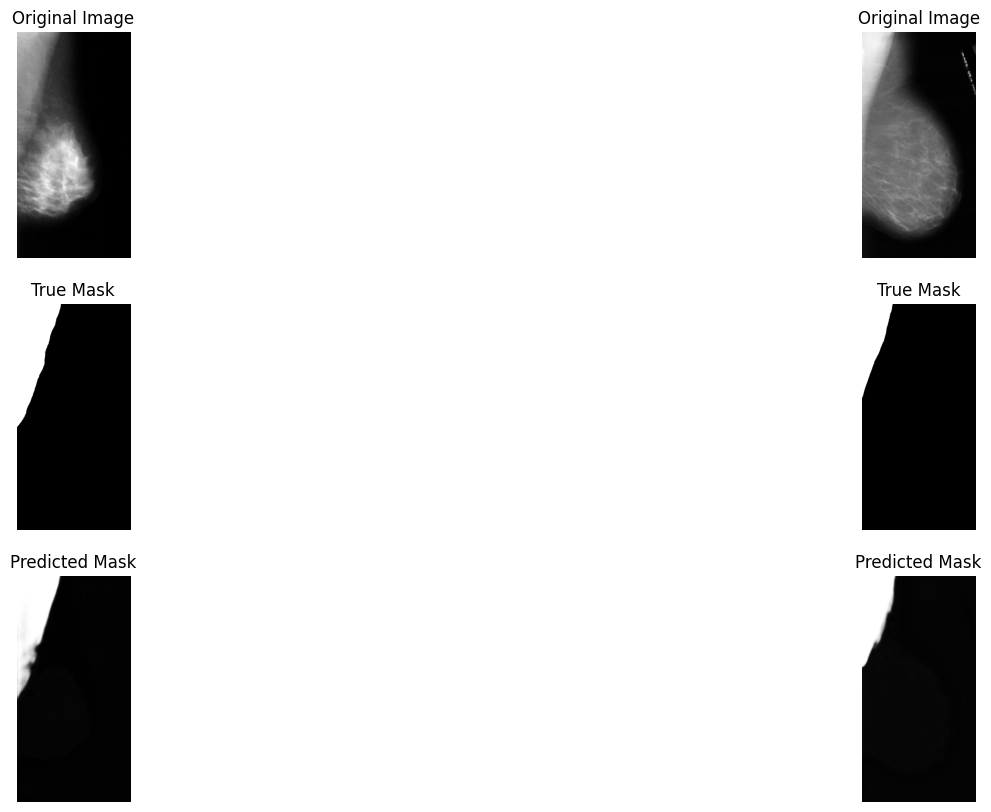

Epoch 31/150, Train Loss: 0.9948, Validation Loss: 0.9950, Dice Coef: 0.0050, Precision: 0.6560, Sensitivity: 0.8126, Specificity: 0.9423, IoU: 0.5922


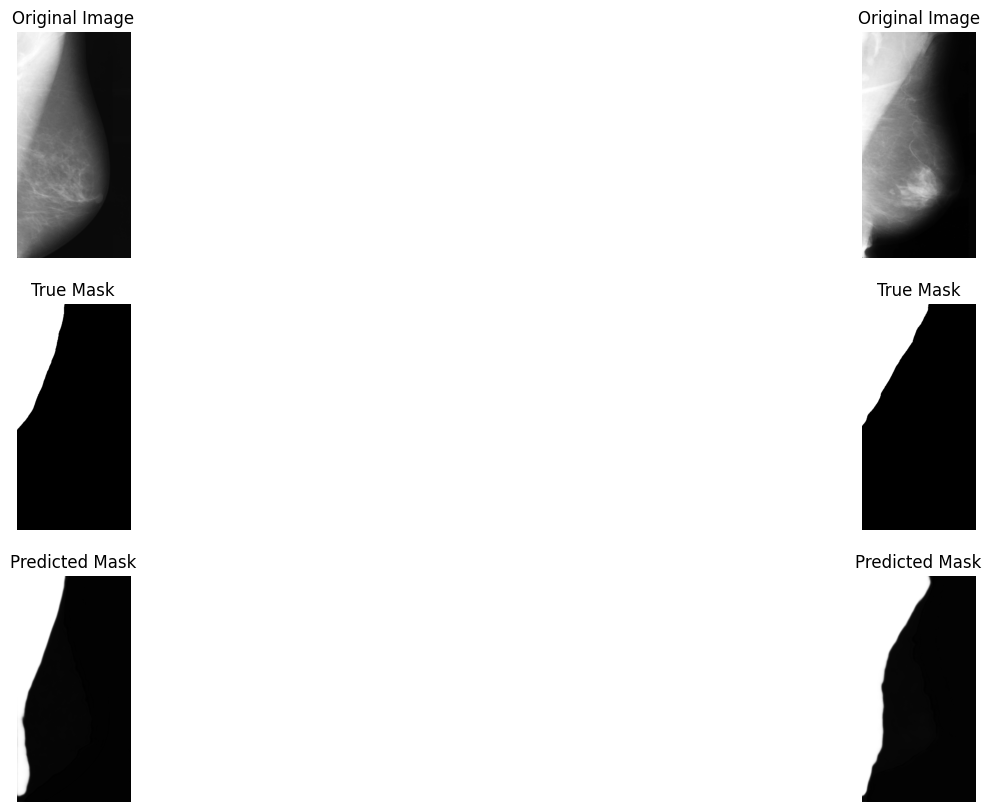

Epoch 32/150, Train Loss: 0.9947, Validation Loss: 0.9951, Dice Coef: 0.0049, Precision: 0.6552, Sensitivity: 0.7480, Specificity: 0.9523, IoU: 0.5625


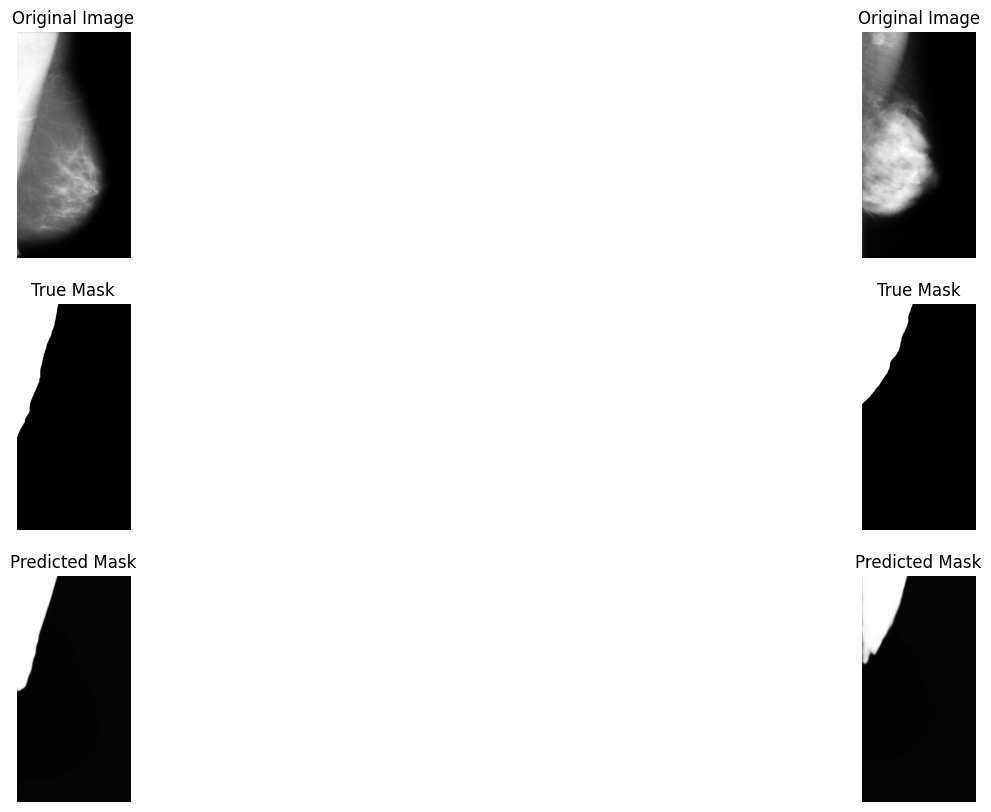

Epoch 33/150, Train Loss: 0.9948, Validation Loss: 0.9952, Dice Coef: 0.0048, Precision: 0.7716, Sensitivity: 0.7499, Specificity: 0.9737, IoU: 0.6469


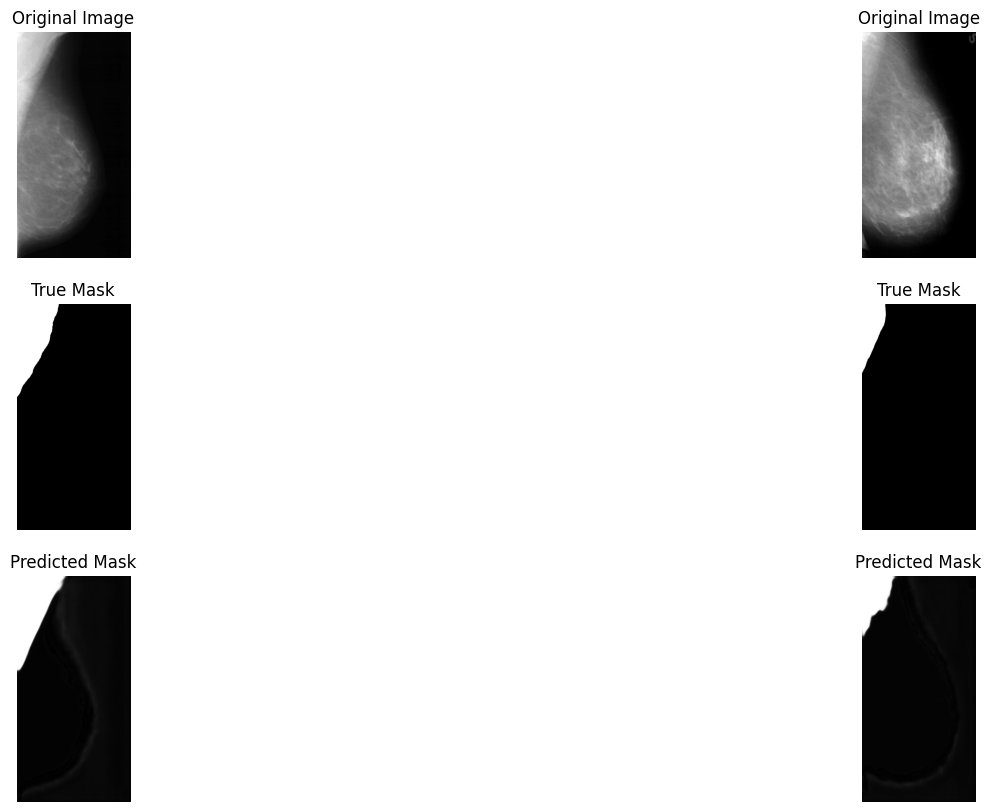

Epoch 34/150, Train Loss: 0.9945, Validation Loss: 0.9942, Dice Coef: 0.0058, Precision: 0.7971, Sensitivity: 0.7180, Specificity: 0.9774, IoU: 0.6374


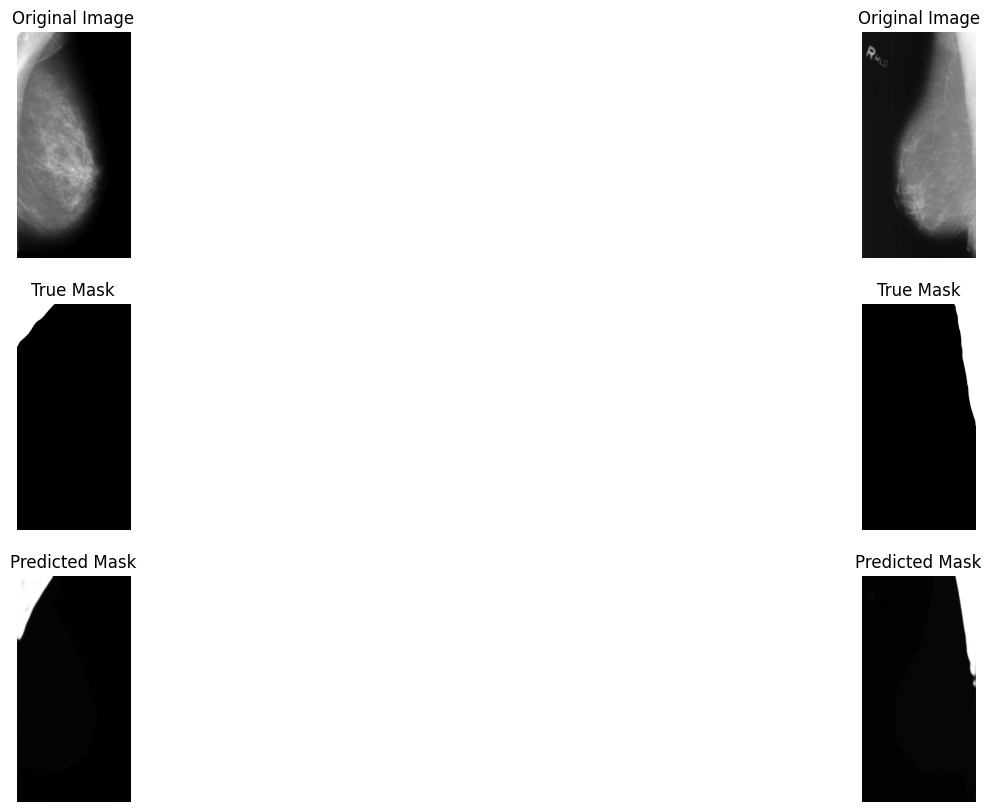

Epoch 35/150, Train Loss: 0.9944, Validation Loss: 0.9940, Dice Coef: 0.0060, Precision: 0.8303, Sensitivity: 0.6570, Specificity: 0.9848, IoU: 0.6111


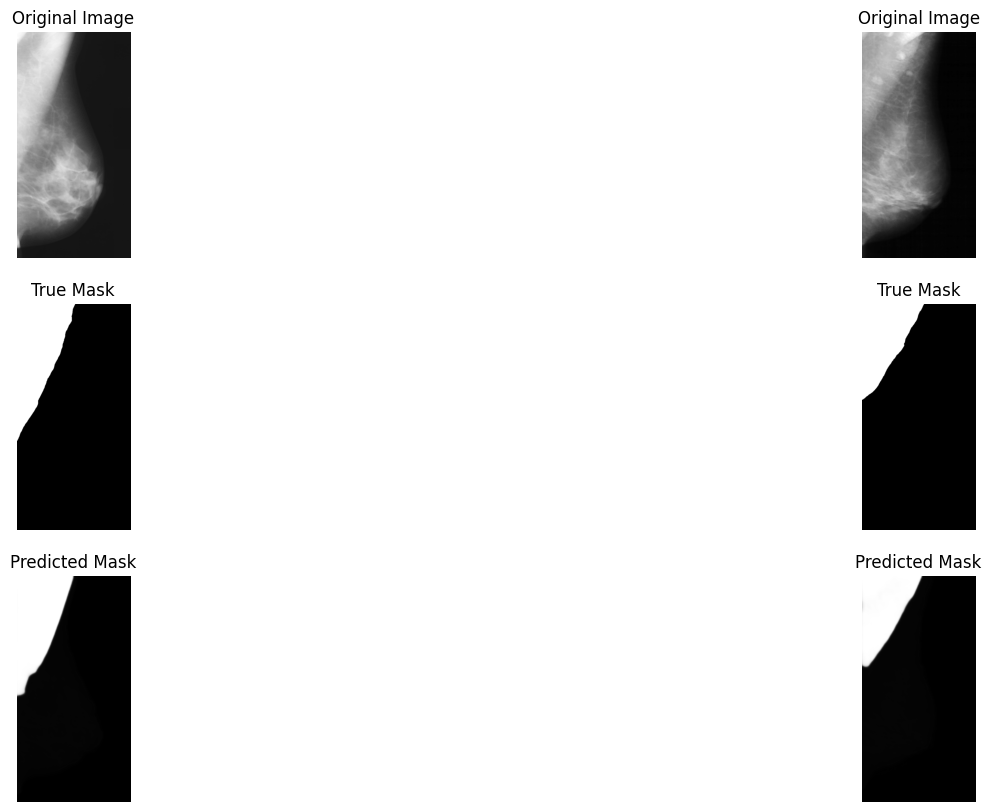

Epoch 36/150, Train Loss: 0.9944, Validation Loss: 0.9942, Dice Coef: 0.0058, Precision: 0.7657, Sensitivity: 0.7264, Specificity: 0.9689, IoU: 0.6227


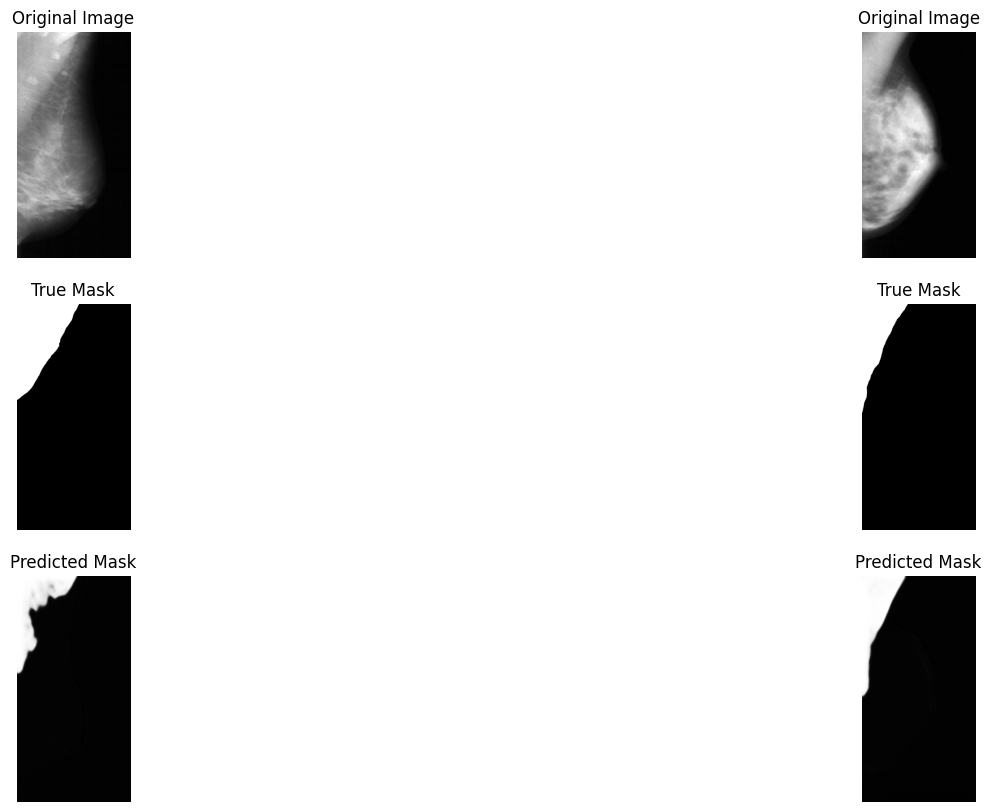

Epoch 37/150, Train Loss: 0.9944, Validation Loss: 0.9939, Dice Coef: 0.0061, Precision: 0.8066, Sensitivity: 0.7169, Specificity: 0.9790, IoU: 0.6427


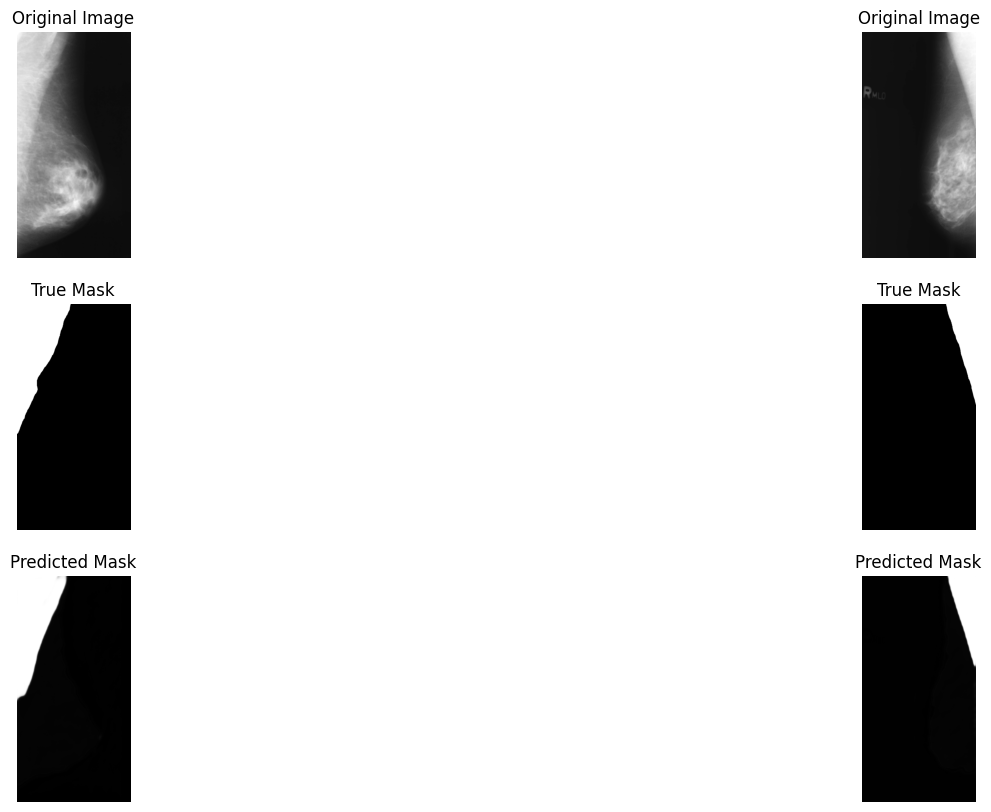

Epoch 38/150, Train Loss: 0.9941, Validation Loss: 0.9938, Dice Coef: 0.0062, Precision: 0.8189, Sensitivity: 0.7313, Specificity: 0.9790, IoU: 0.6576


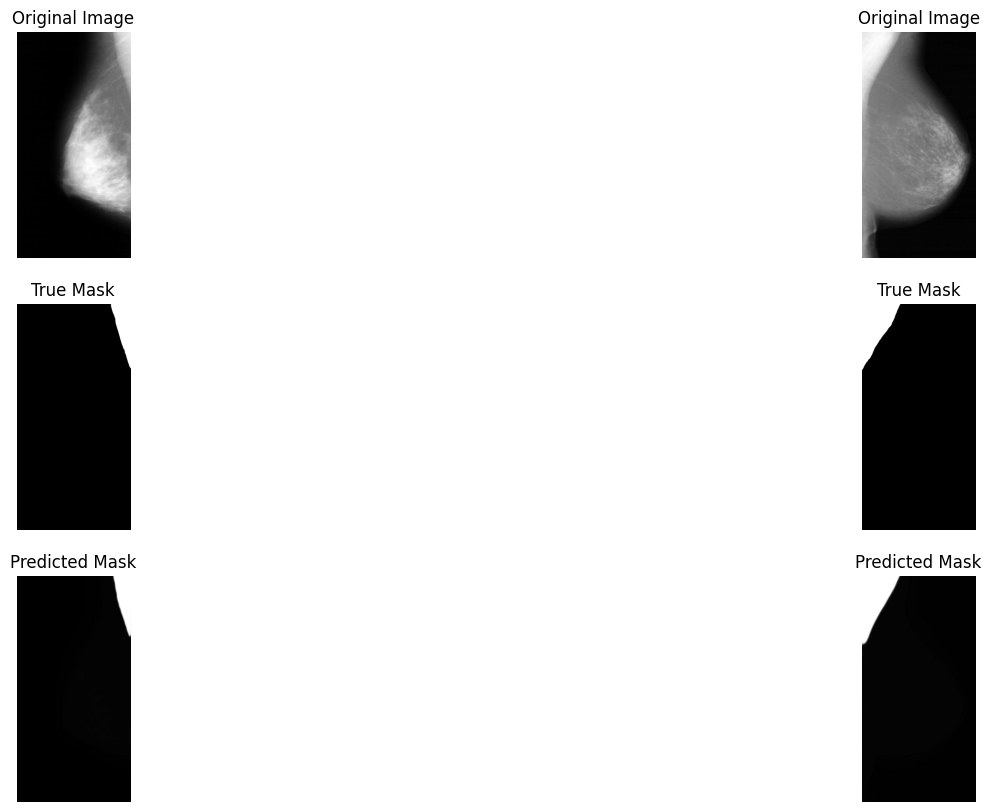

Epoch 39/150, Train Loss: 0.9941, Validation Loss: 0.9937, Dice Coef: 0.0063, Precision: 0.8241, Sensitivity: 0.6994, Specificity: 0.9809, IoU: 0.6360


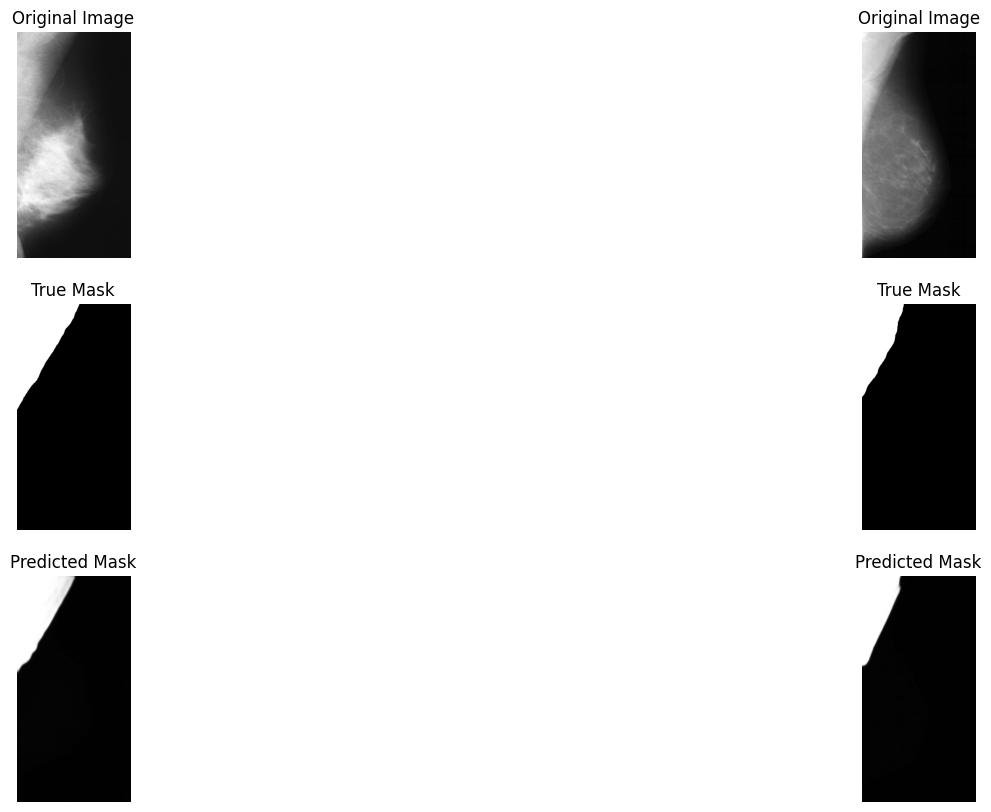

Epoch 40/150, Train Loss: 0.9939, Validation Loss: 0.9937, Dice Coef: 0.0063, Precision: 0.8091, Sensitivity: 0.7381, Specificity: 0.9758, IoU: 0.6535


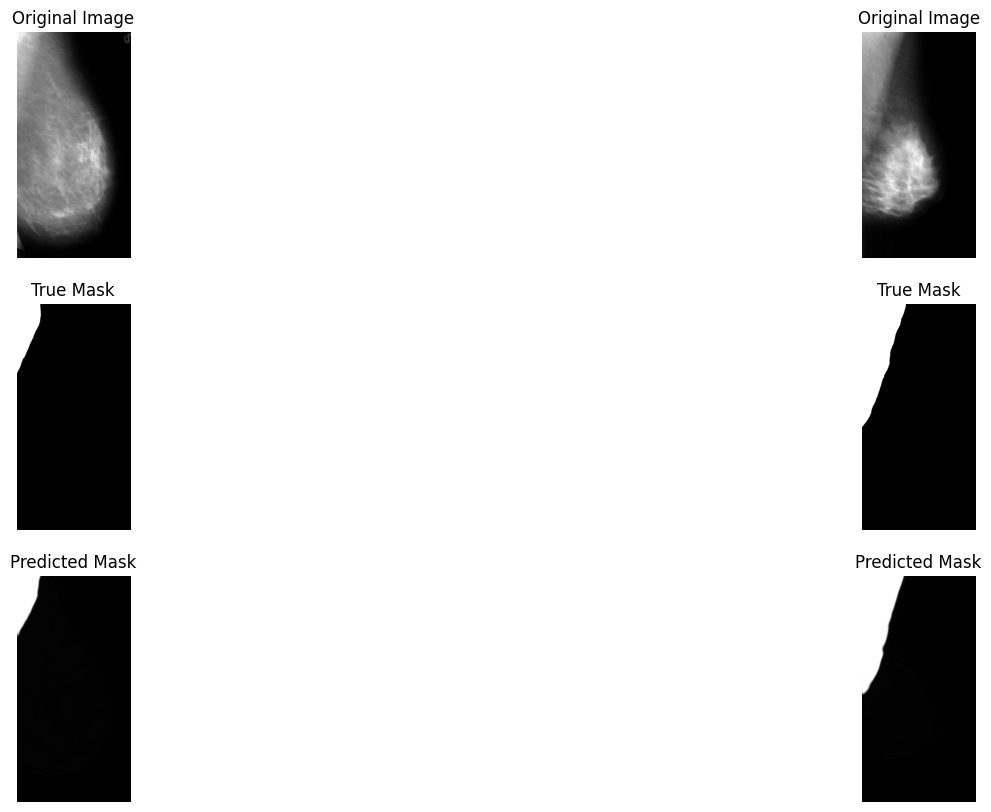

Epoch 41/150, Train Loss: 0.9939, Validation Loss: 0.9936, Dice Coef: 0.0064, Precision: 0.8201, Sensitivity: 0.7160, Specificity: 0.9798, IoU: 0.6477


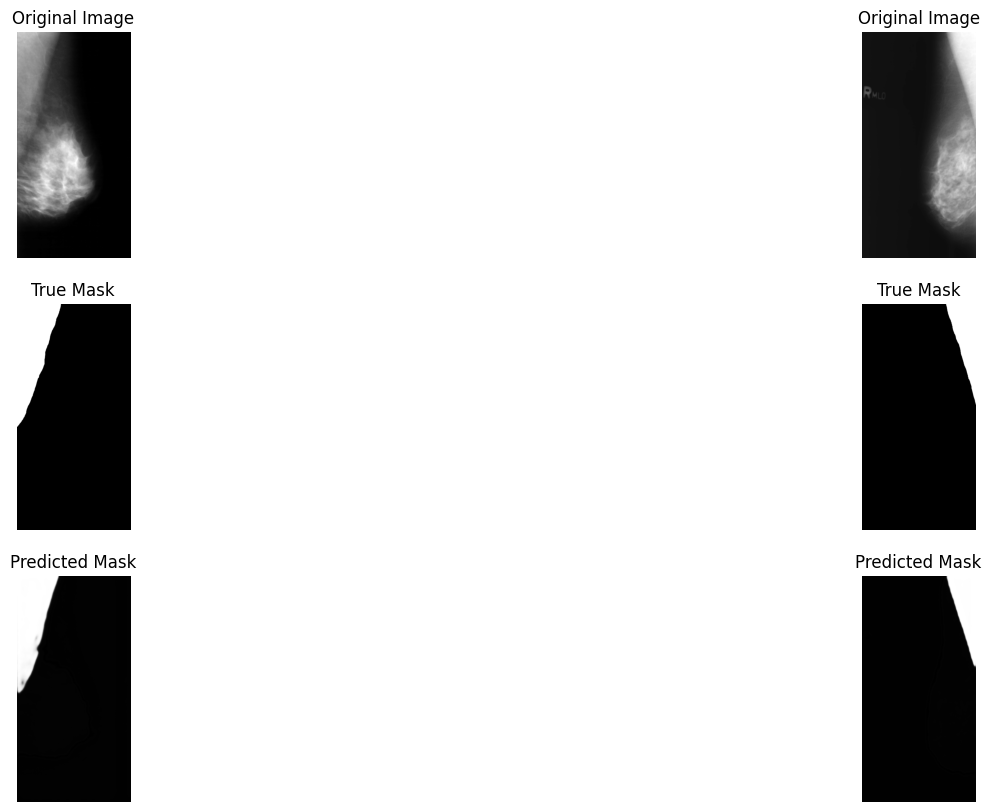

Epoch 42/150, Train Loss: 0.9938, Validation Loss: 0.9937, Dice Coef: 0.0063, Precision: 0.8143, Sensitivity: 0.6830, Specificity: 0.9799, IoU: 0.6179


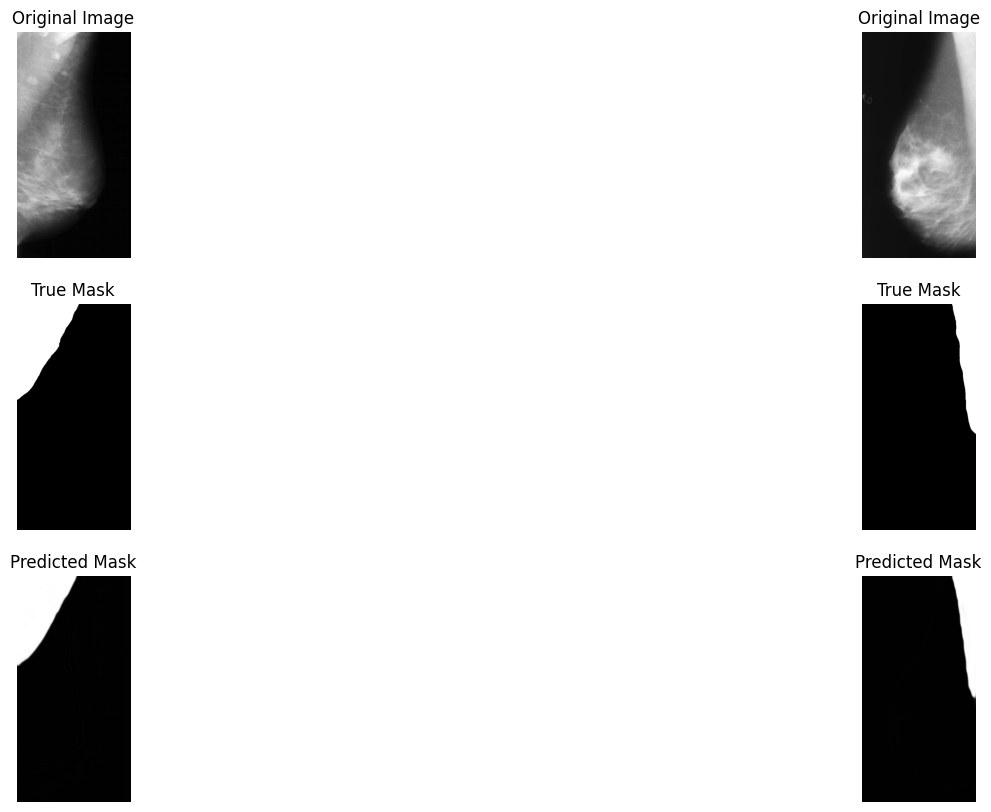

Epoch 43/150, Train Loss: 0.9938, Validation Loss: 0.9935, Dice Coef: 0.0065, Precision: 0.8188, Sensitivity: 0.7094, Specificity: 0.9805, IoU: 0.6435


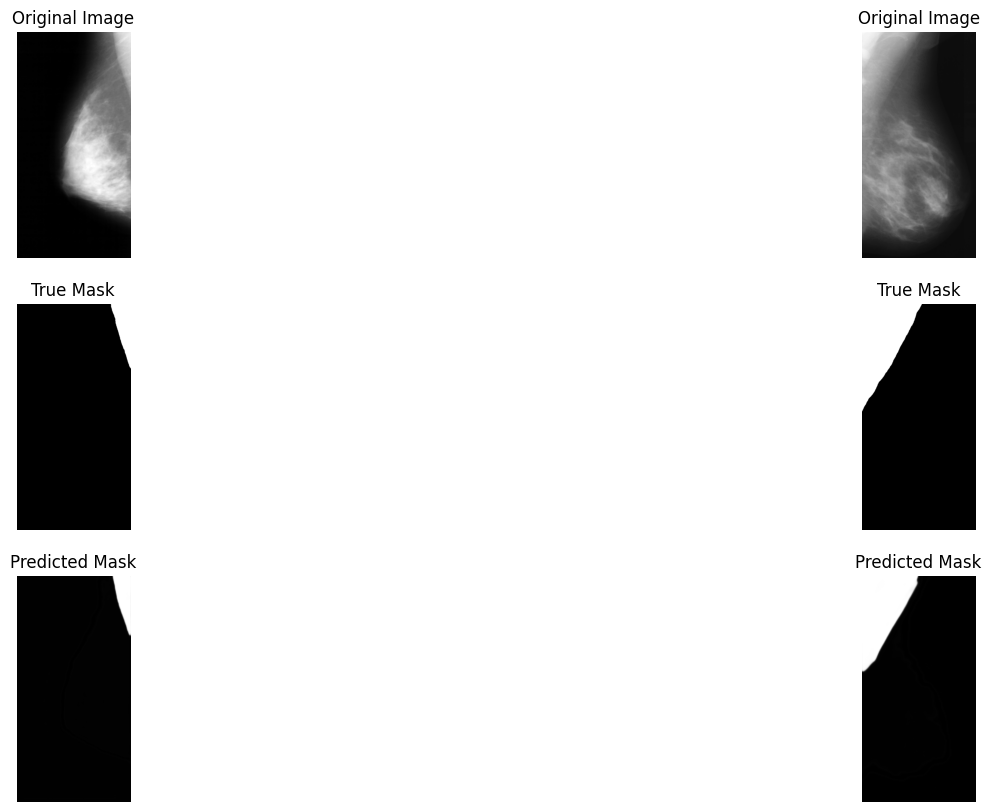

Epoch 44/150, Train Loss: 0.9937, Validation Loss: 0.9935, Dice Coef: 0.0065, Precision: 0.8324, Sensitivity: 0.6213, Specificity: 0.9860, IoU: 0.5808


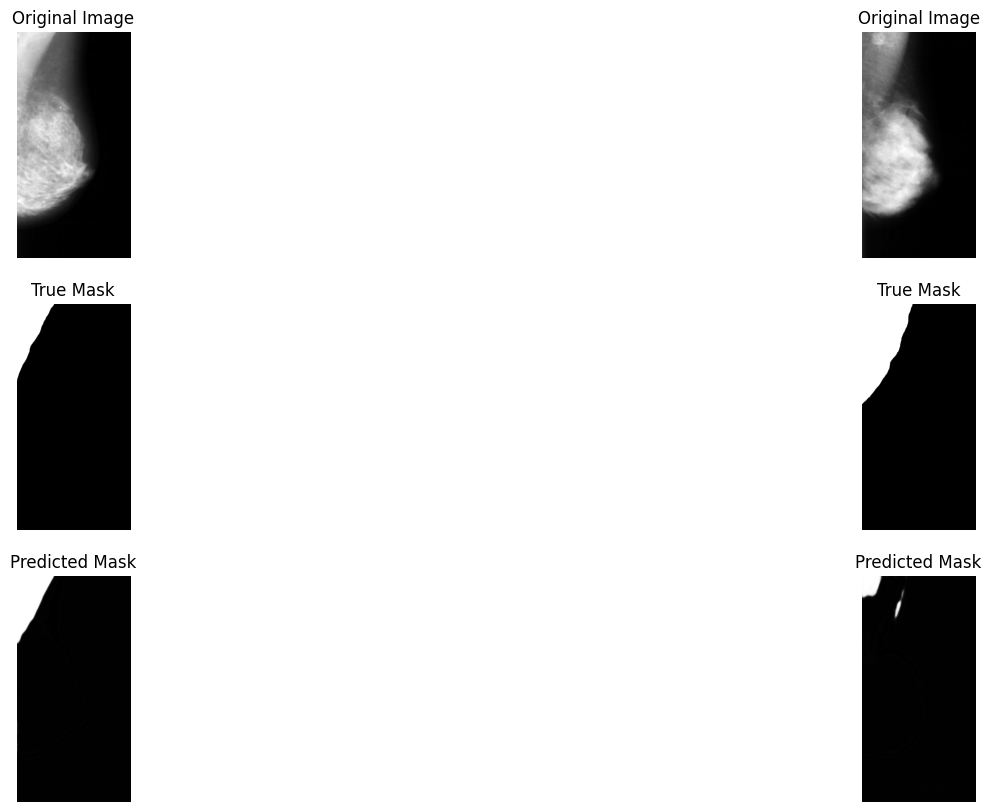

Epoch 45/150, Train Loss: 0.9939, Validation Loss: 0.9947, Dice Coef: 0.0053, Precision: 0.6264, Sensitivity: 0.7817, Specificity: 0.9289, IoU: 0.5567


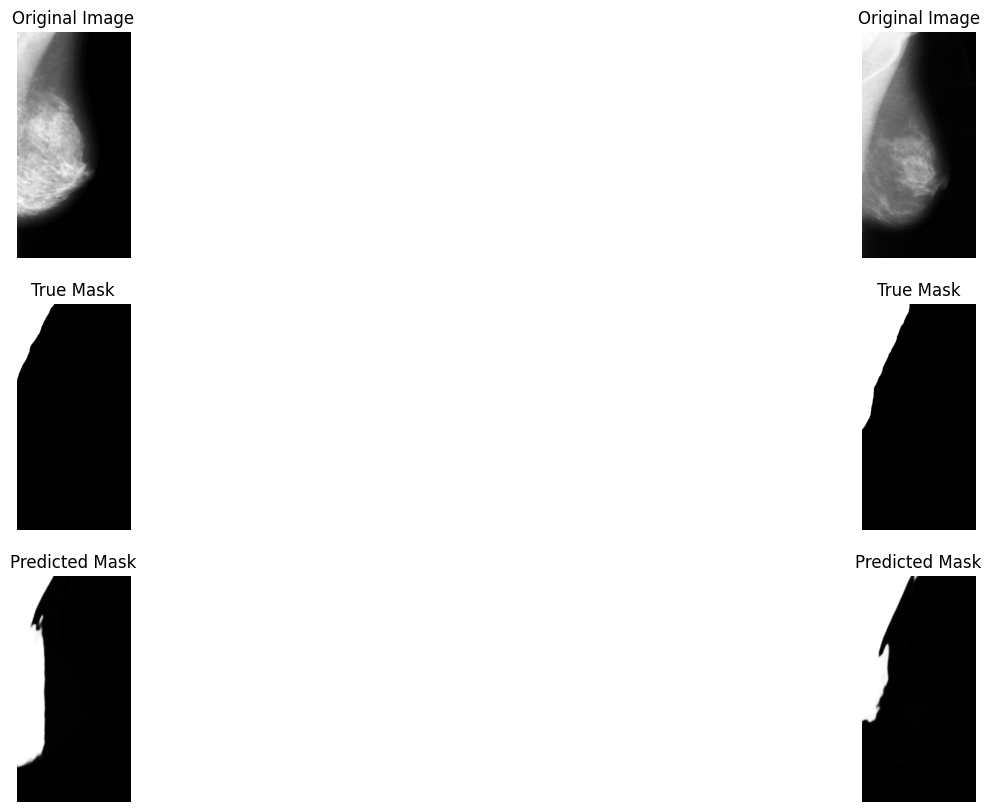

Epoch 46/150, Train Loss: 0.9938, Validation Loss: 0.9943, Dice Coef: 0.0057, Precision: 0.7022, Sensitivity: 0.7562, Specificity: 0.9515, IoU: 0.6102


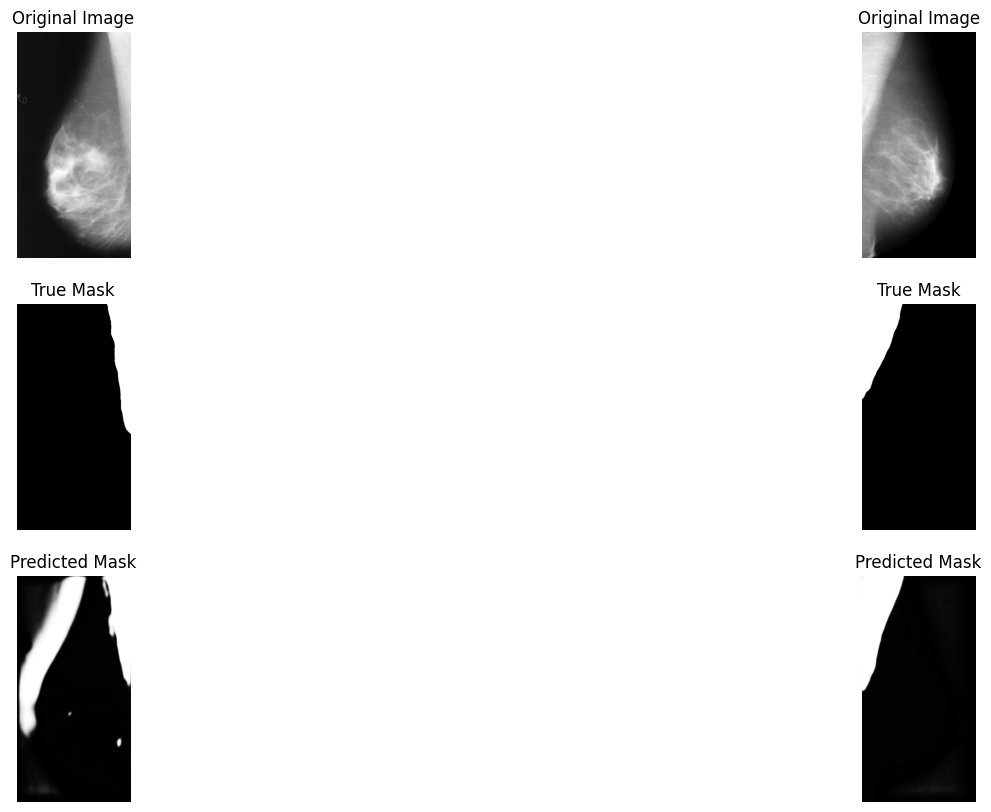

Epoch 47/150, Train Loss: 0.9938, Validation Loss: 0.9939, Dice Coef: 0.0061, Precision: 0.7862, Sensitivity: 0.7380, Specificity: 0.9736, IoU: 0.6439


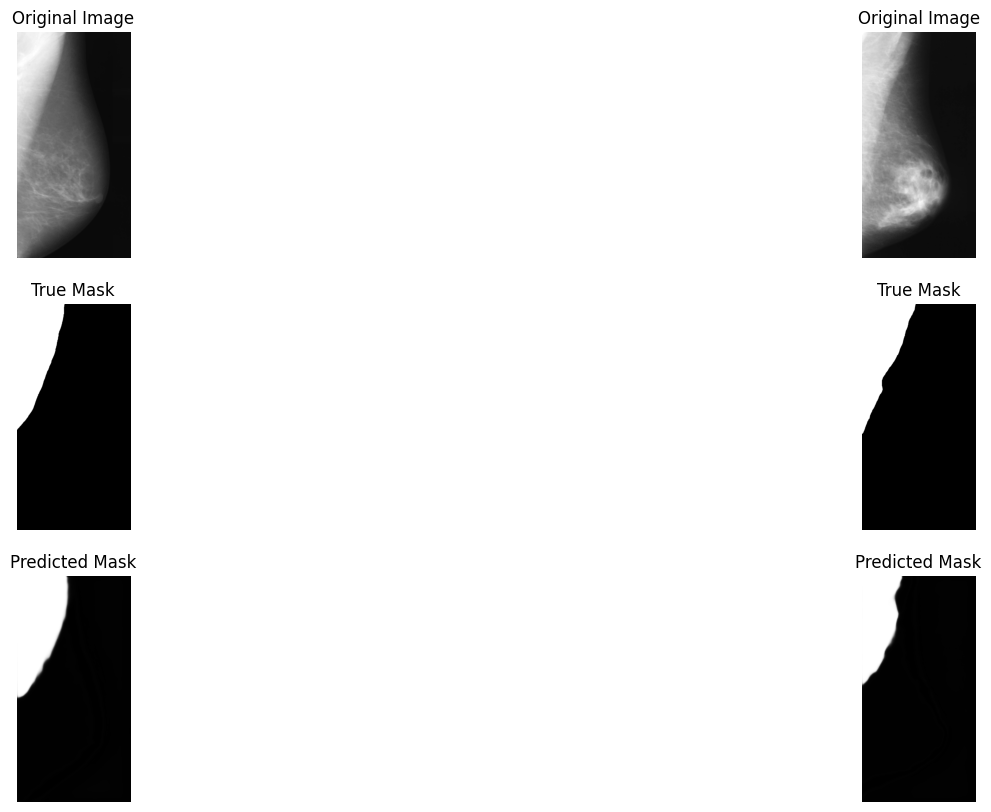

Epoch 48/150, Train Loss: 0.9937, Validation Loss: 0.9935, Dice Coef: 0.0065, Precision: 0.8299, Sensitivity: 0.5519, Specificity: 0.9851, IoU: 0.5080


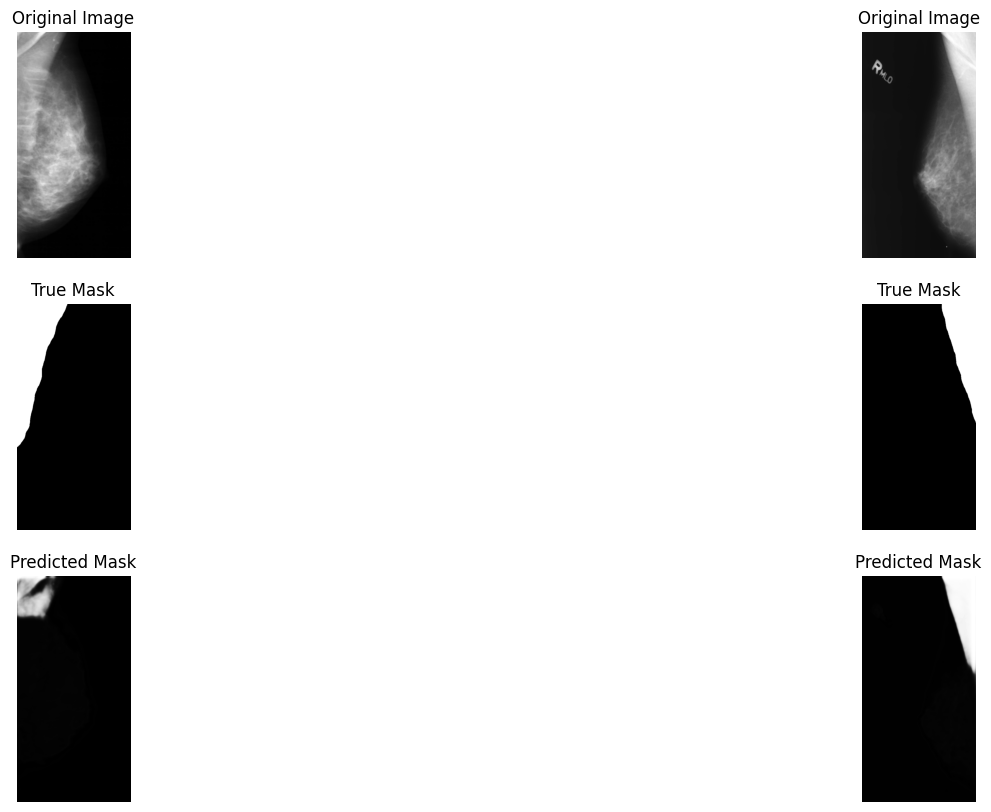

Epoch 49/150, Train Loss: 0.9936, Validation Loss: 0.9931, Dice Coef: 0.0069, Precision: 0.8273, Sensitivity: 0.6740, Specificity: 0.9816, IoU: 0.6132


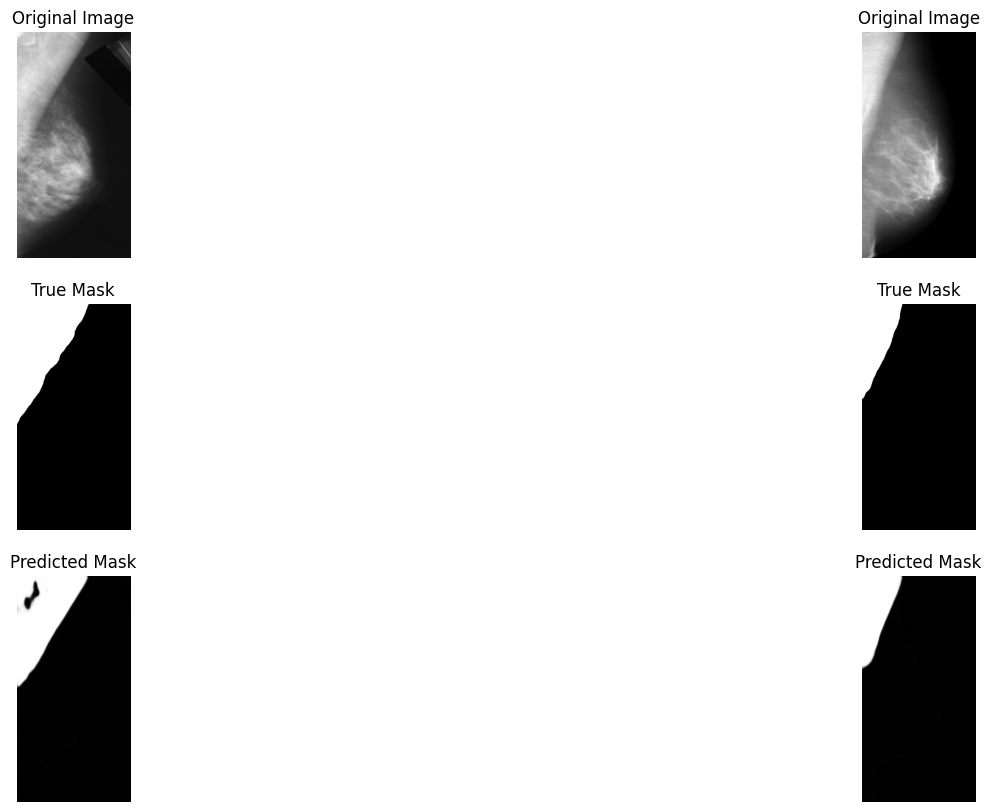

Epoch 50/150, Train Loss: 0.9935, Validation Loss: 0.9932, Dice Coef: 0.0068, Precision: 0.8253, Sensitivity: 0.6270, Specificity: 0.9846, IoU: 0.5833


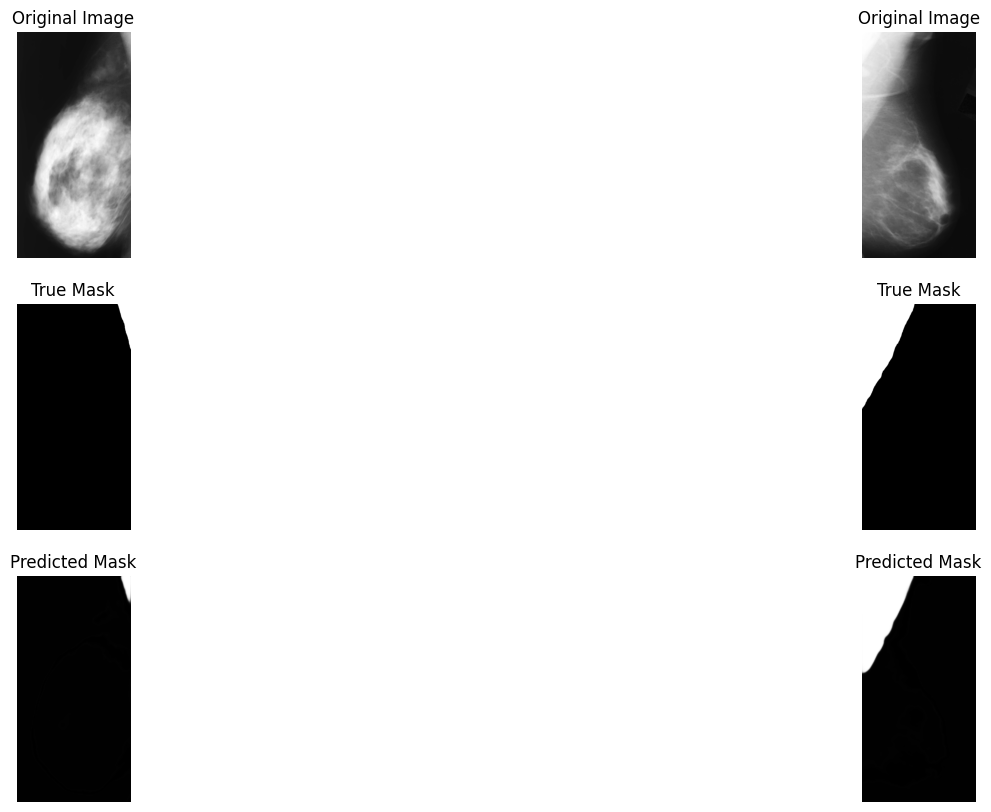

Epoch 51/150, Train Loss: 0.9935, Validation Loss: 0.9932, Dice Coef: 0.0068, Precision: 0.8191, Sensitivity: 0.5699, Specificity: 0.9841, IoU: 0.5270


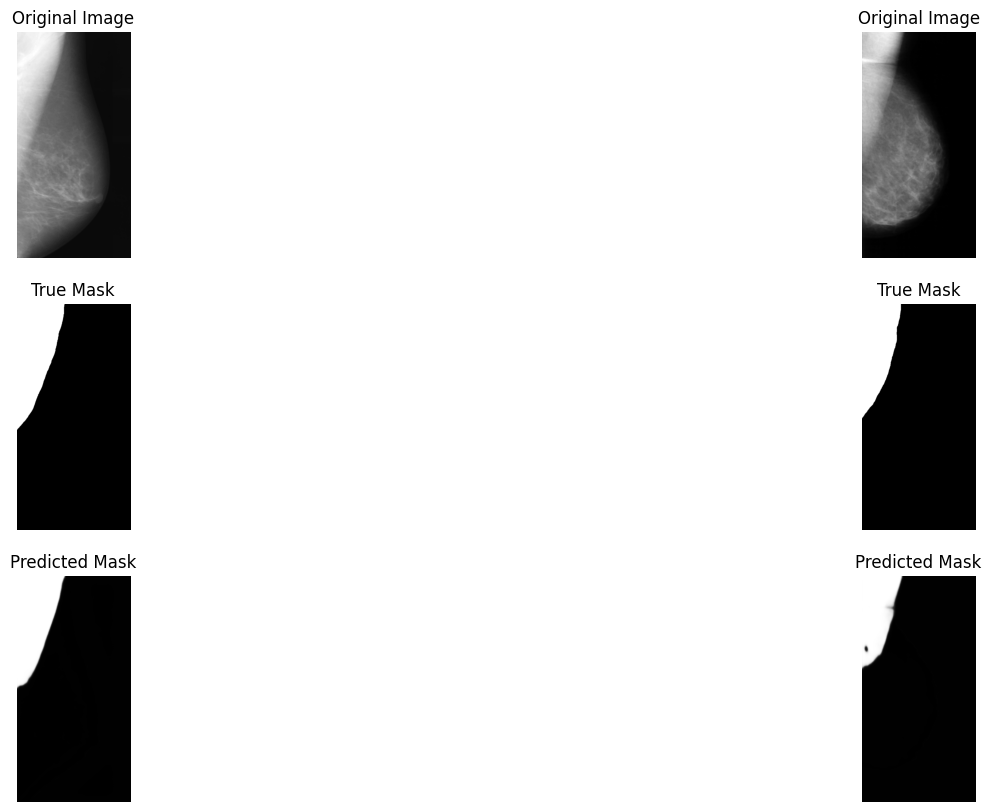

Epoch 52/150, Train Loss: 0.9934, Validation Loss: 0.9932, Dice Coef: 0.0068, Precision: 0.8182, Sensitivity: 0.6681, Specificity: 0.9805, IoU: 0.6051


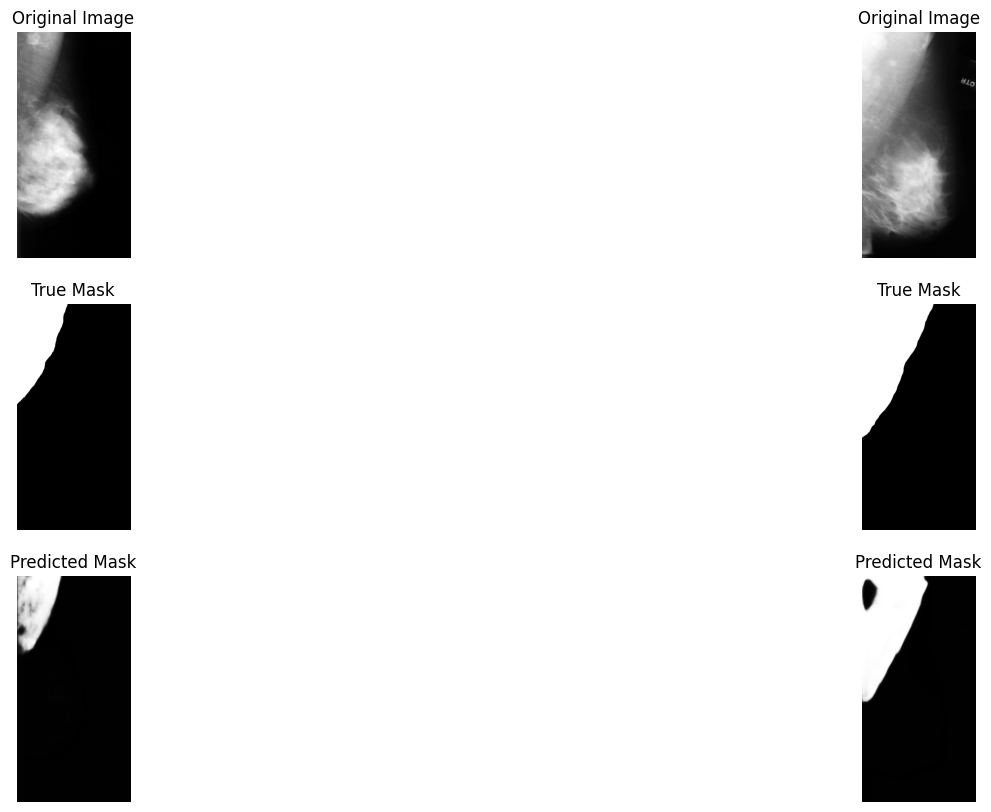

Epoch 53/150, Train Loss: 0.9934, Validation Loss: 0.9931, Dice Coef: 0.0069, Precision: 0.8277, Sensitivity: 0.6759, Specificity: 0.9822, IoU: 0.6168


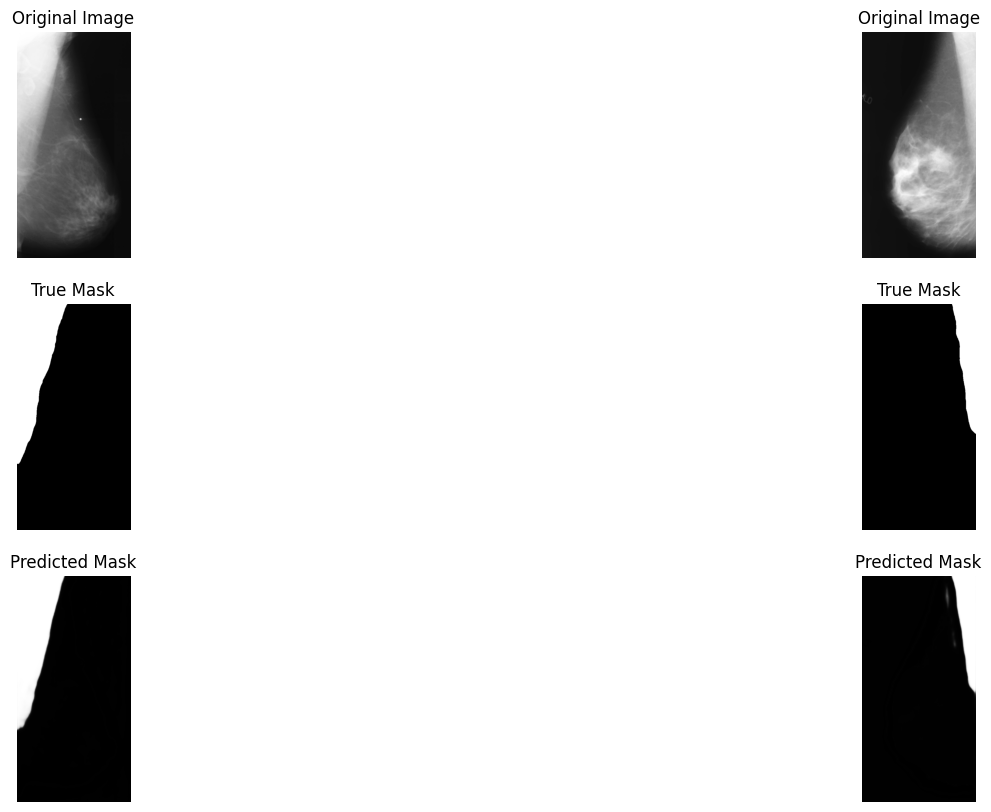

Epoch 54/150, Train Loss: 0.9933, Validation Loss: 0.9931, Dice Coef: 0.0069, Precision: 0.8217, Sensitivity: 0.6282, Specificity: 0.9832, IoU: 0.5786


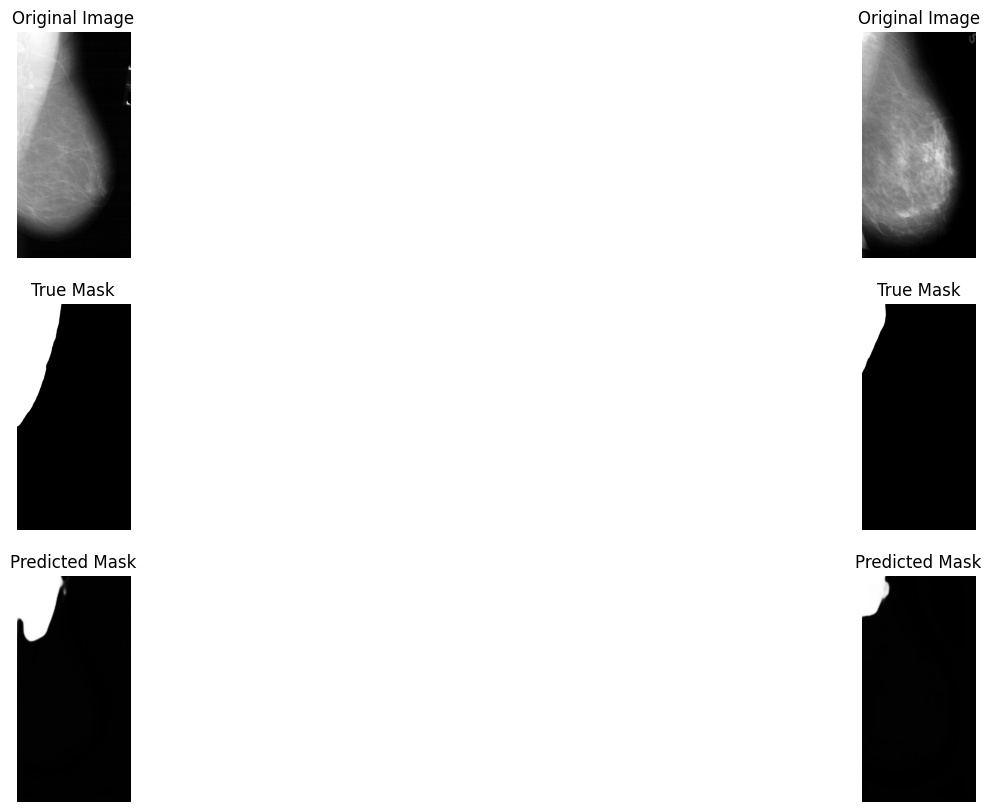

Epoch 00055: reducing learning rate of group 0 to 5.0000e-05.
Epoch 55/150, Train Loss: 0.9932, Validation Loss: 0.9931, Dice Coef: 0.0069, Precision: 0.8135, Sensitivity: 0.6754, Specificity: 0.9819, IoU: 0.6212


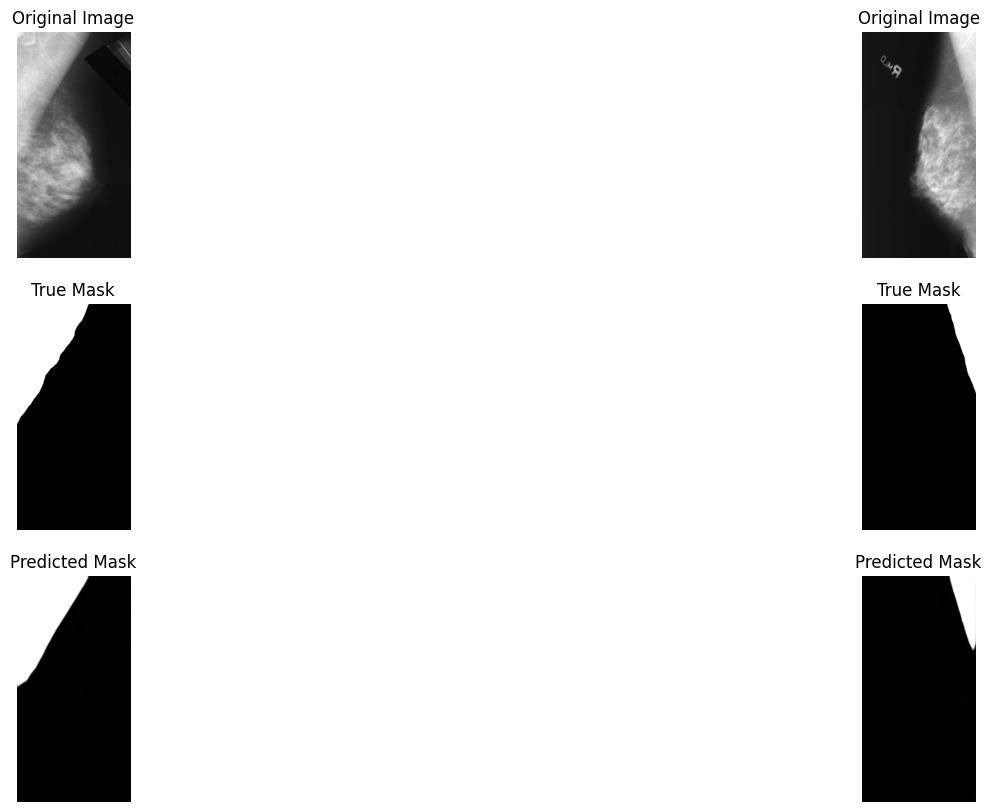

Epoch 56/150, Train Loss: 0.9932, Validation Loss: 0.9929, Dice Coef: 0.0071, Precision: 0.8373, Sensitivity: 0.6509, Specificity: 0.9864, IoU: 0.6104


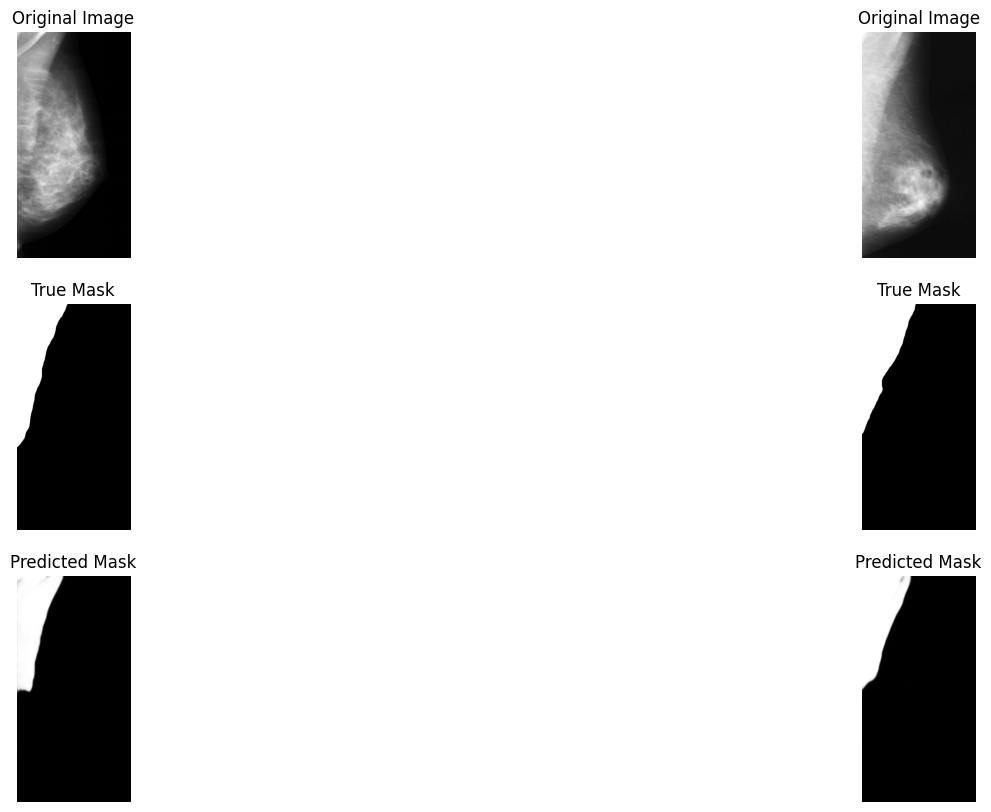

Epoch 57/150, Train Loss: 0.9933, Validation Loss: 0.9929, Dice Coef: 0.0071, Precision: 0.8296, Sensitivity: 0.5940, Specificity: 0.9867, IoU: 0.5587


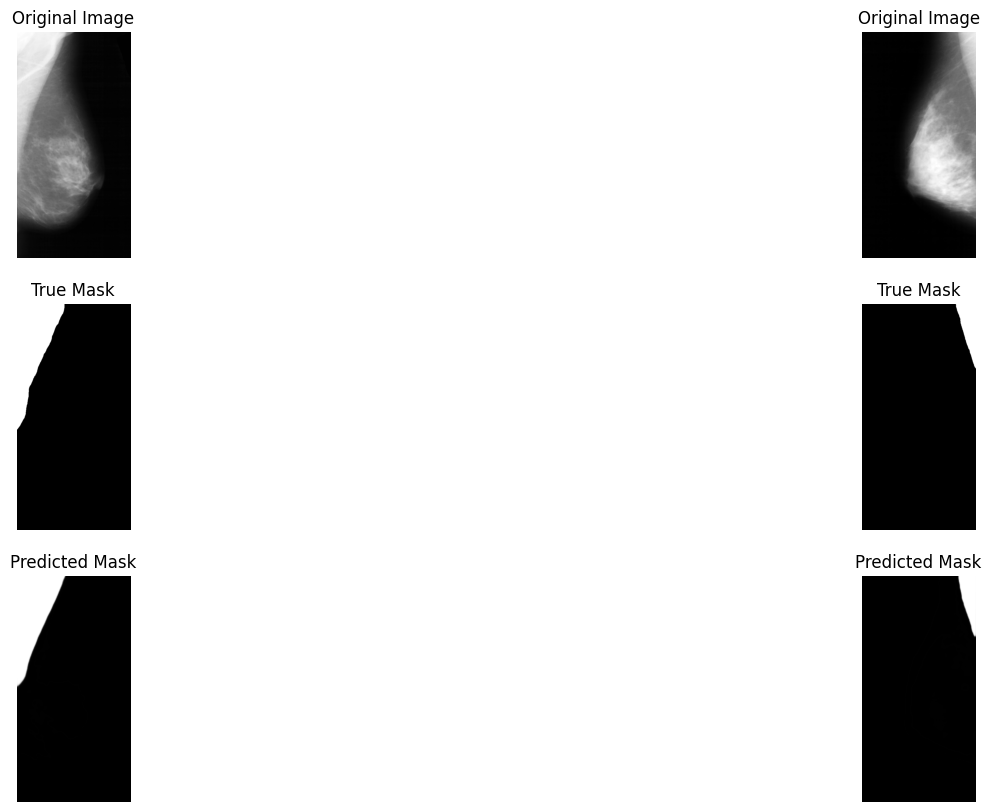

Epoch 58/150, Train Loss: 0.9931, Validation Loss: 0.9929, Dice Coef: 0.0071, Precision: 0.8256, Sensitivity: 0.6616, Specificity: 0.9843, IoU: 0.6115


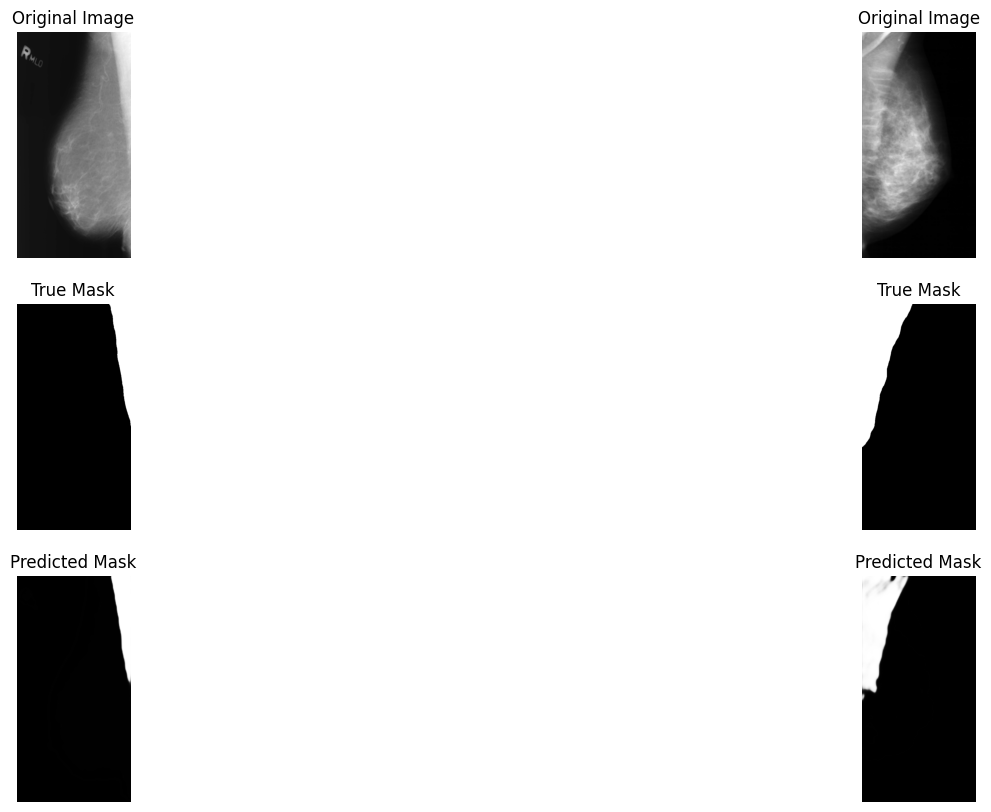

Epoch 59/150, Train Loss: 0.9931, Validation Loss: 0.9928, Dice Coef: 0.0072, Precision: 0.8357, Sensitivity: 0.6424, Specificity: 0.9863, IoU: 0.6023


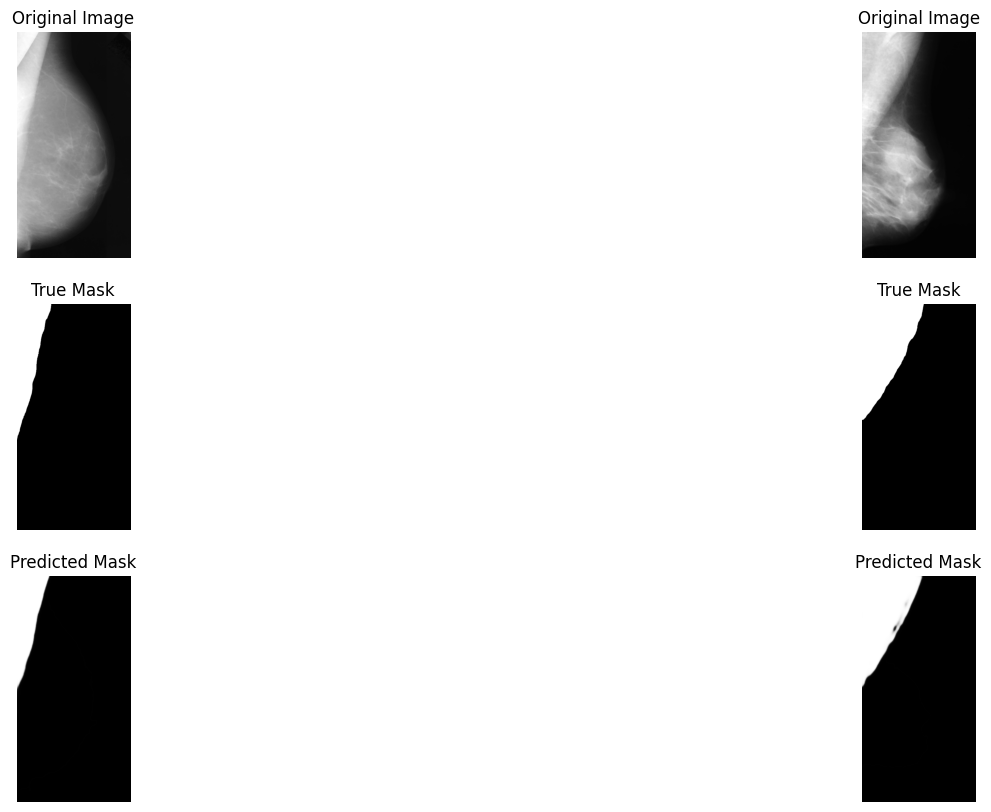

Epoch 60/150, Train Loss: 0.9931, Validation Loss: 0.9928, Dice Coef: 0.0072, Precision: 0.8330, Sensitivity: 0.6753, Specificity: 0.9851, IoU: 0.6288


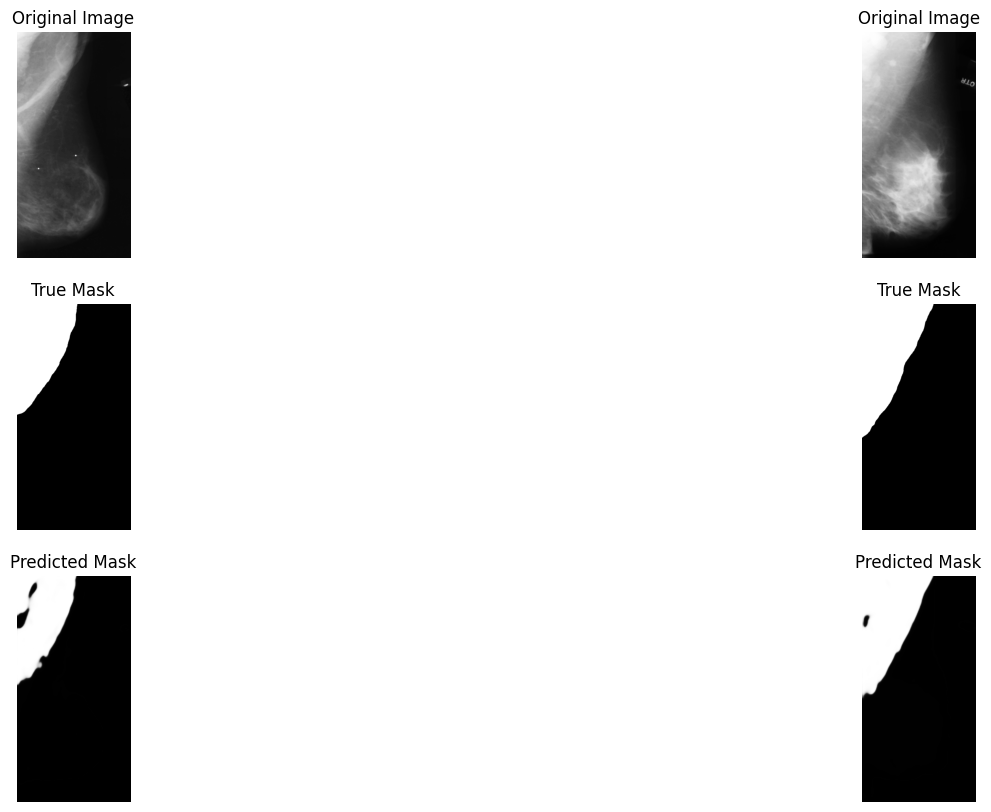

Epoch 61/150, Train Loss: 0.9931, Validation Loss: 0.9928, Dice Coef: 0.0072, Precision: 0.8341, Sensitivity: 0.6816, Specificity: 0.9845, IoU: 0.6319


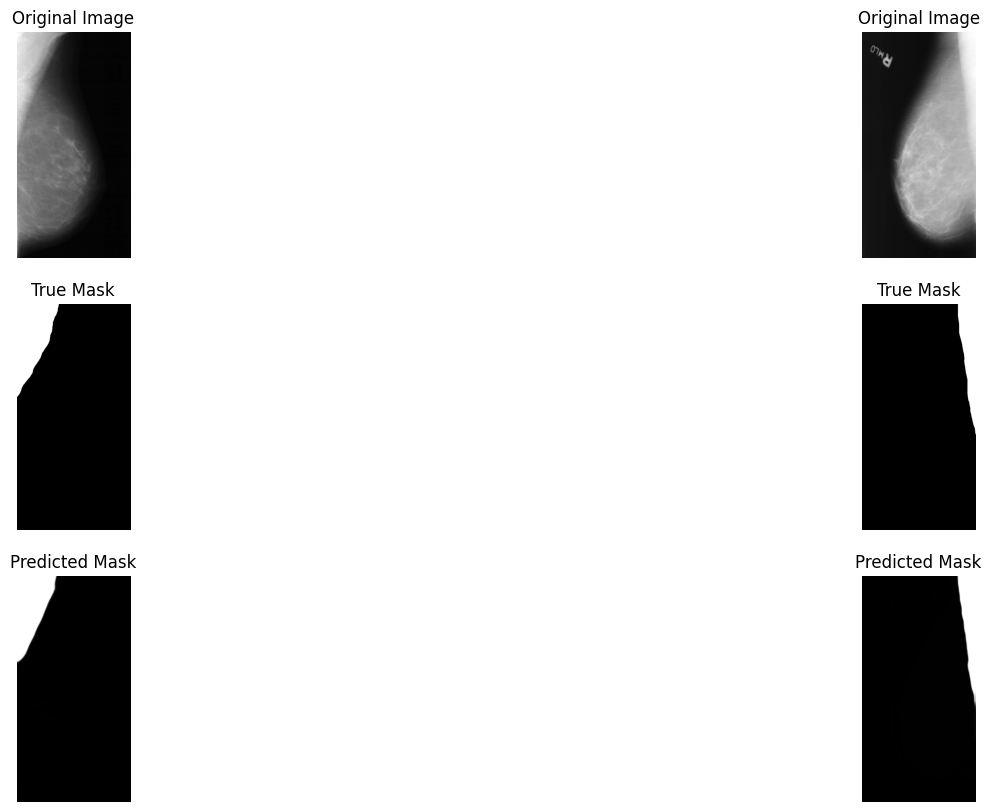

Epoch 62/150, Train Loss: 0.9930, Validation Loss: 0.9928, Dice Coef: 0.0072, Precision: 0.8341, Sensitivity: 0.6789, Specificity: 0.9848, IoU: 0.6310


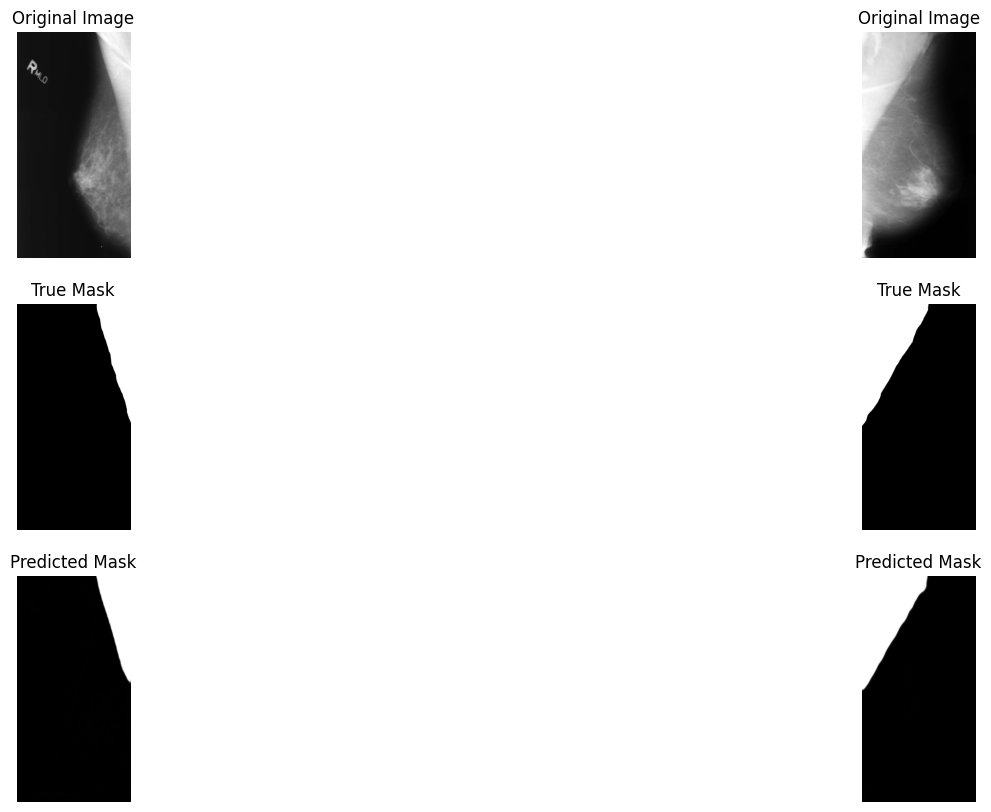

Epoch 63/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8348, Sensitivity: 0.6583, Specificity: 0.9856, IoU: 0.6143


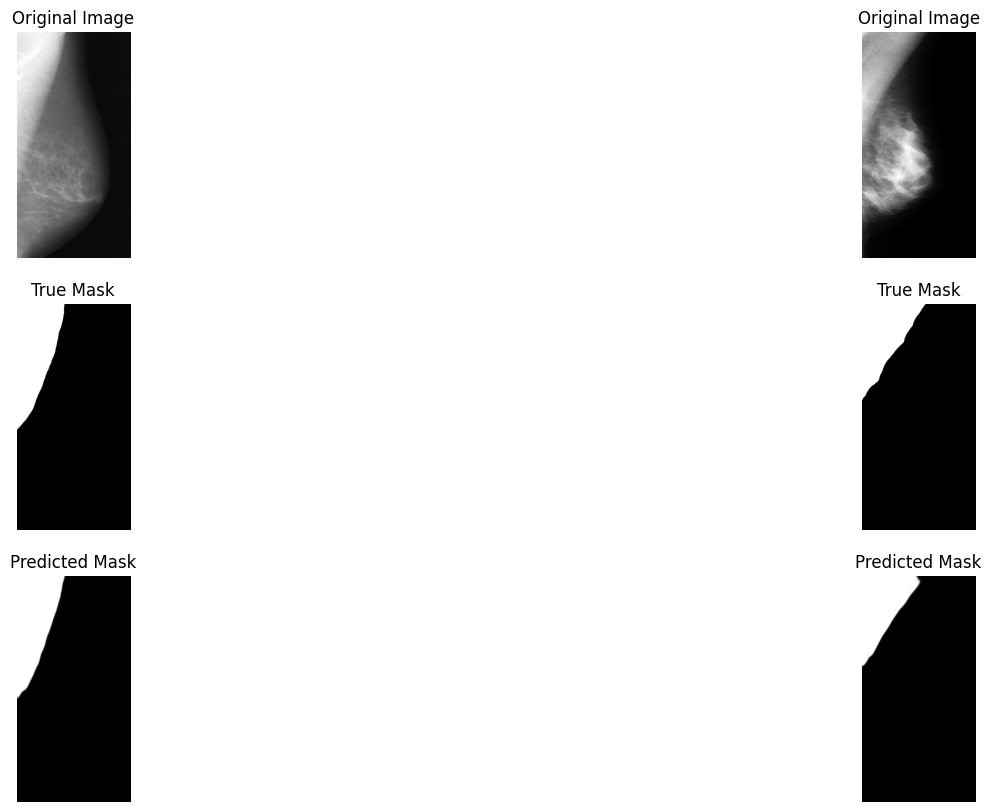

Epoch 64/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8354, Sensitivity: 0.6587, Specificity: 0.9852, IoU: 0.6125


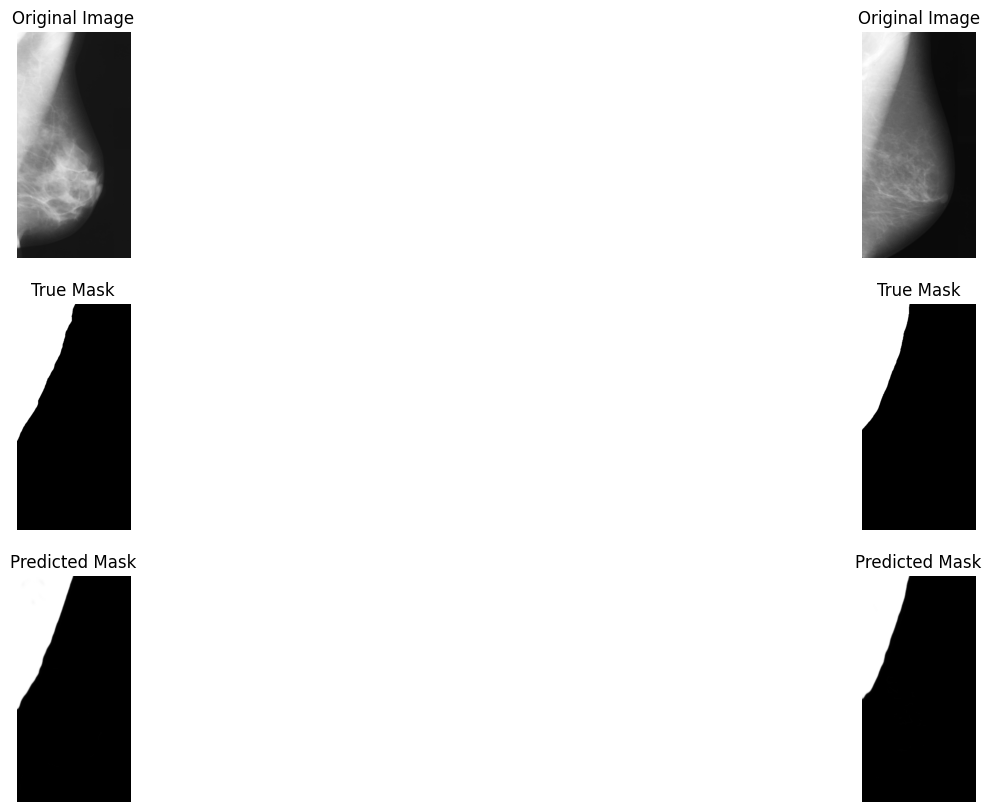

Epoch 65/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8346, Sensitivity: 0.6670, Specificity: 0.9846, IoU: 0.6182


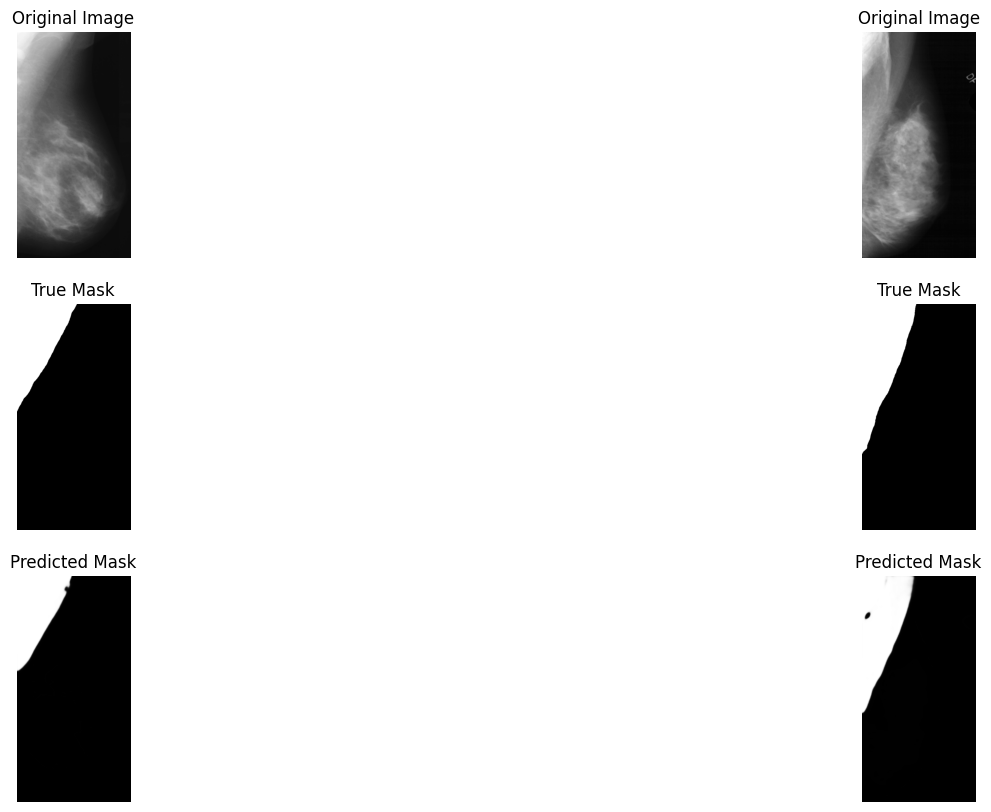

Epoch 66/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8352, Sensitivity: 0.6465, Specificity: 0.9853, IoU: 0.6010


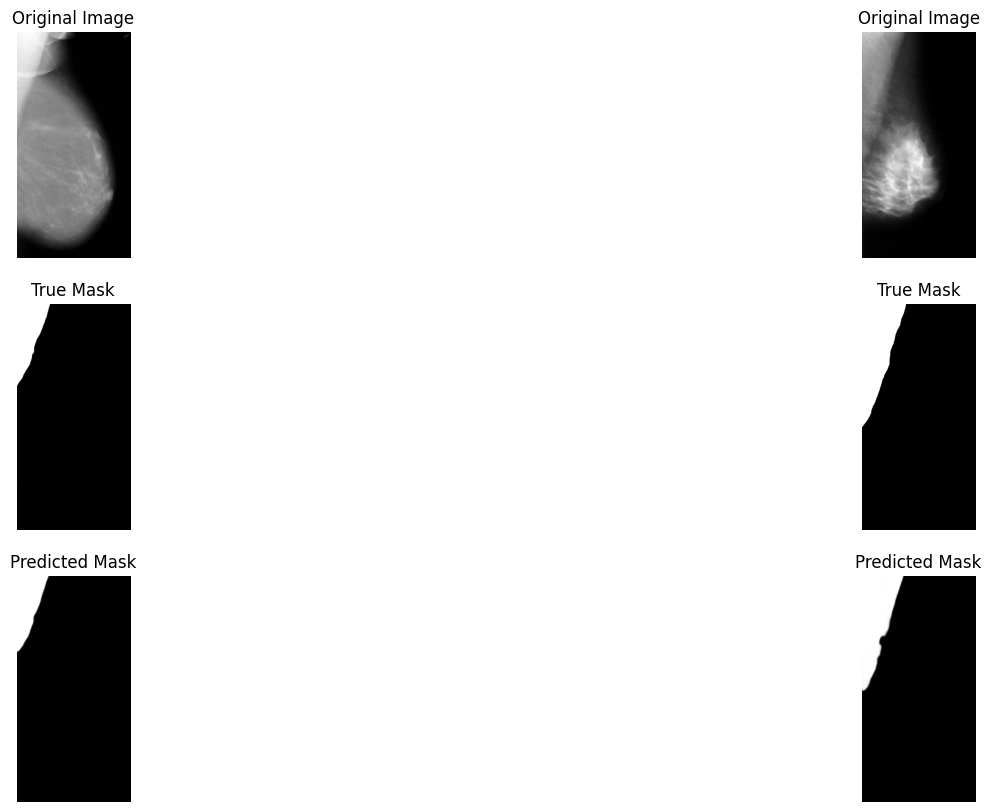

Epoch 67/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8294, Sensitivity: 0.7026, Specificity: 0.9830, IoU: 0.6458


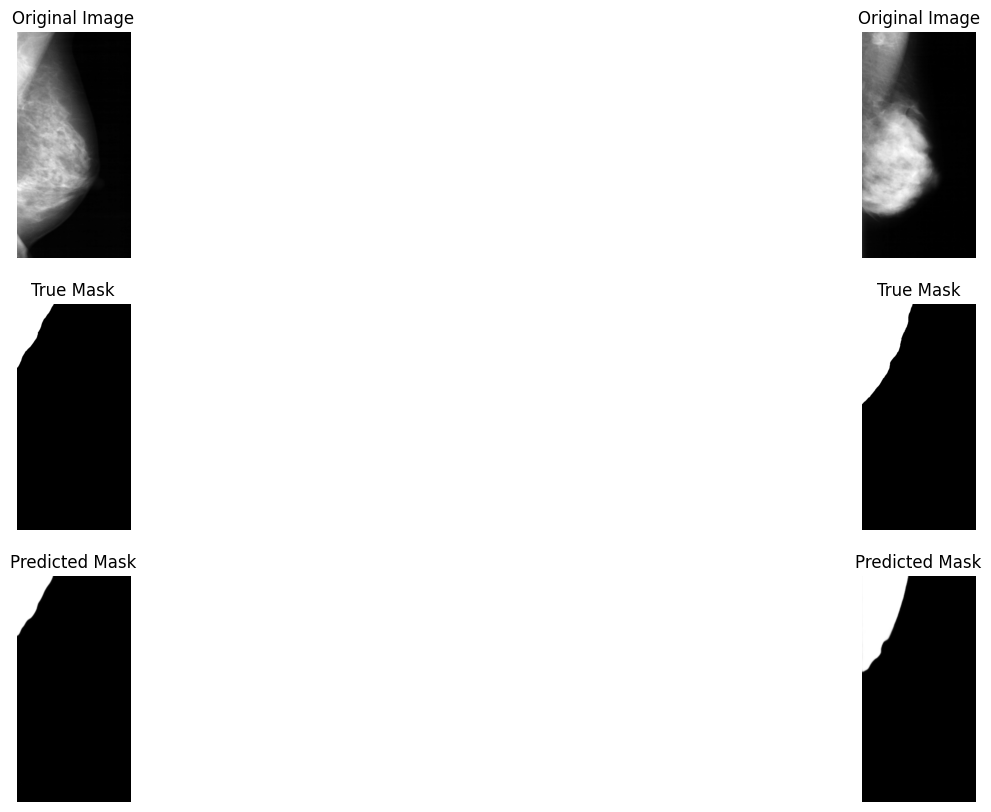

Epoch 00068: reducing learning rate of group 0 to 2.5000e-05.
Epoch 68/150, Train Loss: 0.9930, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8319, Sensitivity: 0.6879, Specificity: 0.9840, IoU: 0.6362


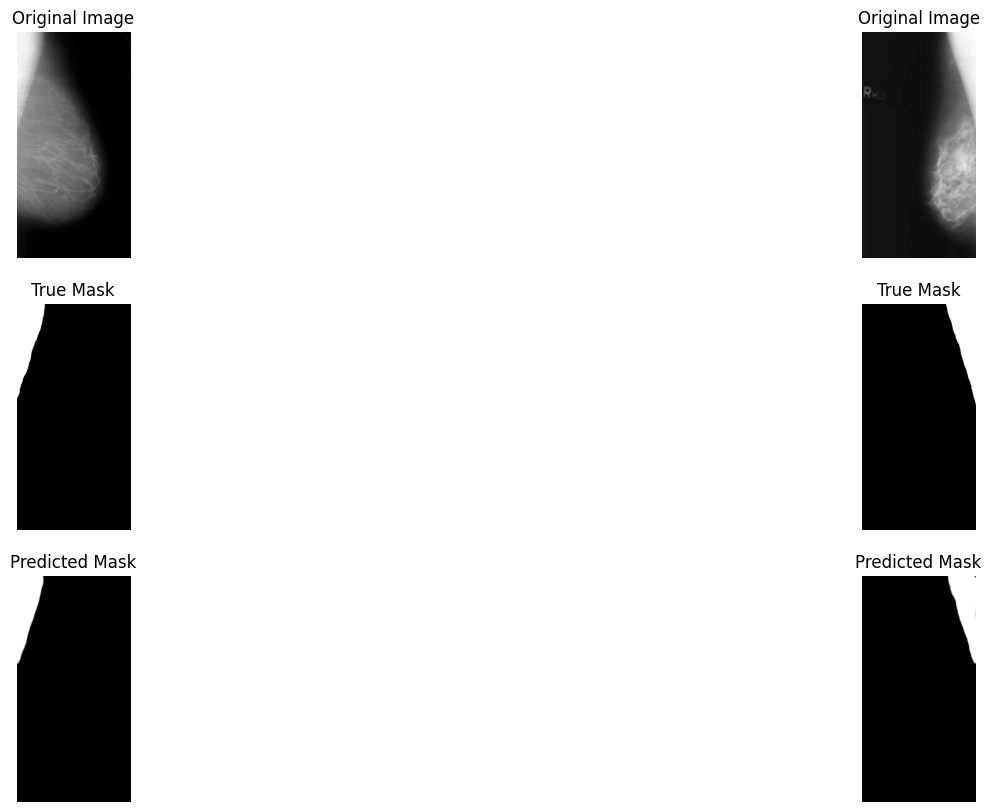

Epoch 69/150, Train Loss: 0.9929, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8319, Sensitivity: 0.6991, Specificity: 0.9832, IoU: 0.6434


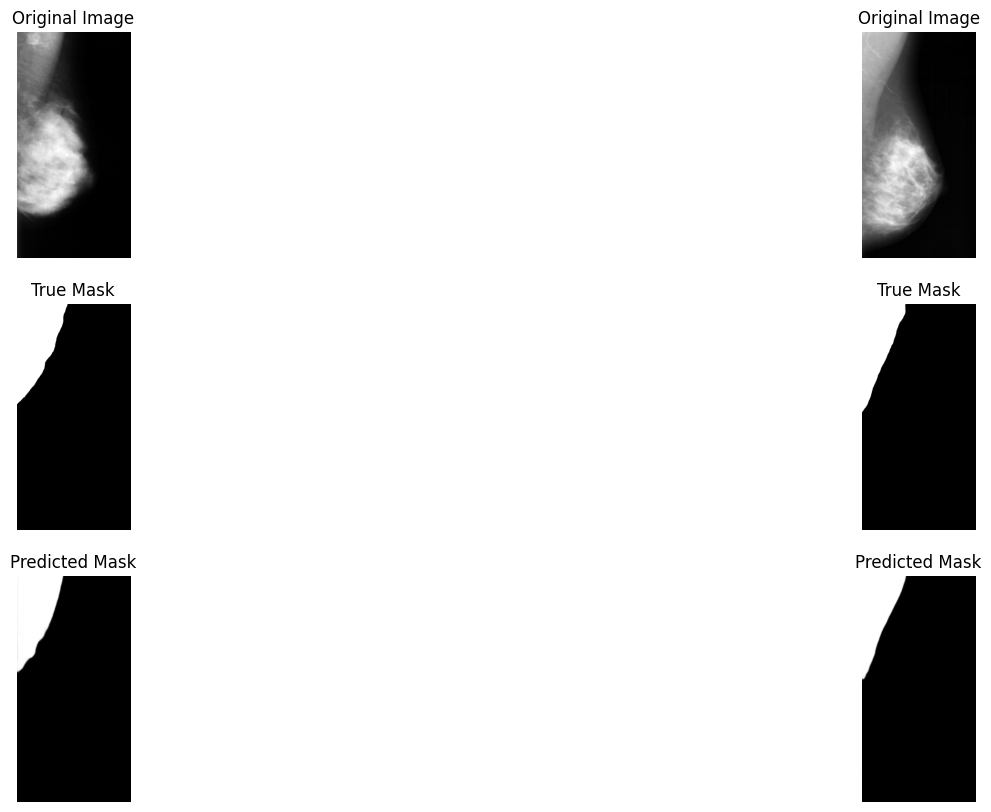

Epoch 70/150, Train Loss: 0.9929, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8327, Sensitivity: 0.6922, Specificity: 0.9833, IoU: 0.6375


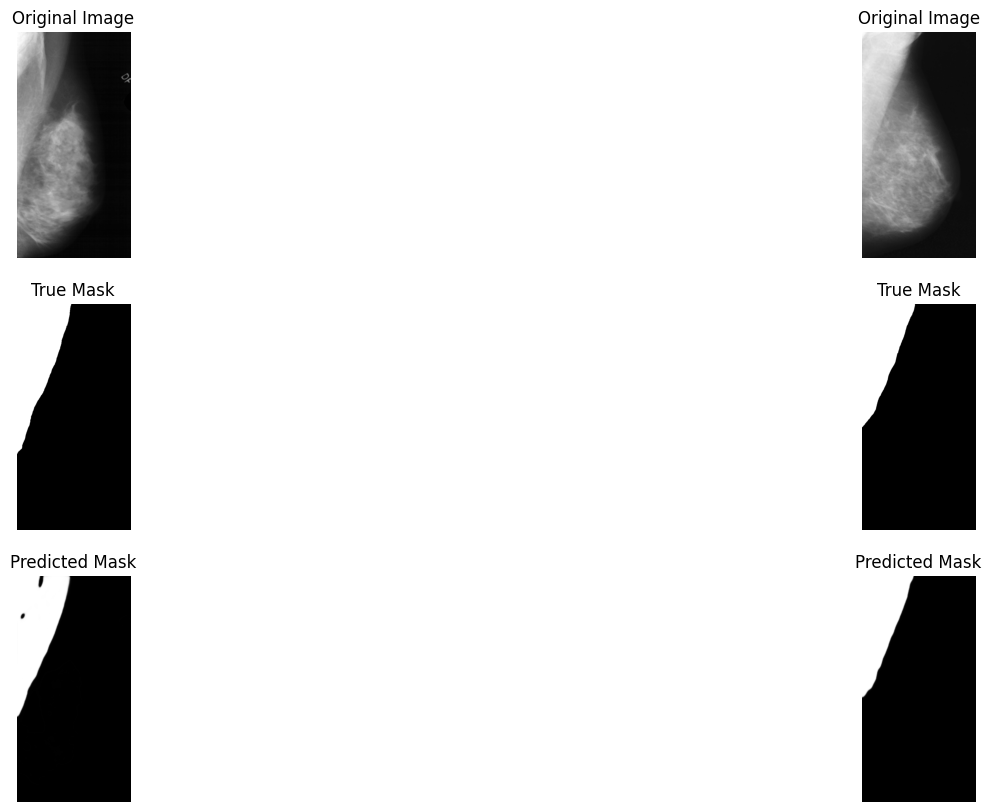

Epoch 71/150, Train Loss: 0.9929, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8324, Sensitivity: 0.6938, Specificity: 0.9830, IoU: 0.6374


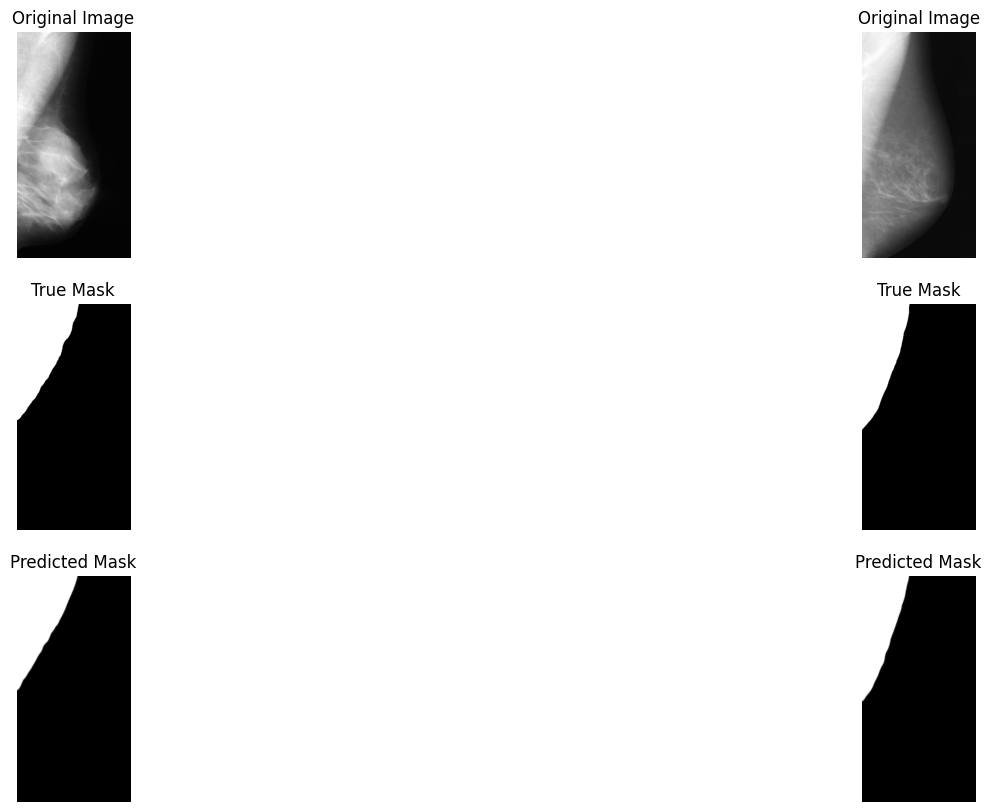

Epoch 72/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8330, Sensitivity: 0.6908, Specificity: 0.9834, IoU: 0.6362


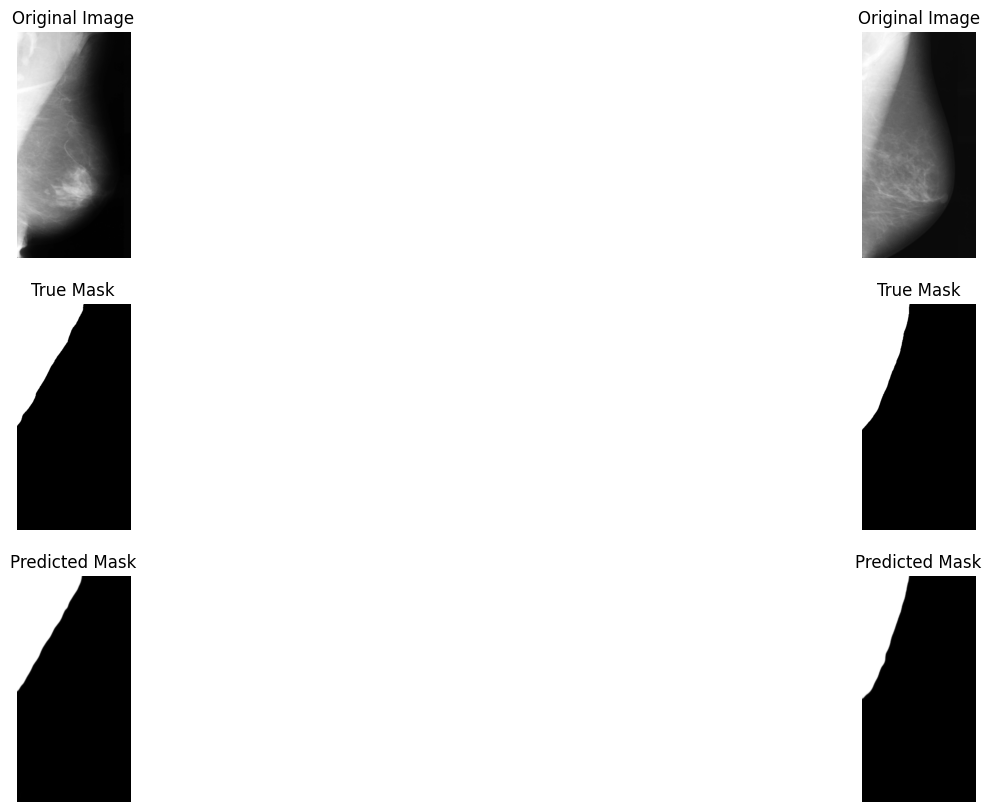

Epoch 73/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8228, Sensitivity: 0.7158, Specificity: 0.9818, IoU: 0.6520


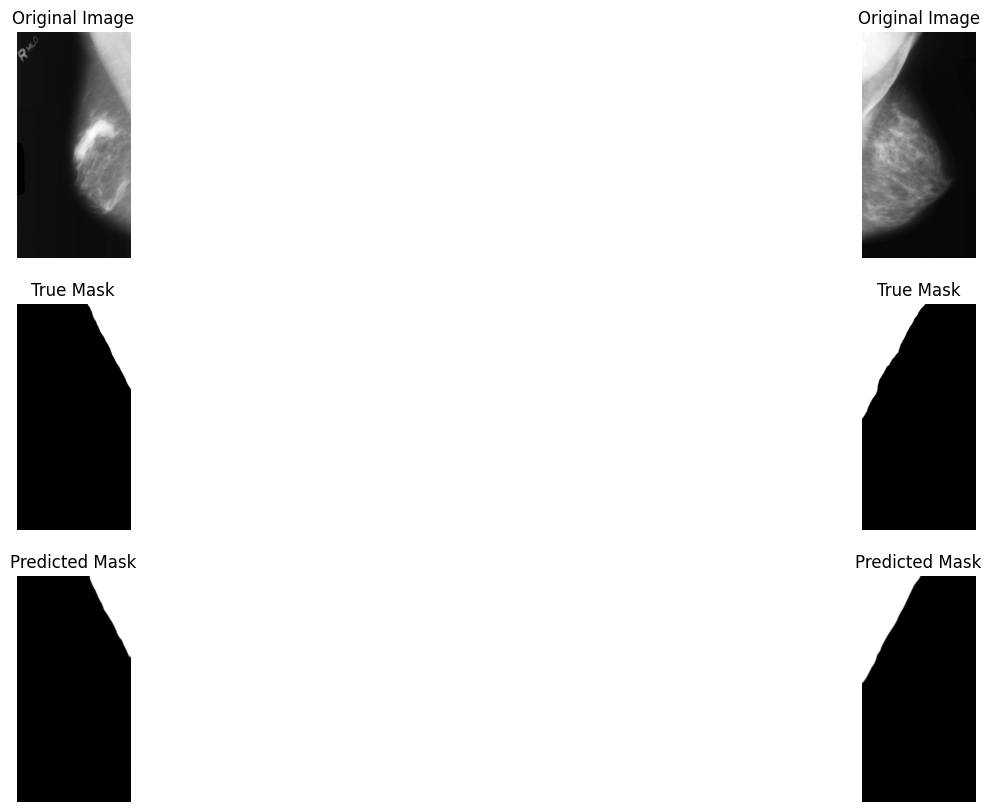

Epoch 74/150, Train Loss: 0.9929, Validation Loss: 0.9927, Dice Coef: 0.0073, Precision: 0.8313, Sensitivity: 0.6823, Specificity: 0.9831, IoU: 0.6266


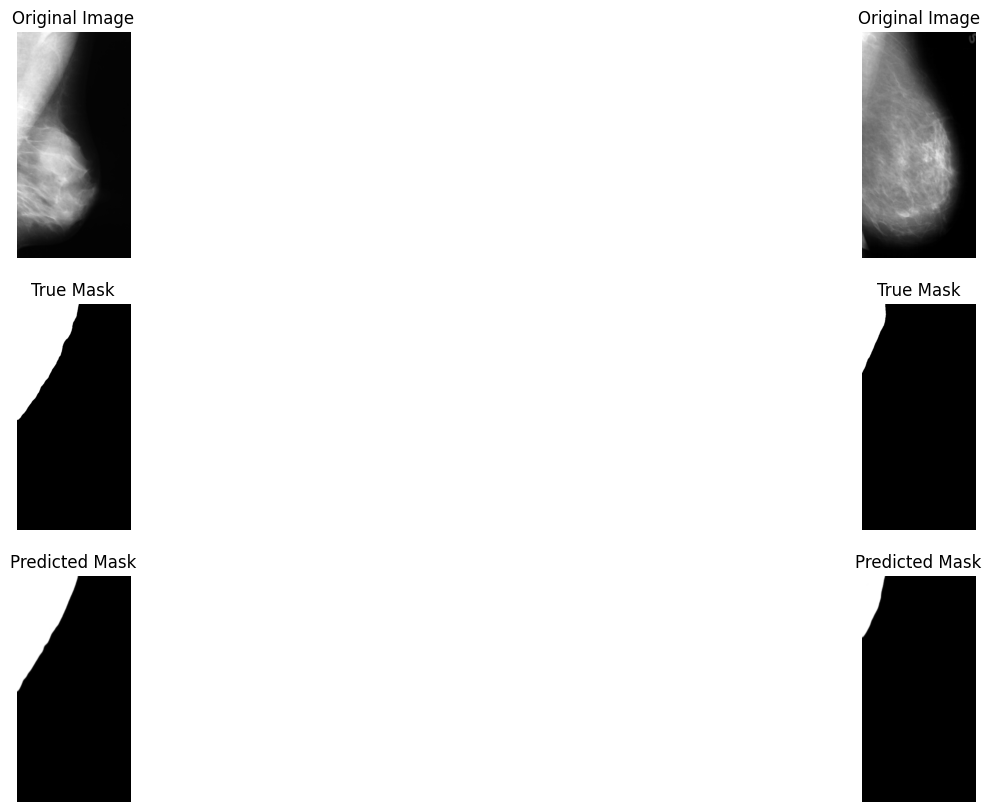

Epoch 00075: reducing learning rate of group 0 to 1.2500e-05.
Epoch 75/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8330, Sensitivity: 0.6902, Specificity: 0.9833, IoU: 0.6352


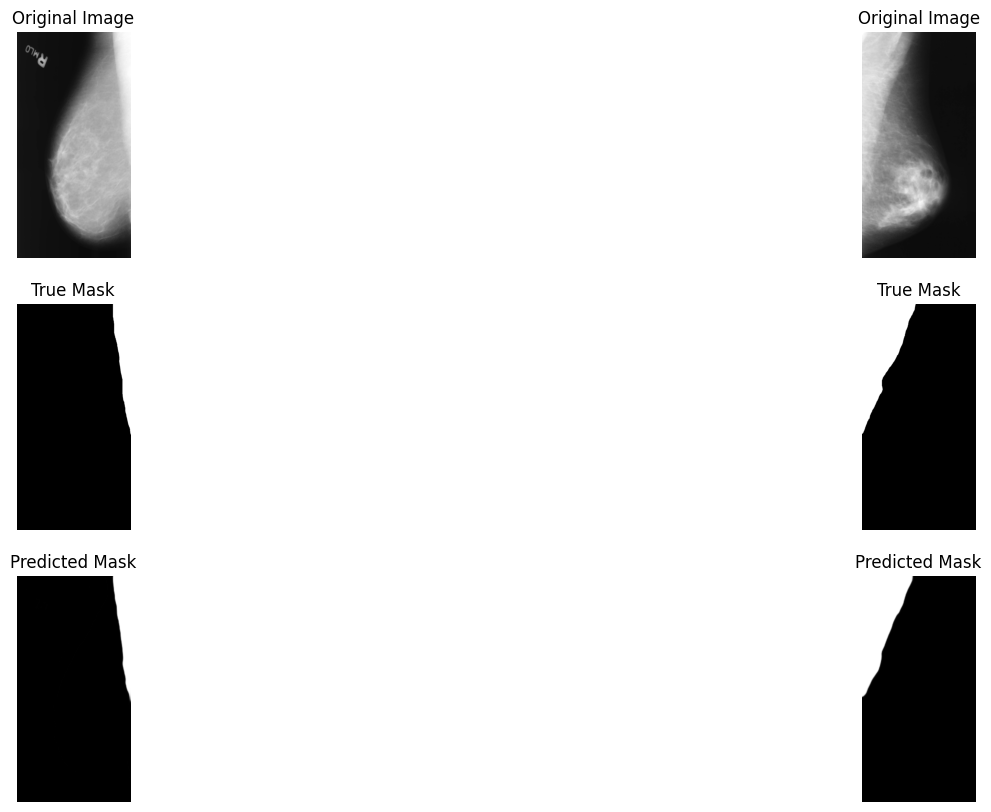

Epoch 76/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8310, Sensitivity: 0.6924, Specificity: 0.9838, IoU: 0.6398


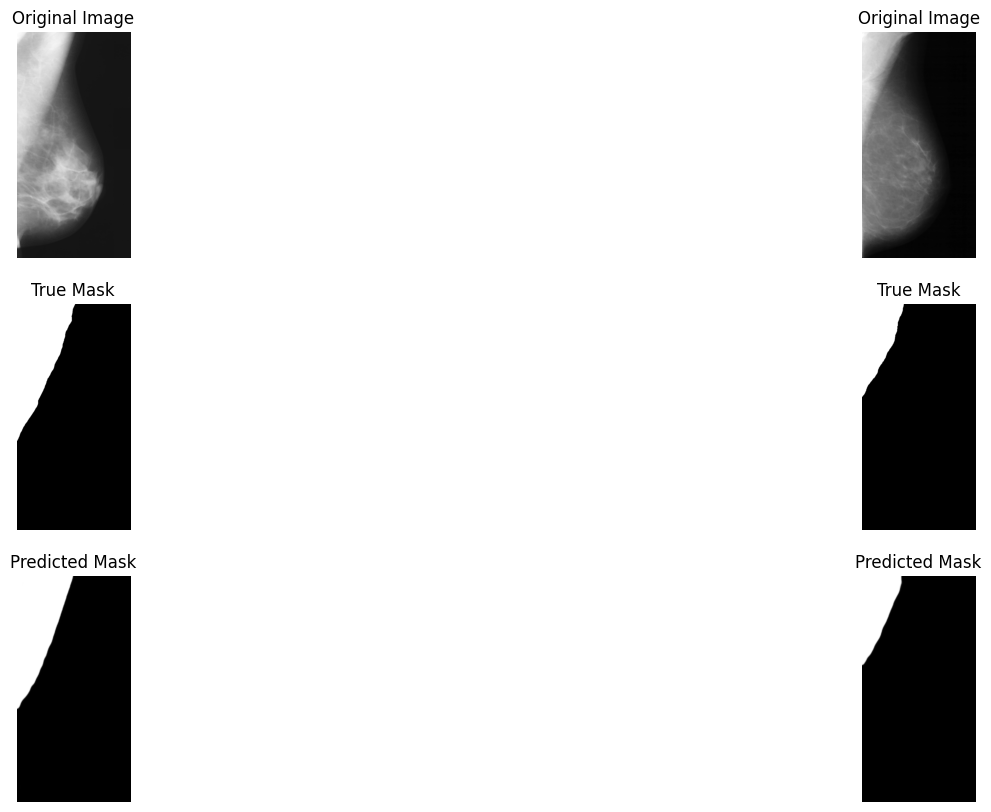

Epoch 77/150, Train Loss: 0.9930, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8305, Sensitivity: 0.6953, Specificity: 0.9835, IoU: 0.6410


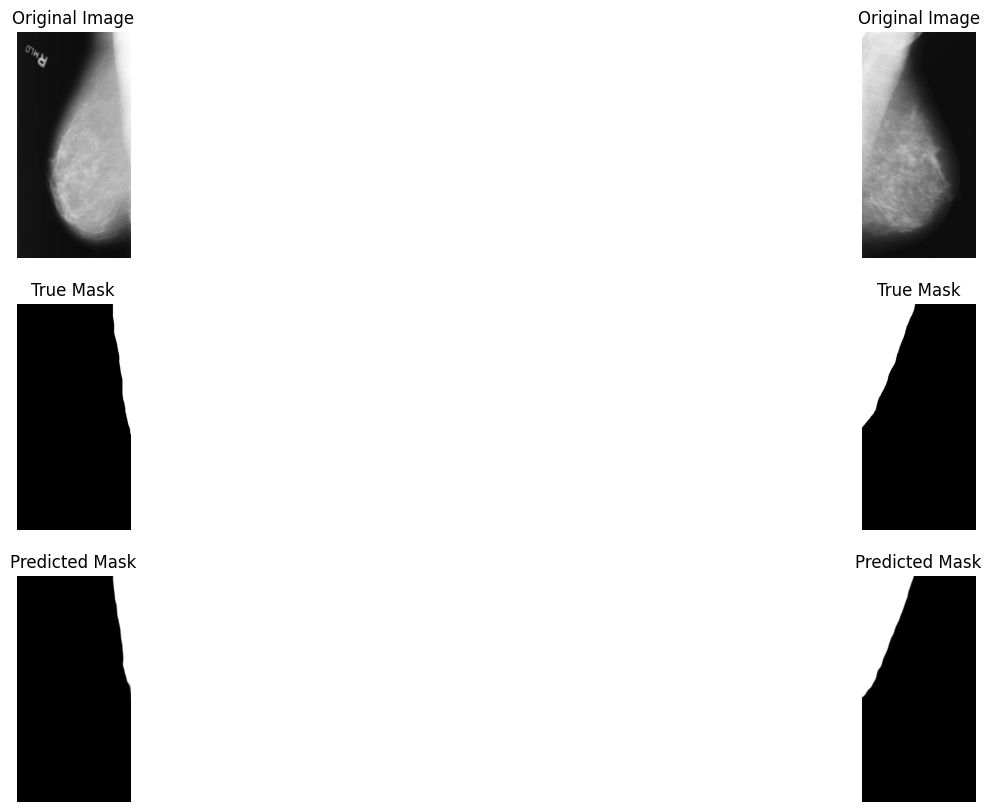

Epoch 78/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8315, Sensitivity: 0.6967, Specificity: 0.9830, IoU: 0.6404


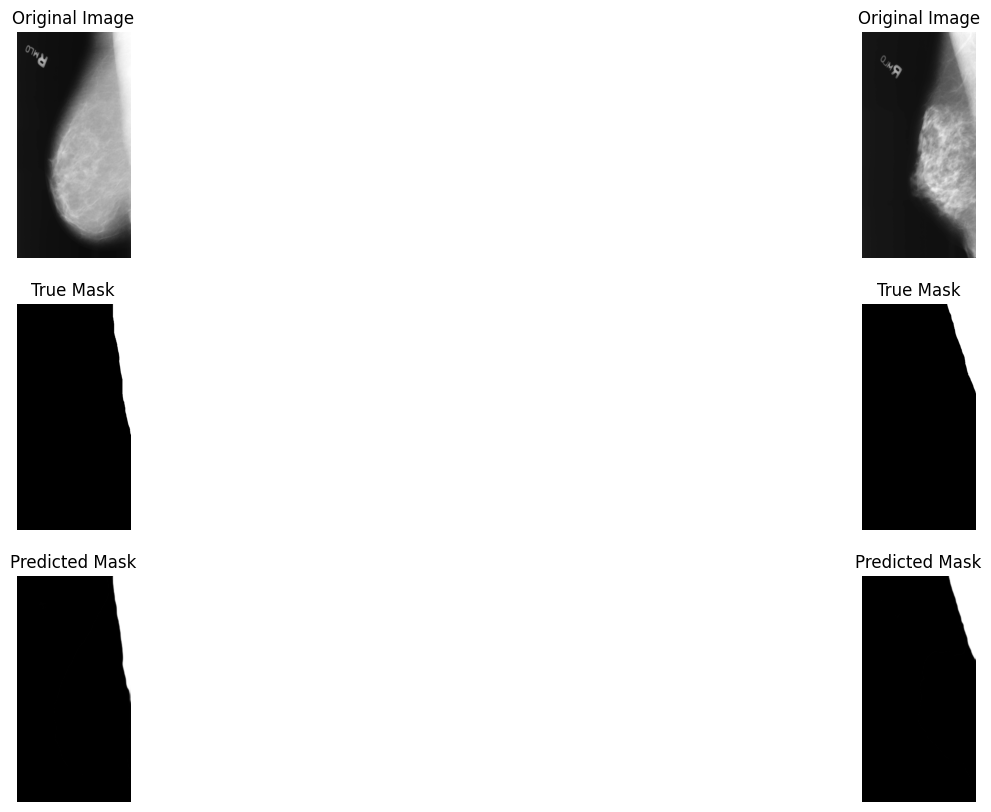

Epoch 79/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8292, Sensitivity: 0.7084, Specificity: 0.9821, IoU: 0.6473


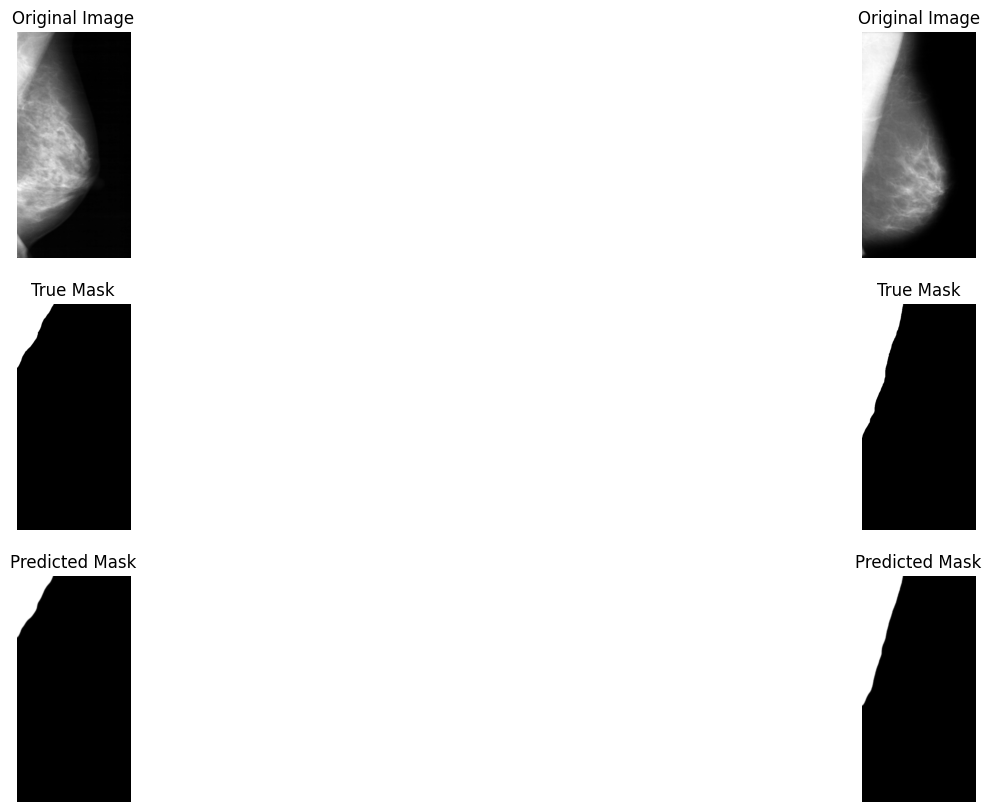

Epoch 80/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8273, Sensitivity: 0.7119, Specificity: 0.9820, IoU: 0.6501


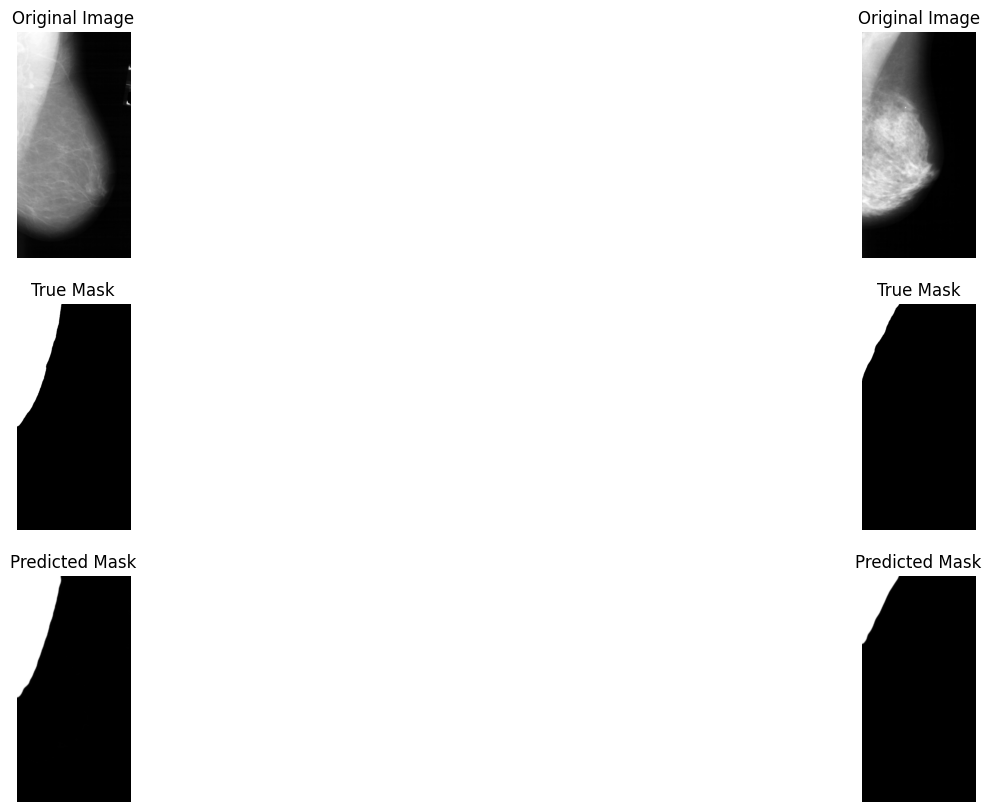

Epoch 00081: reducing learning rate of group 0 to 6.2500e-06.
Epoch 81/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8301, Sensitivity: 0.7033, Specificity: 0.9826, IoU: 0.6448


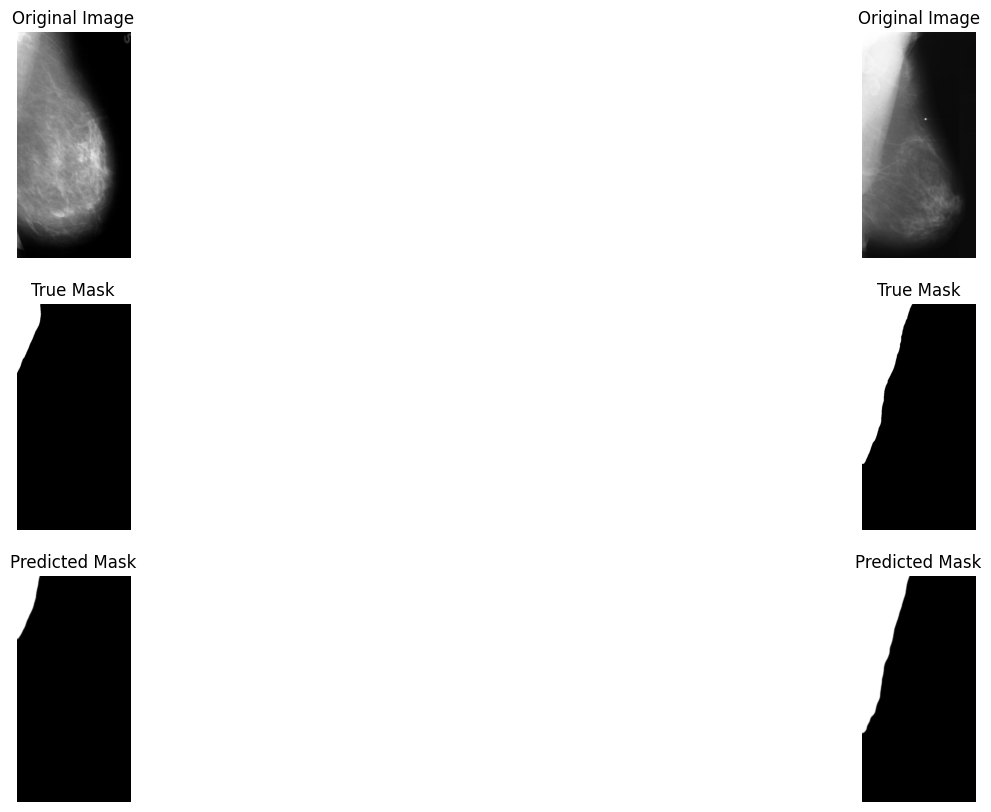

Epoch 82/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8279, Sensitivity: 0.7121, Specificity: 0.9819, IoU: 0.6503


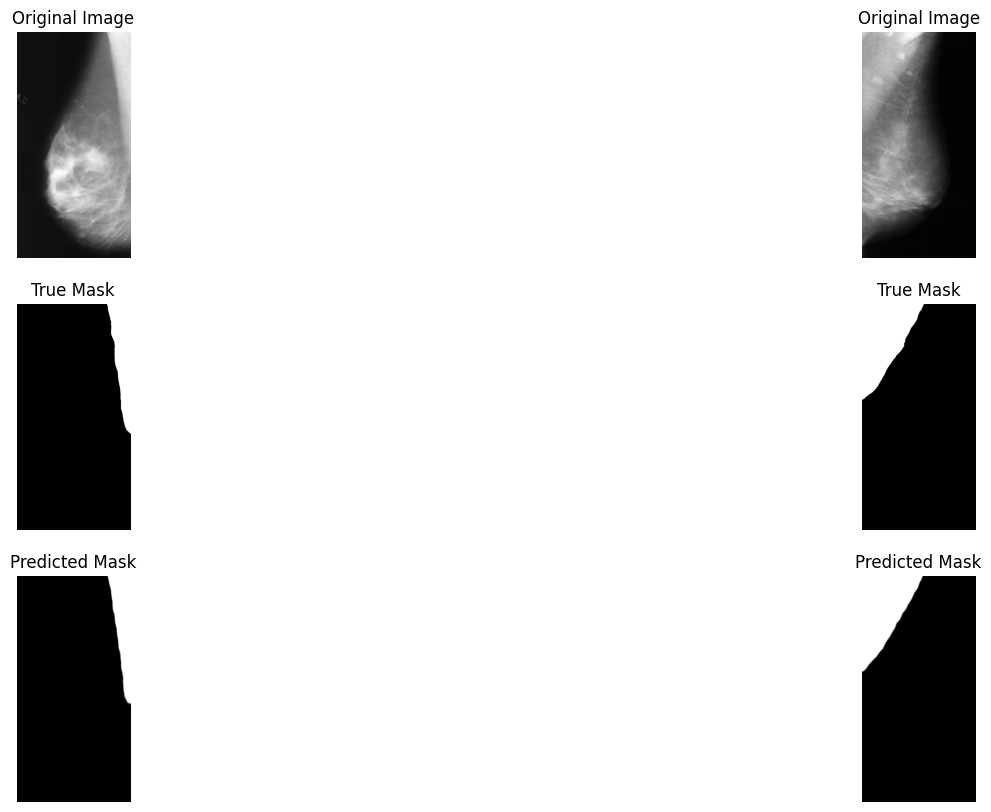

Epoch 83/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8297, Sensitivity: 0.7051, Specificity: 0.9827, IoU: 0.6470


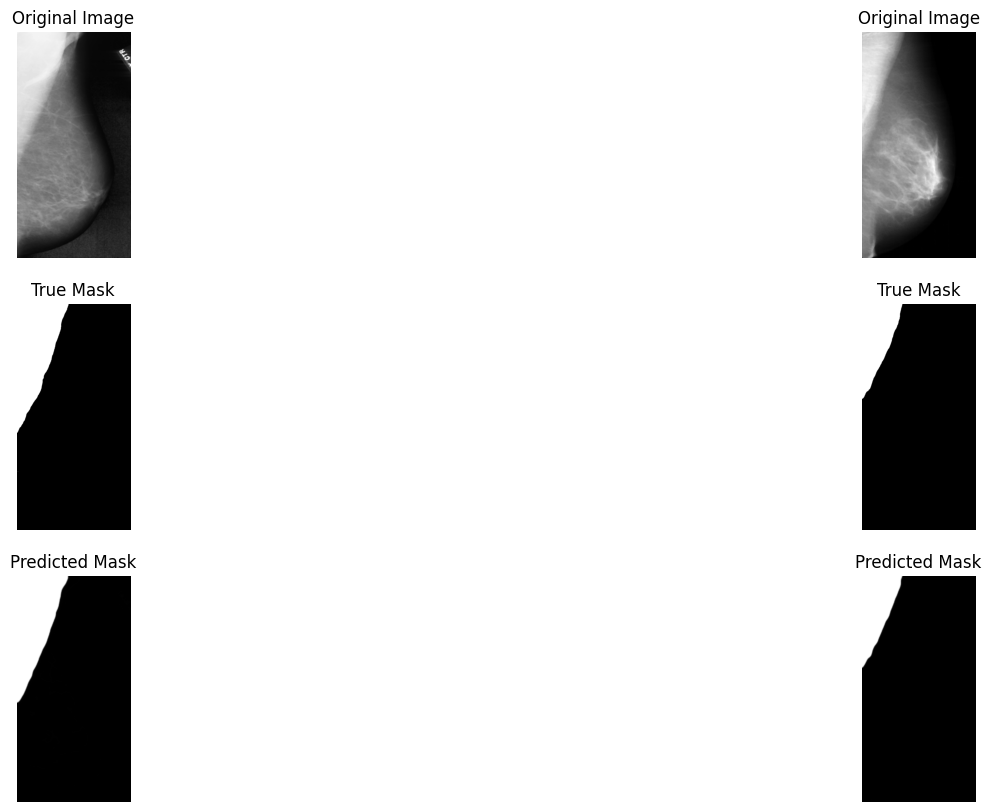

Epoch 84/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8308, Sensitivity: 0.6981, Specificity: 0.9828, IoU: 0.6407


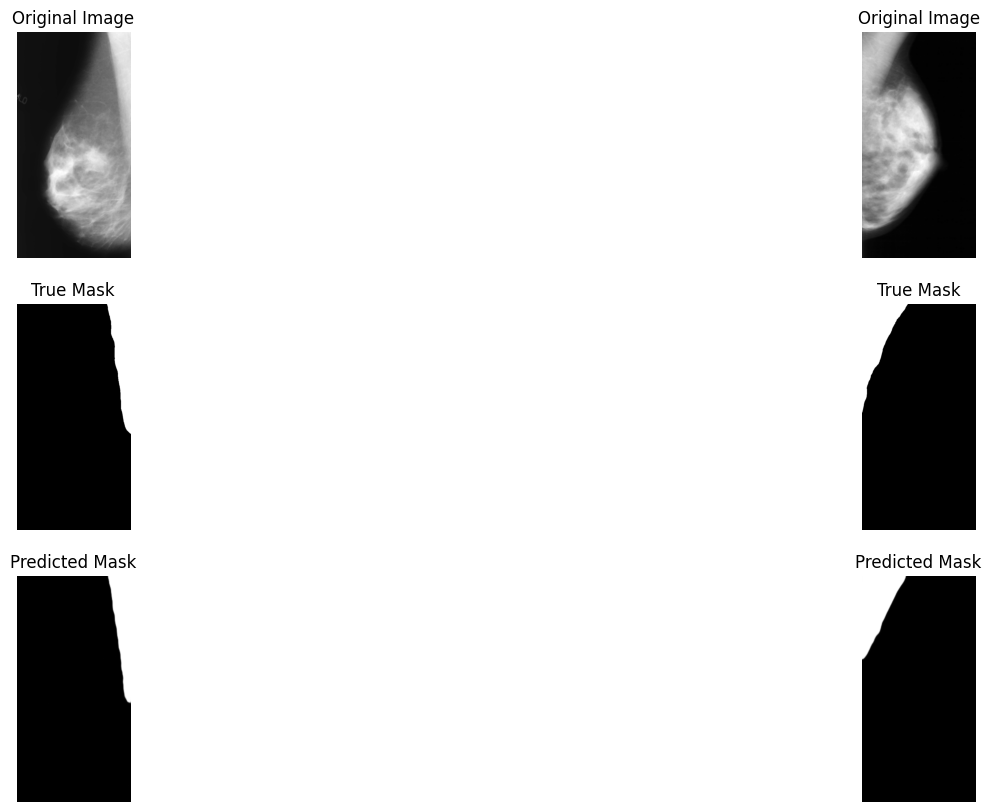

Epoch 85/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8275, Sensitivity: 0.7097, Specificity: 0.9823, IoU: 0.6493


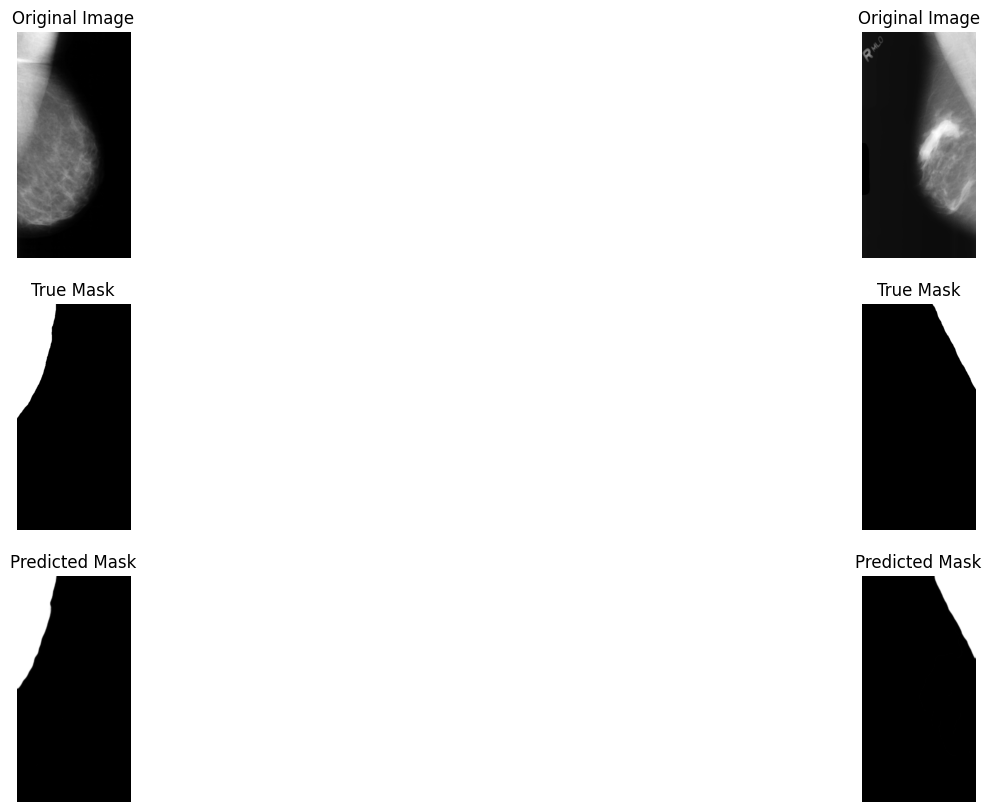

Epoch 86/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8258, Sensitivity: 0.7119, Specificity: 0.9820, IoU: 0.6500


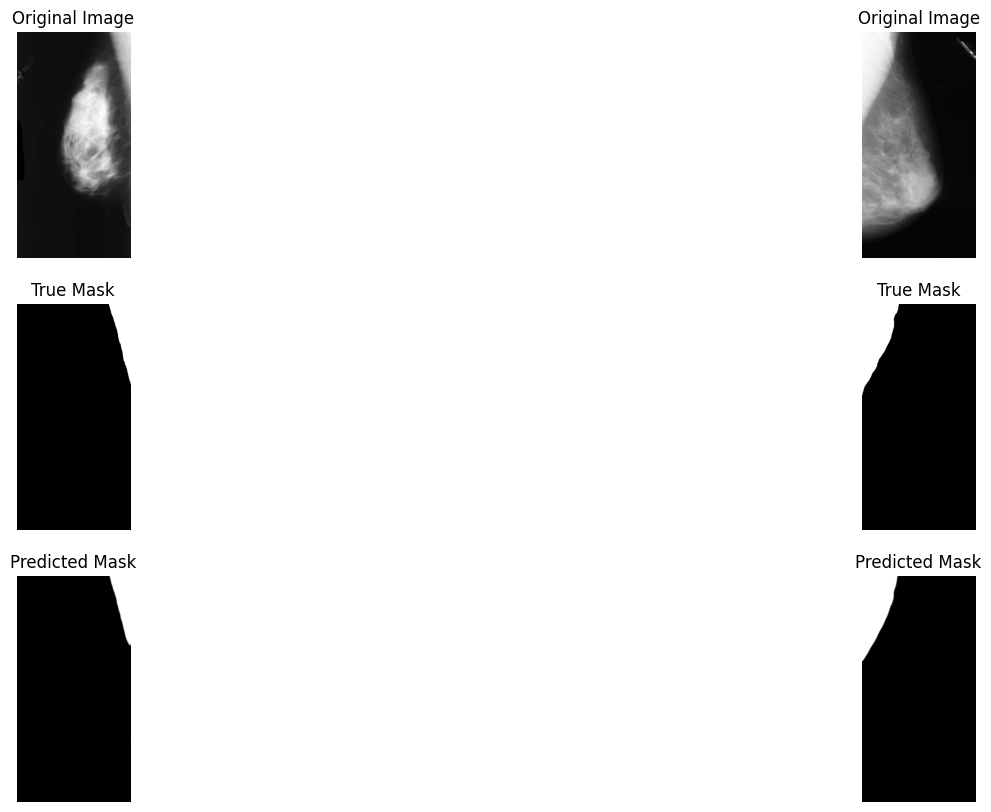

Epoch 00087: reducing learning rate of group 0 to 3.1250e-06.
Epoch 87/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8300, Sensitivity: 0.7035, Specificity: 0.9822, IoU: 0.6436


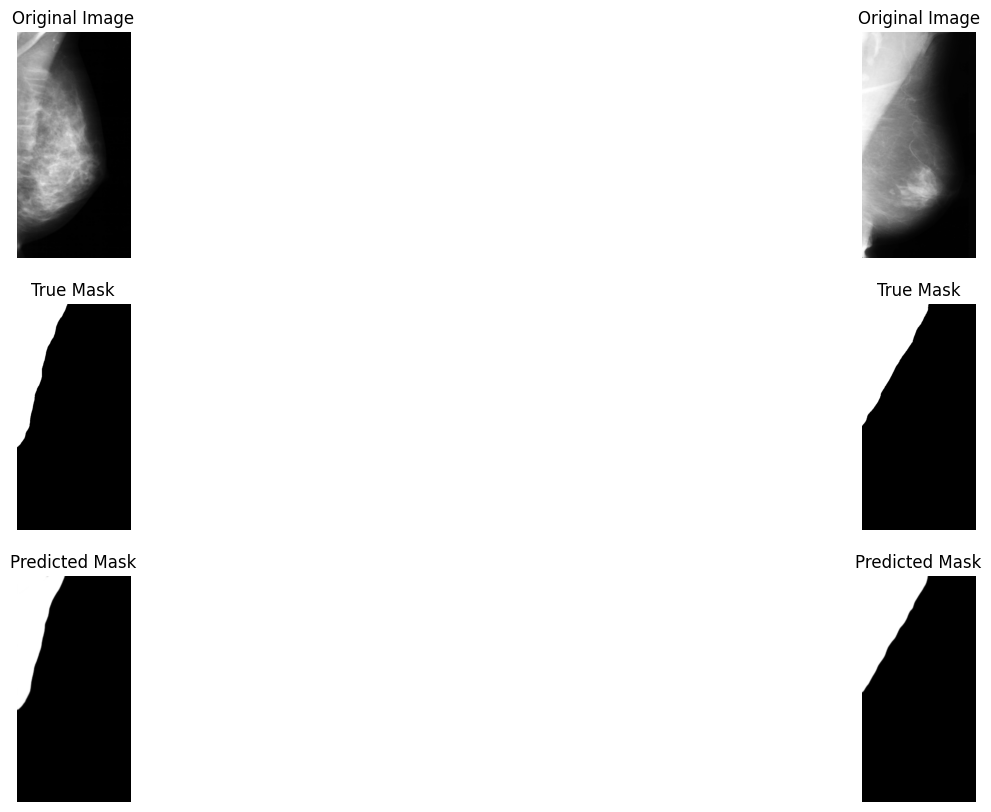

Epoch 88/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8280, Sensitivity: 0.7066, Specificity: 0.9825, IoU: 0.6476


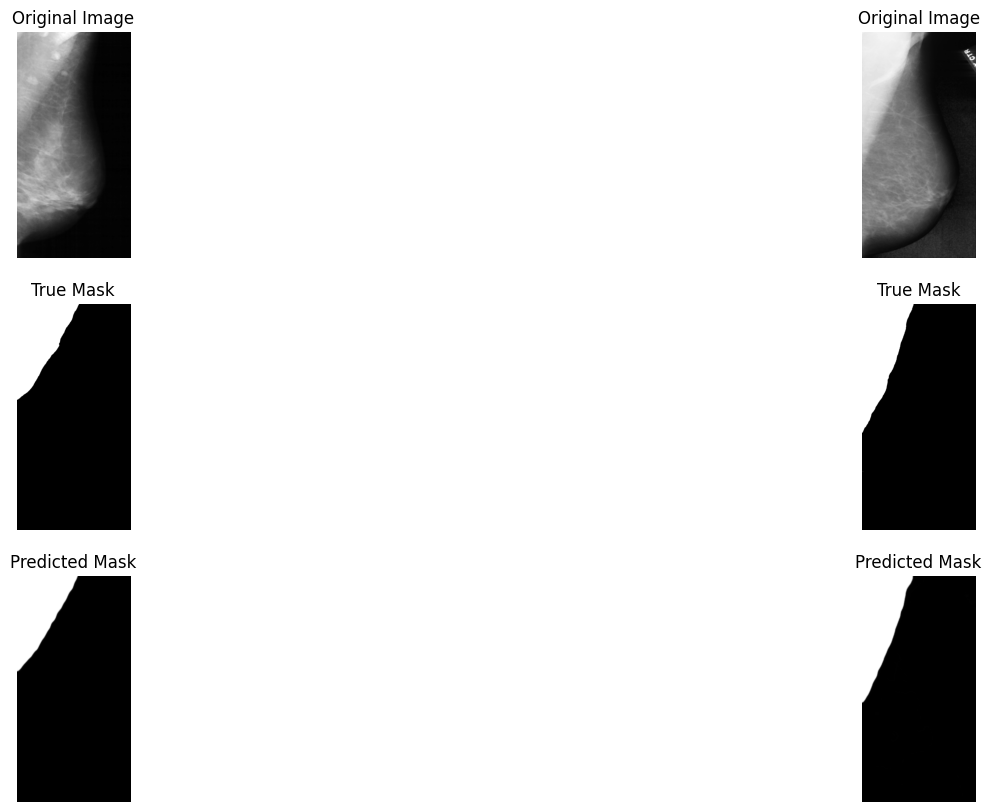

Epoch 89/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8272, Sensitivity: 0.7097, Specificity: 0.9822, IoU: 0.6489


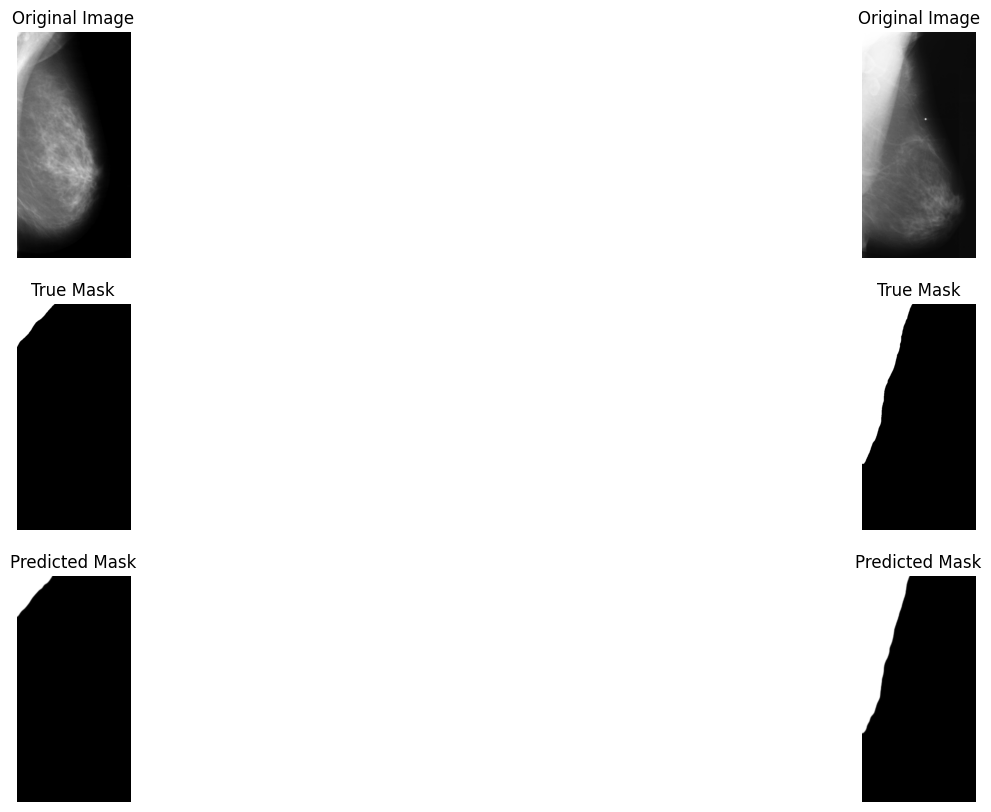

Epoch 90/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8264, Sensitivity: 0.7119, Specificity: 0.9821, IoU: 0.6502


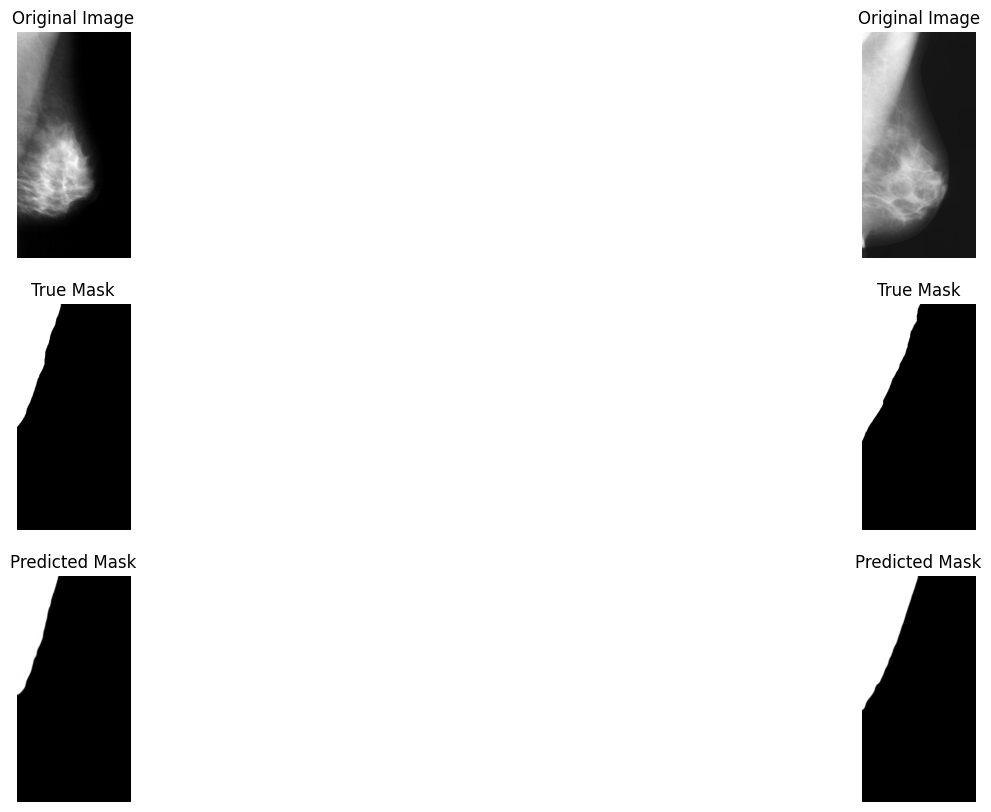

Epoch 91/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8280, Sensitivity: 0.7086, Specificity: 0.9822, IoU: 0.6482


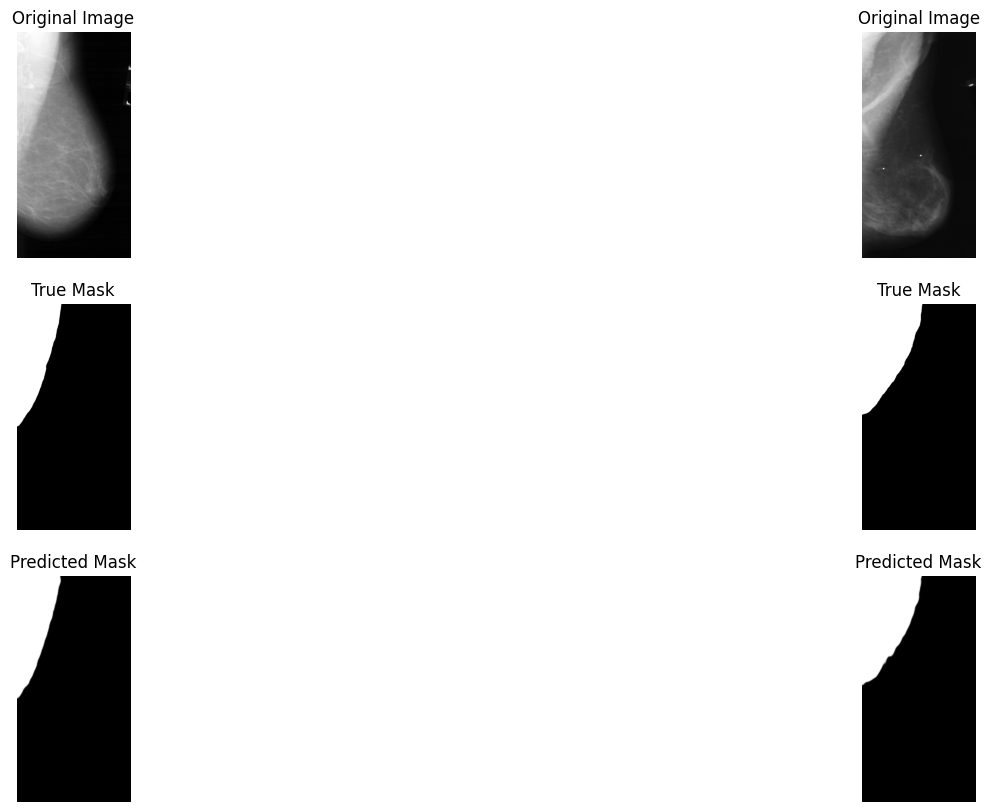

Epoch 92/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8289, Sensitivity: 0.7075, Specificity: 0.9822, IoU: 0.6471


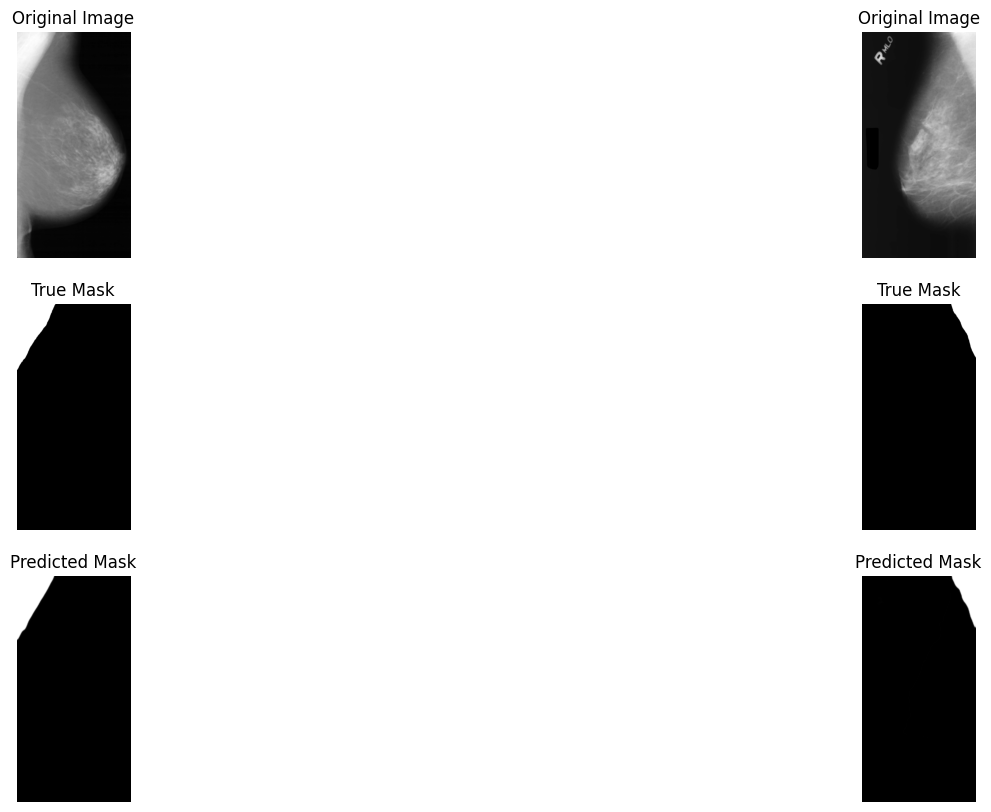

Epoch 00093: reducing learning rate of group 0 to 1.5625e-06.
Epoch 93/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8294, Sensitivity: 0.7051, Specificity: 0.9822, IoU: 0.6449


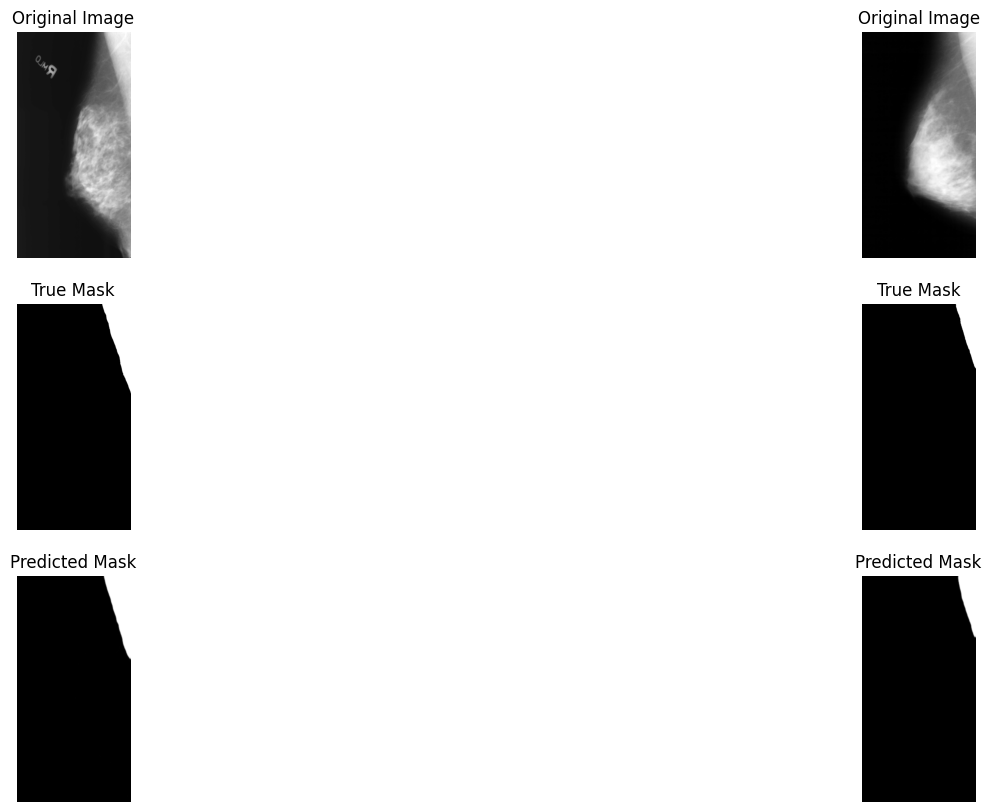

Epoch 94/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8301, Sensitivity: 0.7028, Specificity: 0.9825, IoU: 0.6440


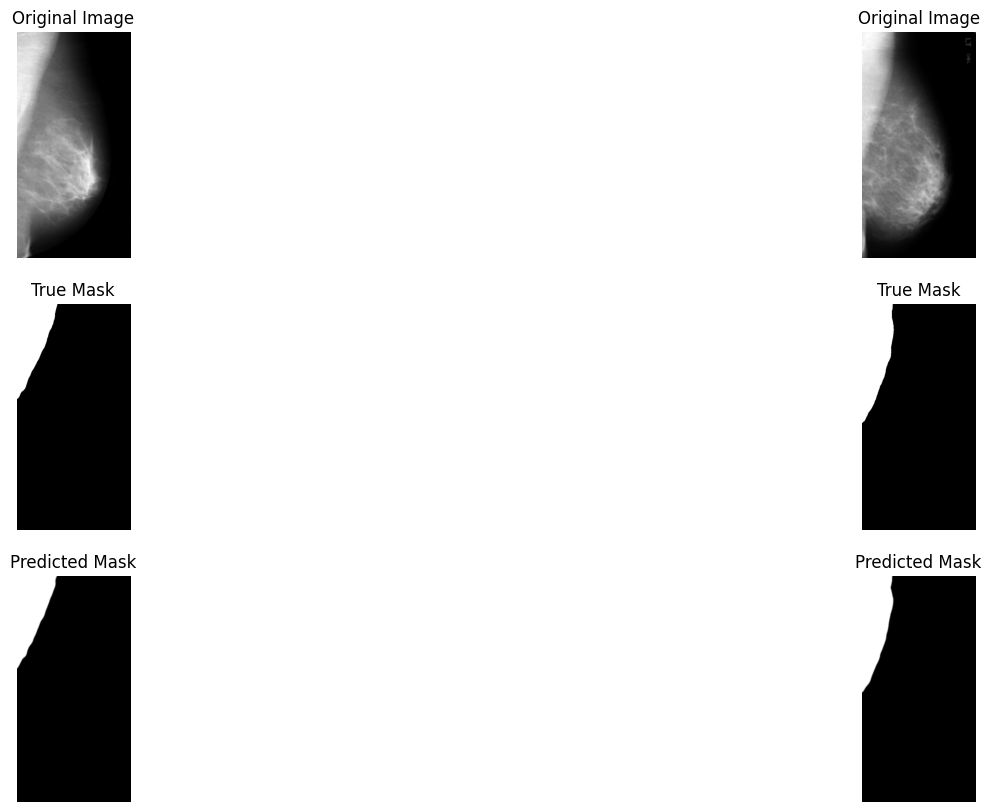

Epoch 95/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8301, Sensitivity: 0.7021, Specificity: 0.9825, IoU: 0.6433


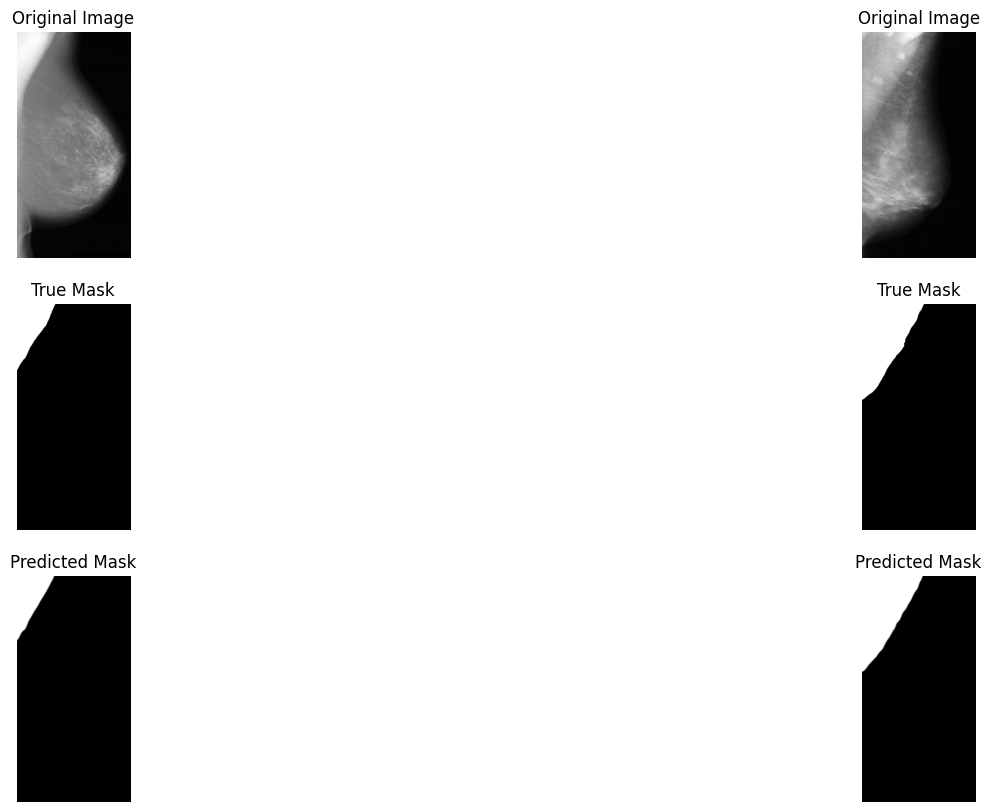

Epoch 96/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8296, Sensitivity: 0.7054, Specificity: 0.9825, IoU: 0.6464


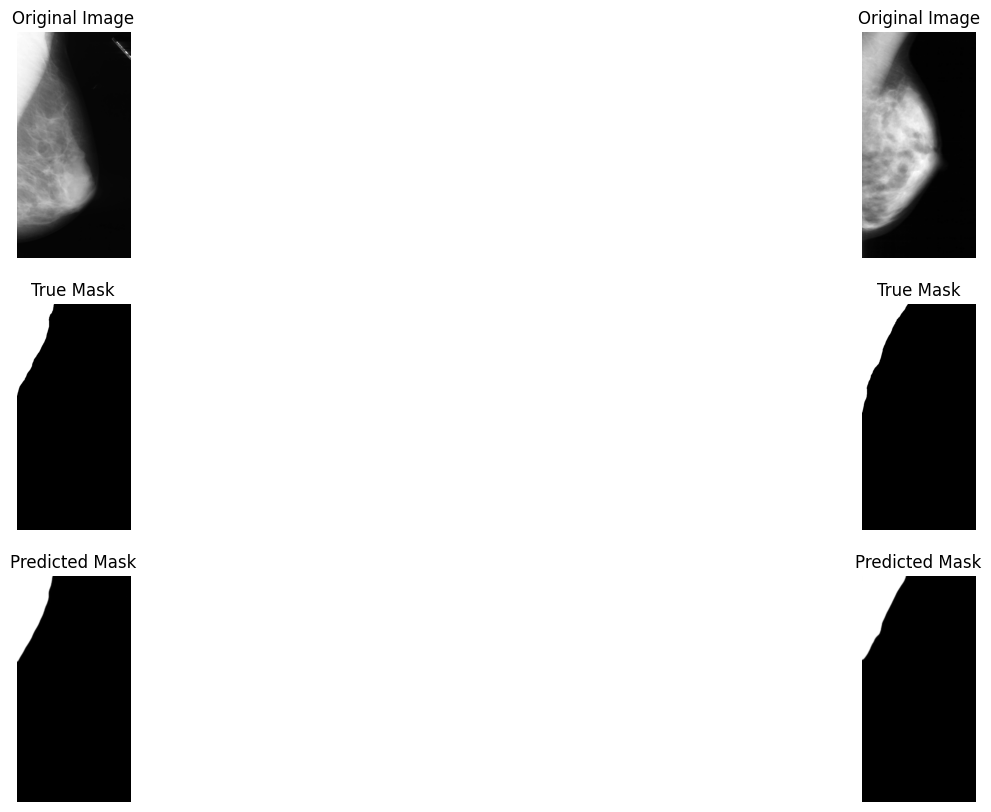

Epoch 97/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8284, Sensitivity: 0.7086, Specificity: 0.9823, IoU: 0.6484


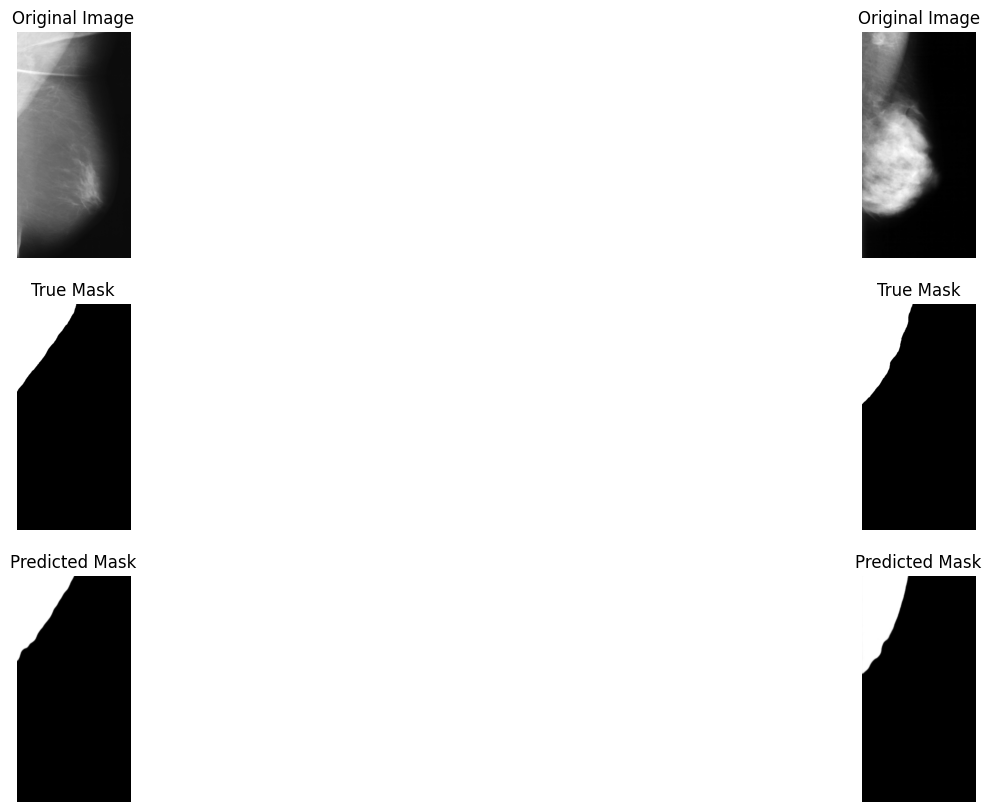

Epoch 98/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8295, Sensitivity: 0.7078, Specificity: 0.9823, IoU: 0.6477


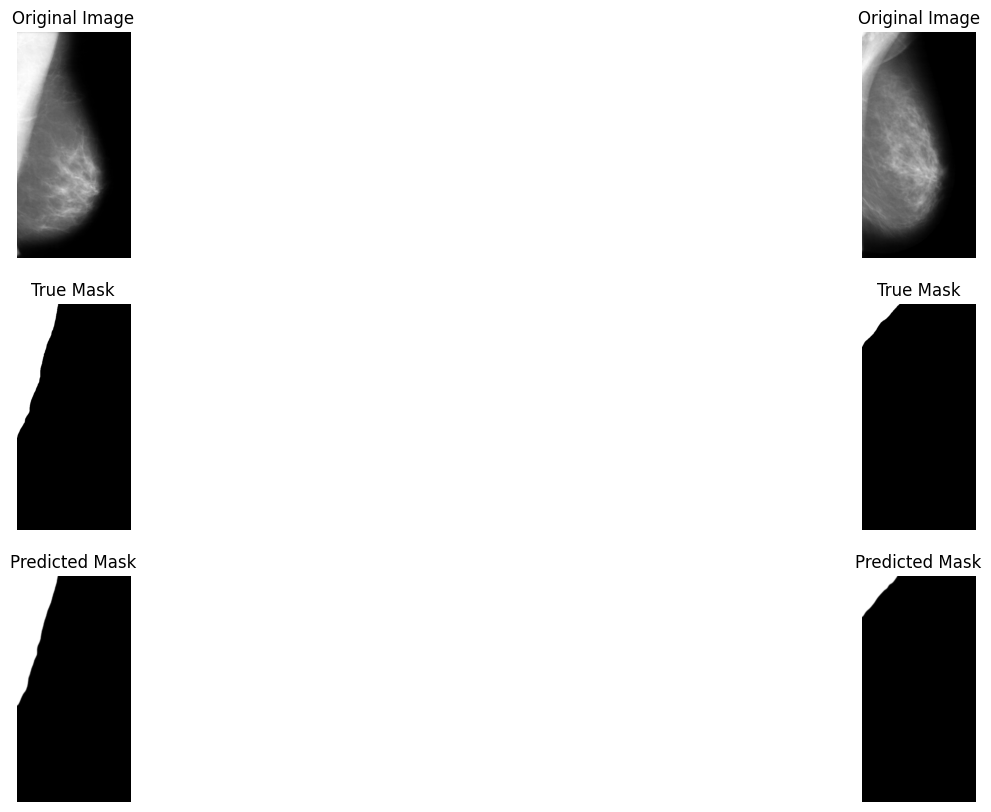

Epoch 00099: reducing learning rate of group 0 to 7.8125e-07.
Epoch 99/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8279, Sensitivity: 0.7089, Specificity: 0.9822, IoU: 0.6482


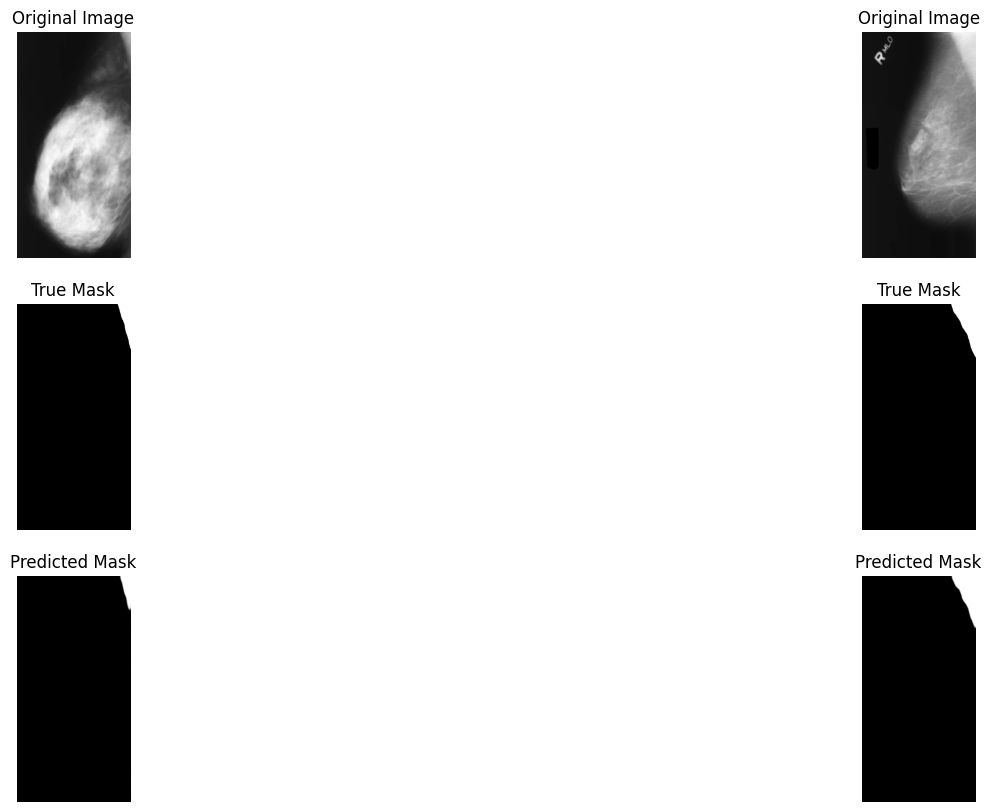

Epoch 100/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8295, Sensitivity: 0.7061, Specificity: 0.9824, IoU: 0.6467


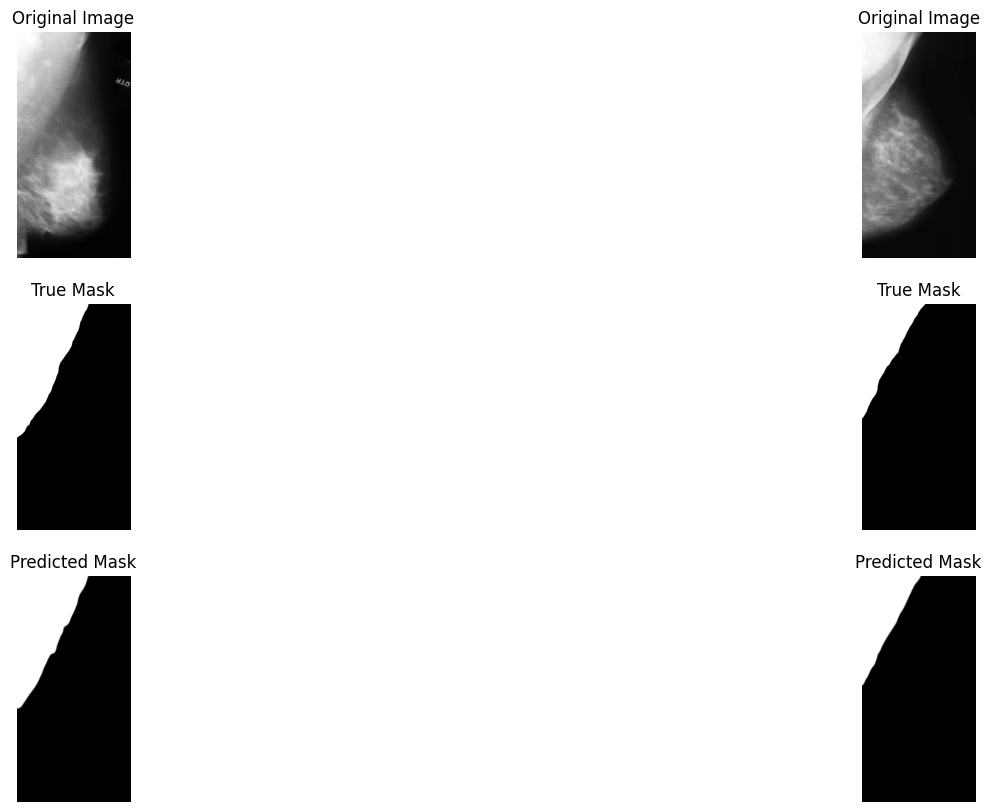

Epoch 101/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8257, Sensitivity: 0.7144, Specificity: 0.9817, IoU: 0.6510


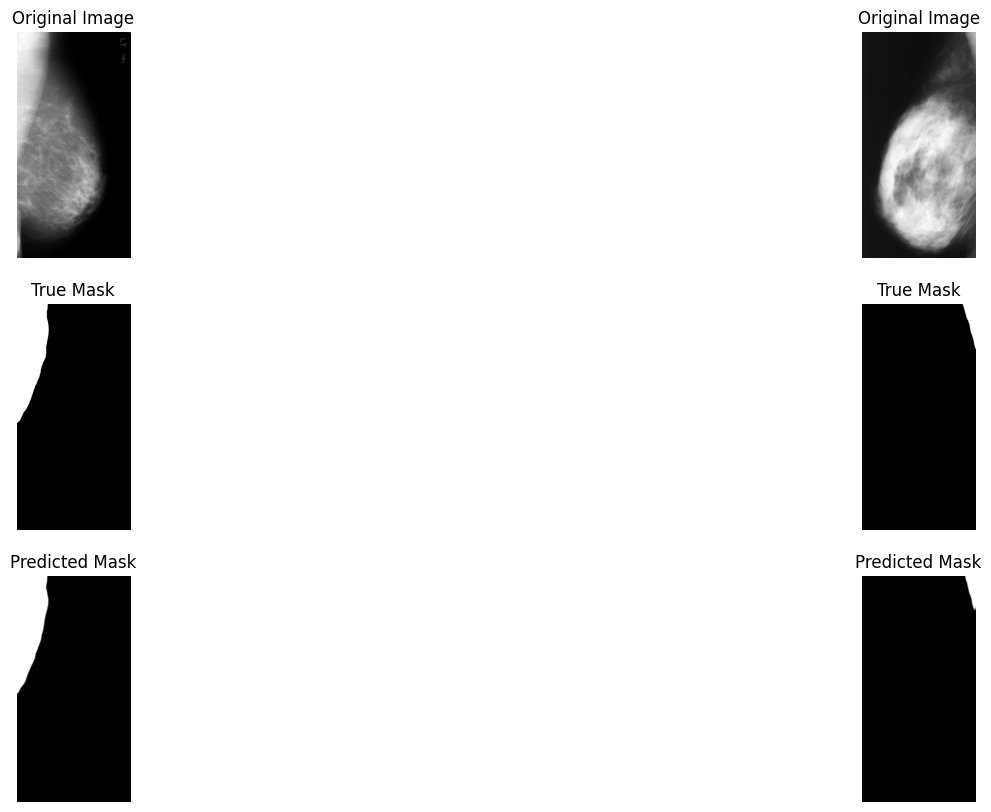

Epoch 102/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8270, Sensitivity: 0.7118, Specificity: 0.9819, IoU: 0.6496


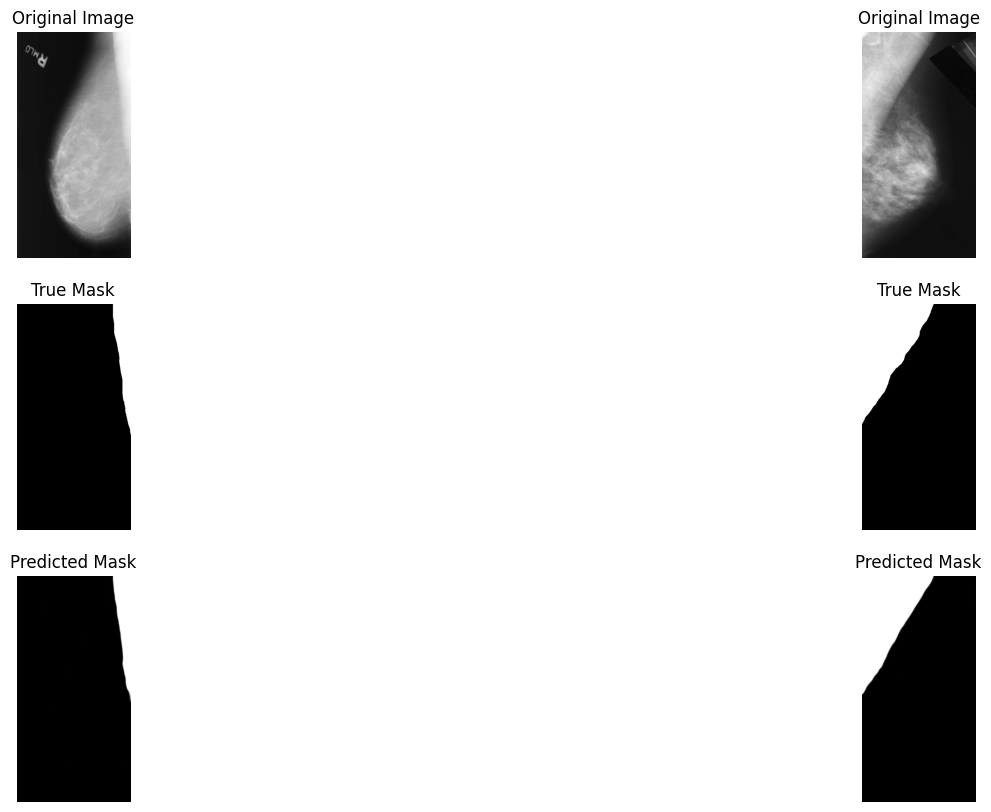

Epoch 103/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8283, Sensitivity: 0.7092, Specificity: 0.9819, IoU: 0.6475


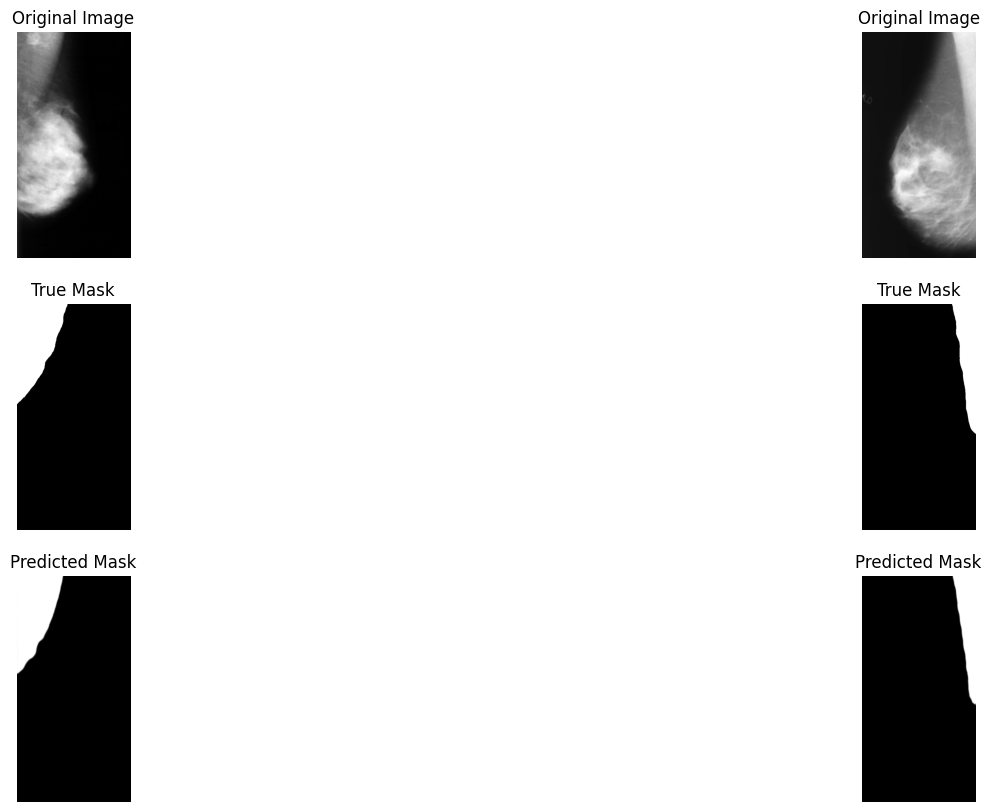

Epoch 104/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8272, Sensitivity: 0.7108, Specificity: 0.9820, IoU: 0.6488


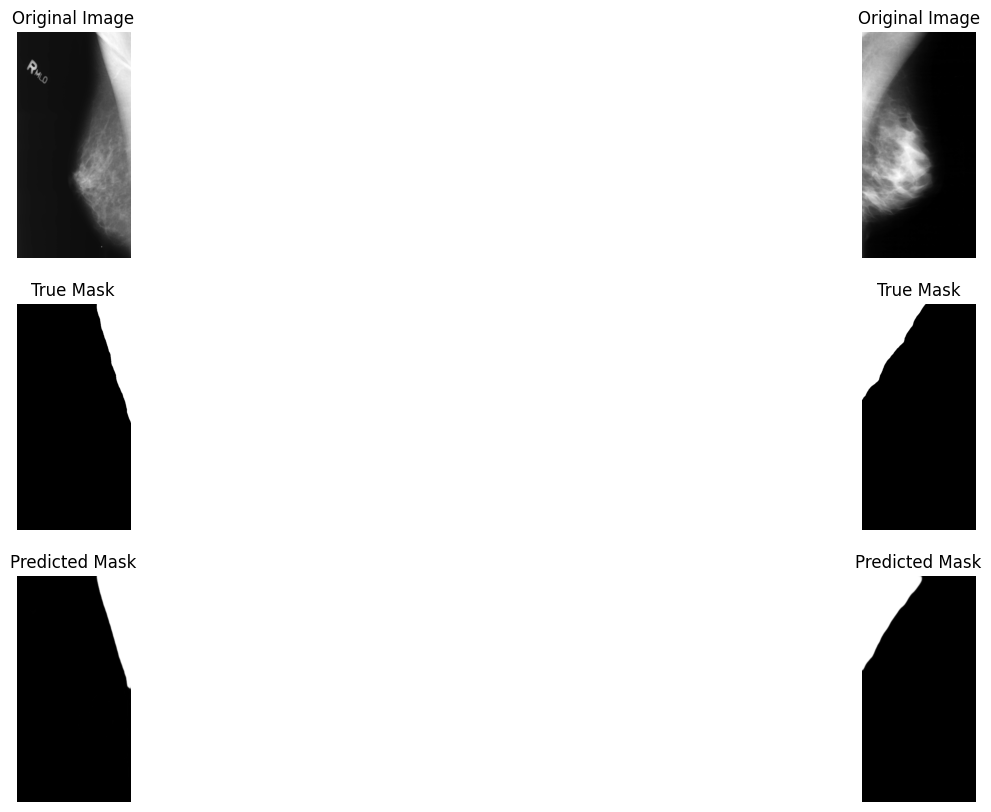

Epoch 00105: reducing learning rate of group 0 to 3.9063e-07.
Epoch 105/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8286, Sensitivity: 0.7079, Specificity: 0.9822, IoU: 0.6474


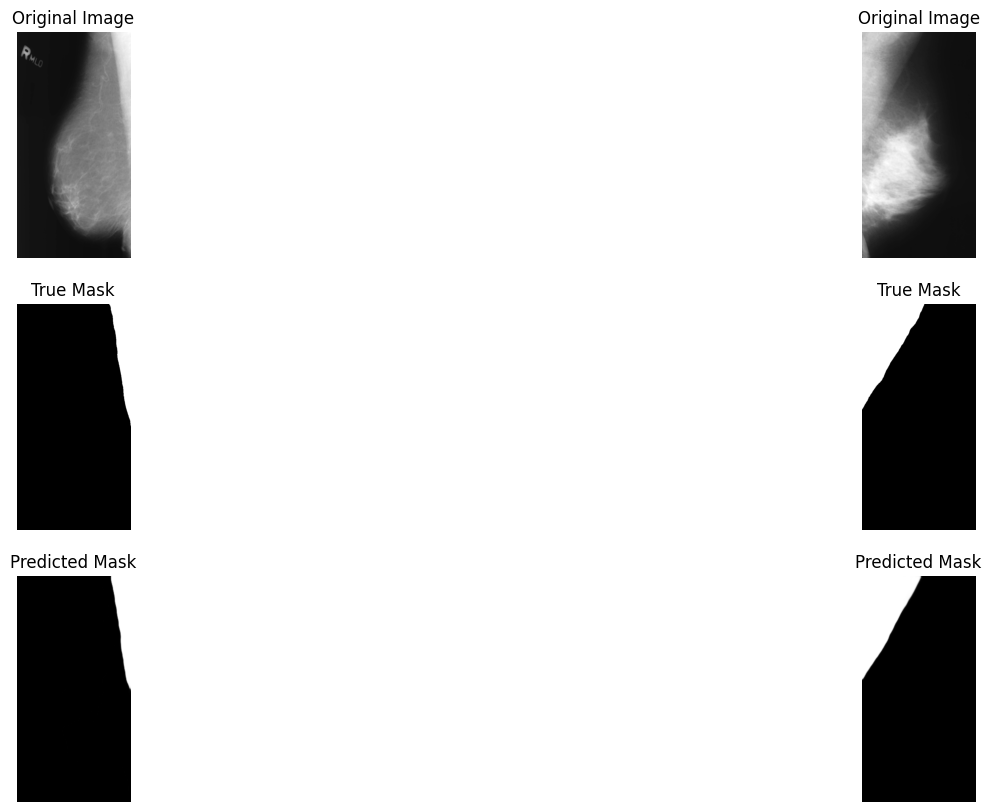

Epoch 106/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8289, Sensitivity: 0.7093, Specificity: 0.9821, IoU: 0.6485


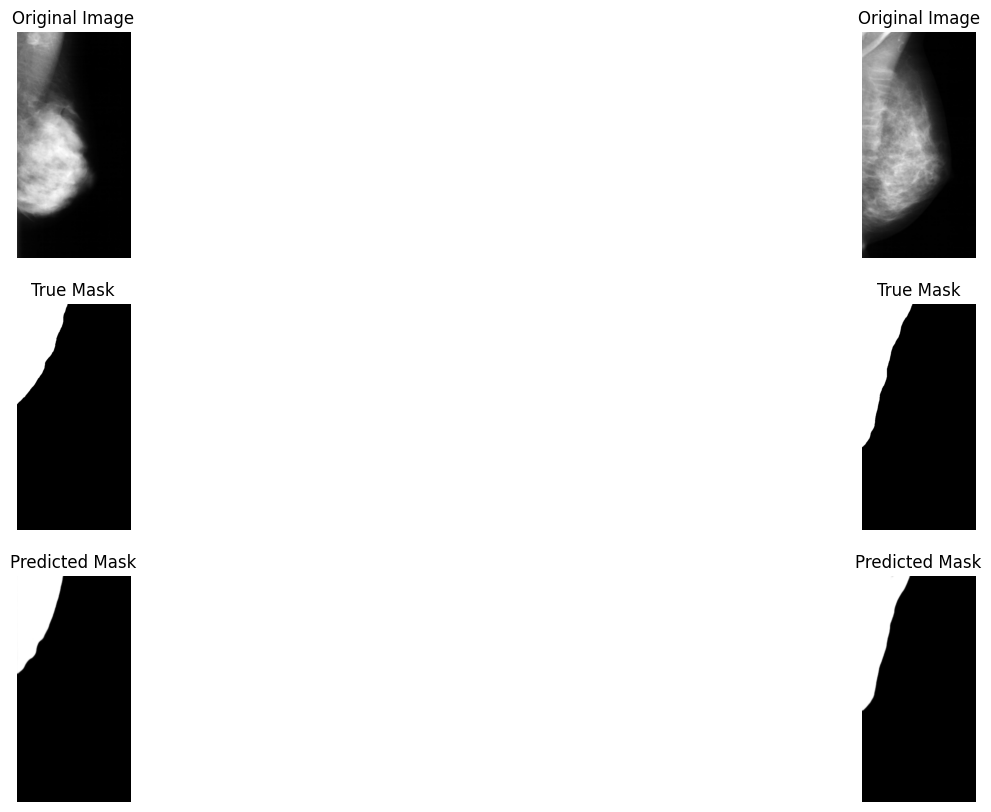

Epoch 107/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8249, Sensitivity: 0.7152, Specificity: 0.9818, IoU: 0.6519


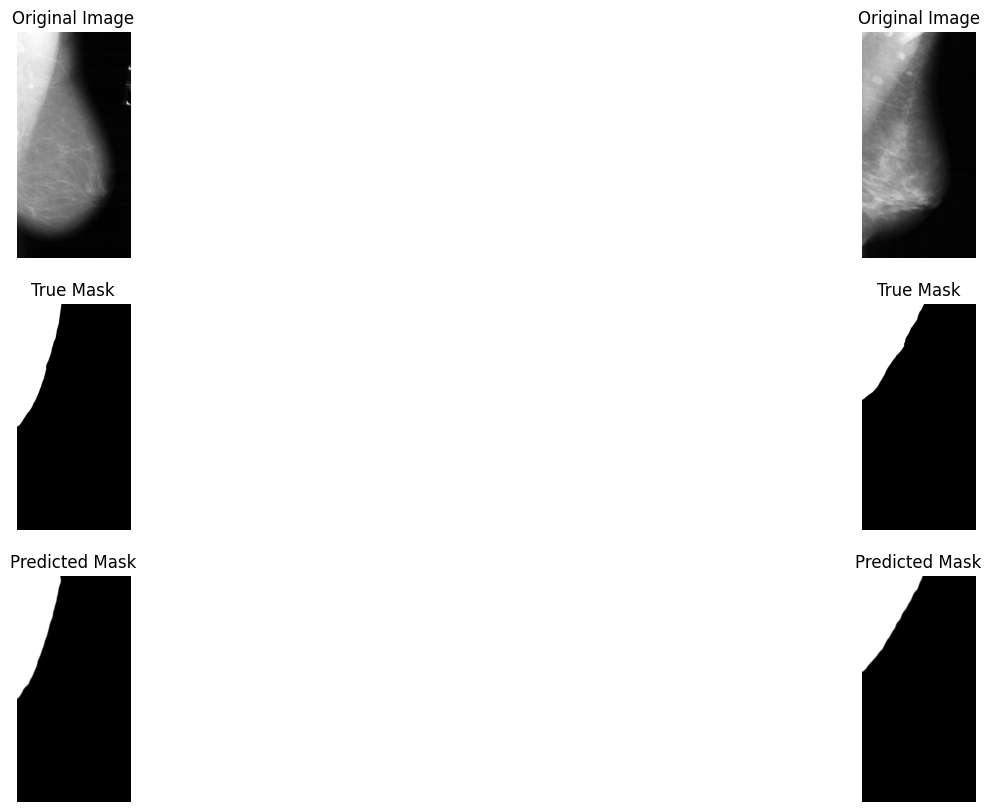

Epoch 108/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8289, Sensitivity: 0.7092, Specificity: 0.9821, IoU: 0.6484


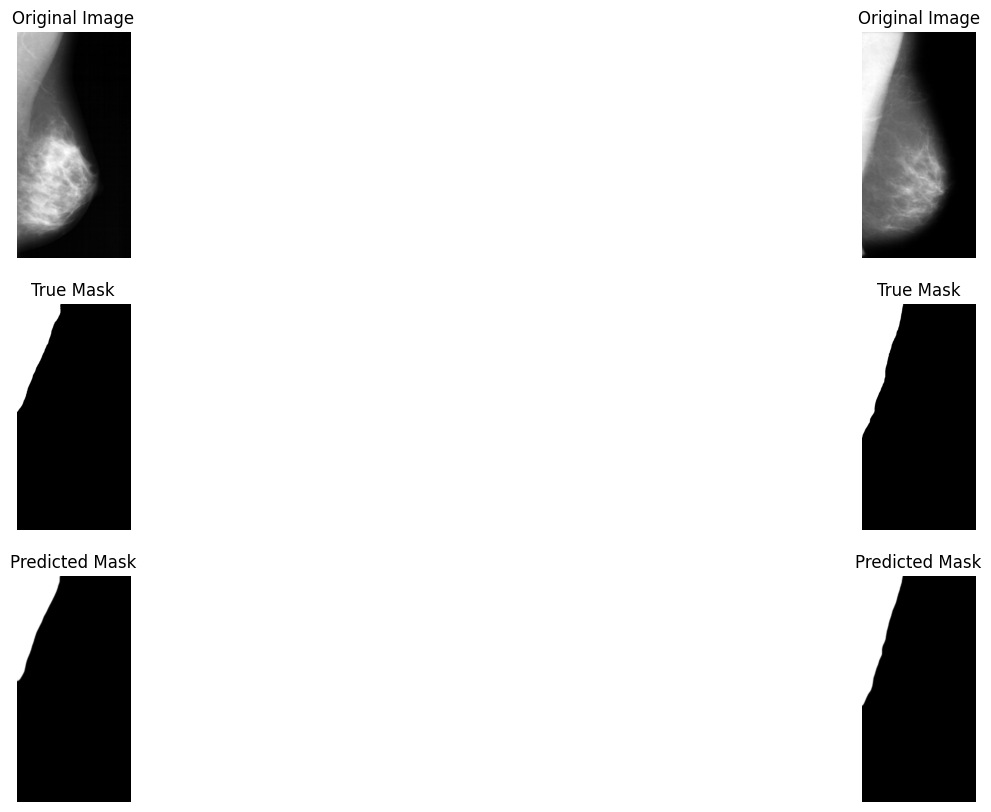

Epoch 109/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8274, Sensitivity: 0.7100, Specificity: 0.9822, IoU: 0.6493


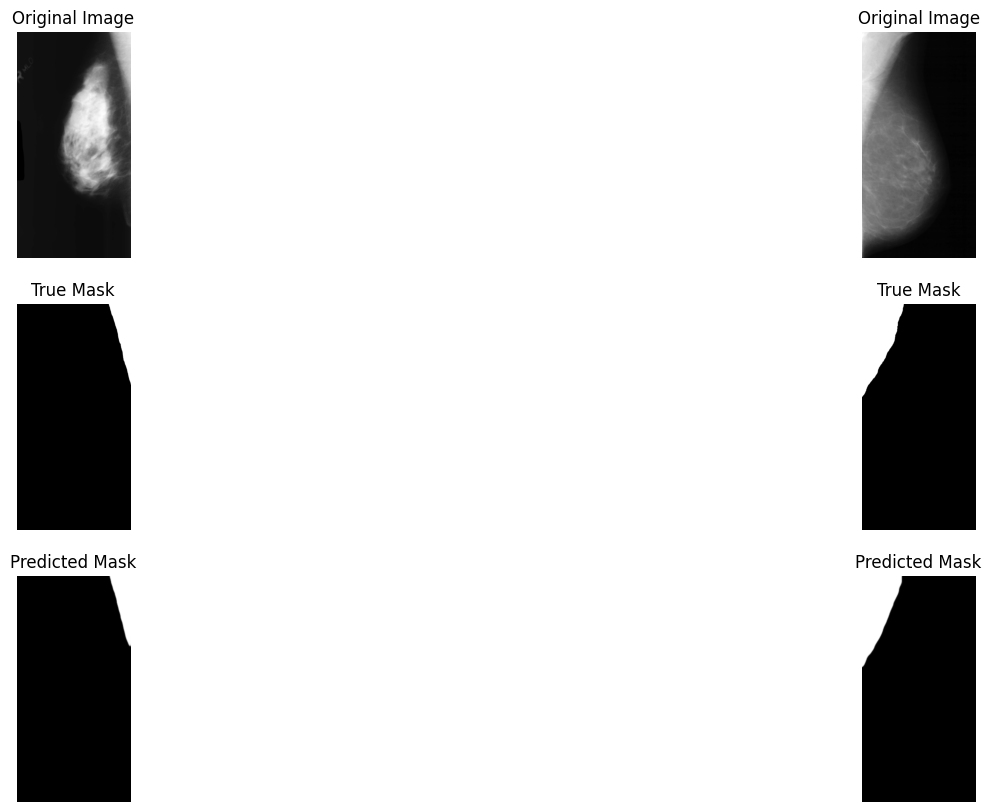

Epoch 110/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8277, Sensitivity: 0.7095, Specificity: 0.9821, IoU: 0.6483


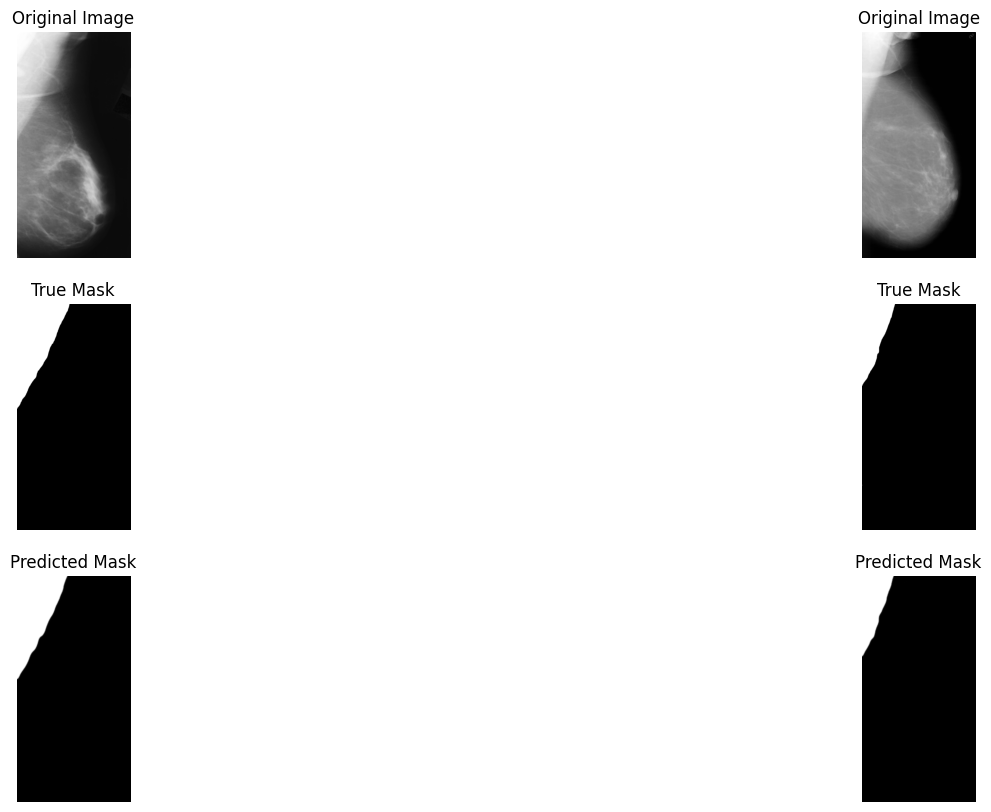

Epoch 00111: reducing learning rate of group 0 to 1.9531e-07.
Epoch 111/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8256, Sensitivity: 0.7139, Specificity: 0.9818, IoU: 0.6510


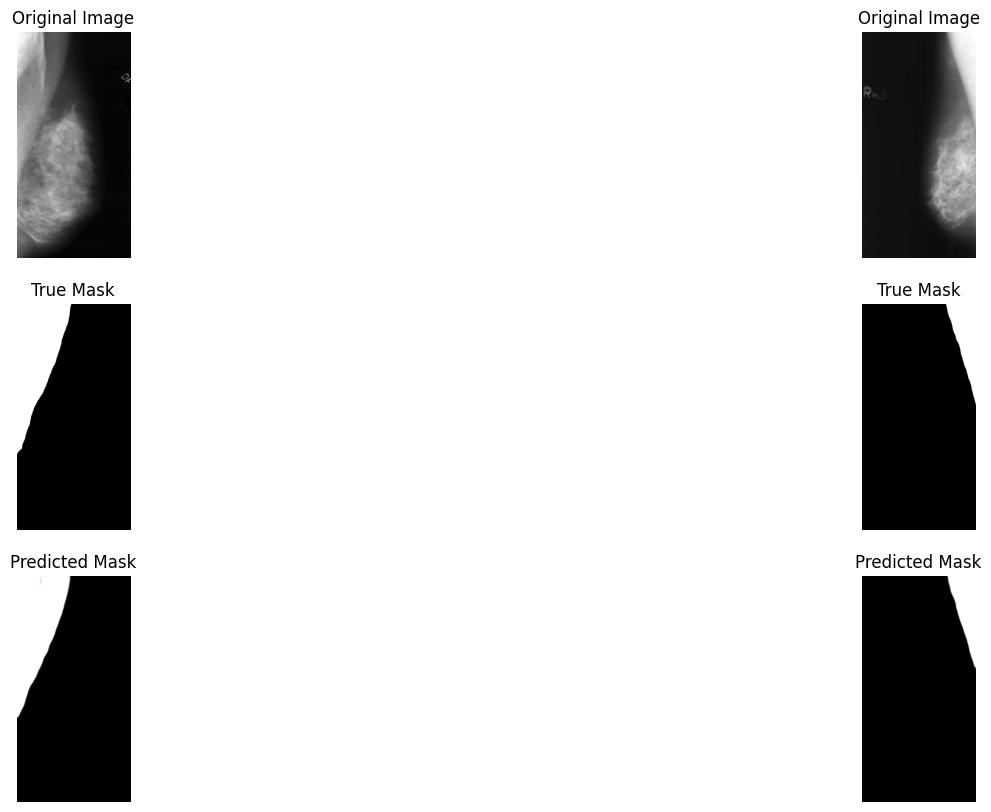

Epoch 112/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8272, Sensitivity: 0.7102, Specificity: 0.9821, IoU: 0.6491


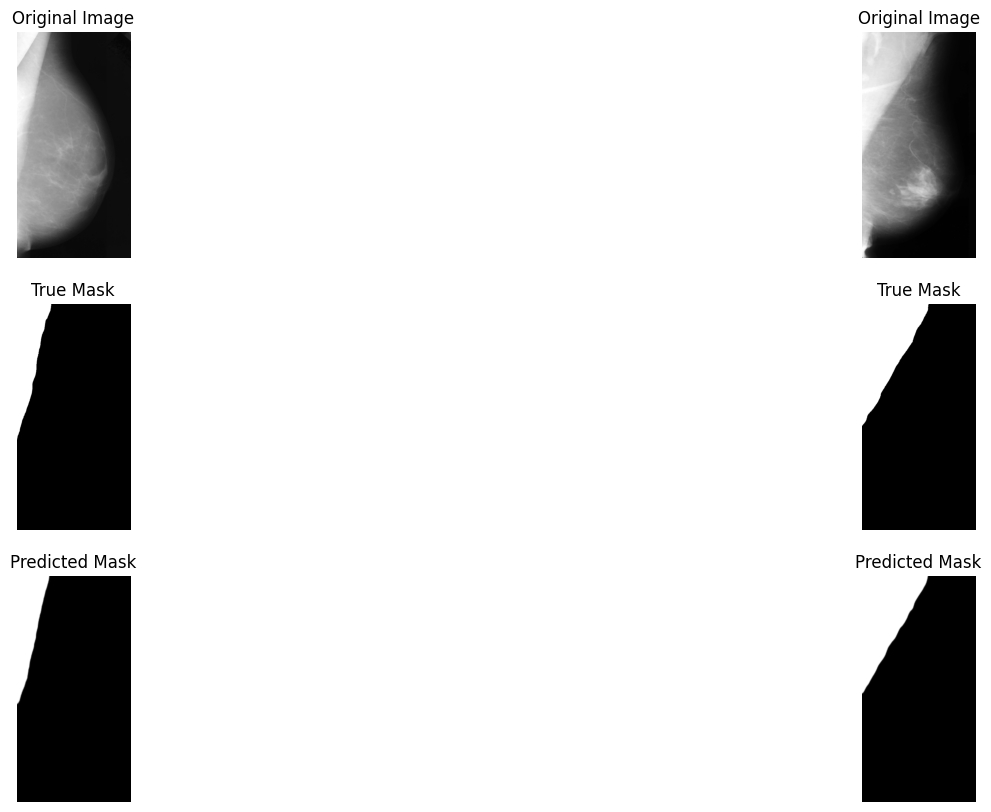

Epoch 113/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8262, Sensitivity: 0.7133, Specificity: 0.9819, IoU: 0.6510


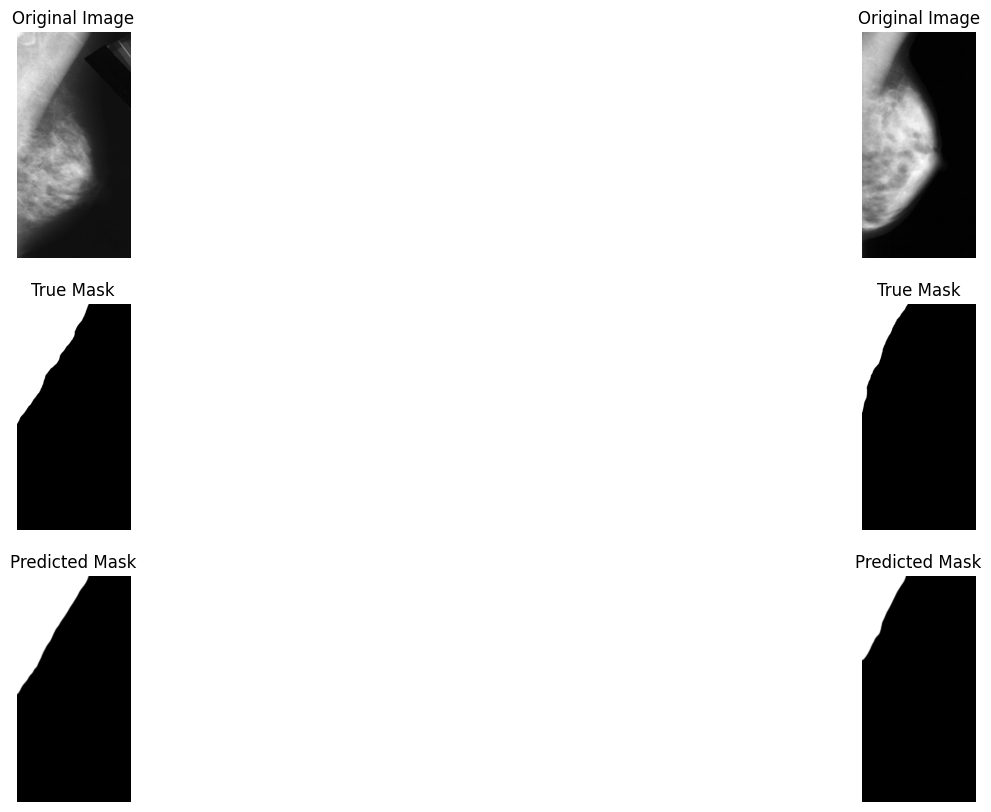

Epoch 114/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8267, Sensitivity: 0.7113, Specificity: 0.9821, IoU: 0.6496


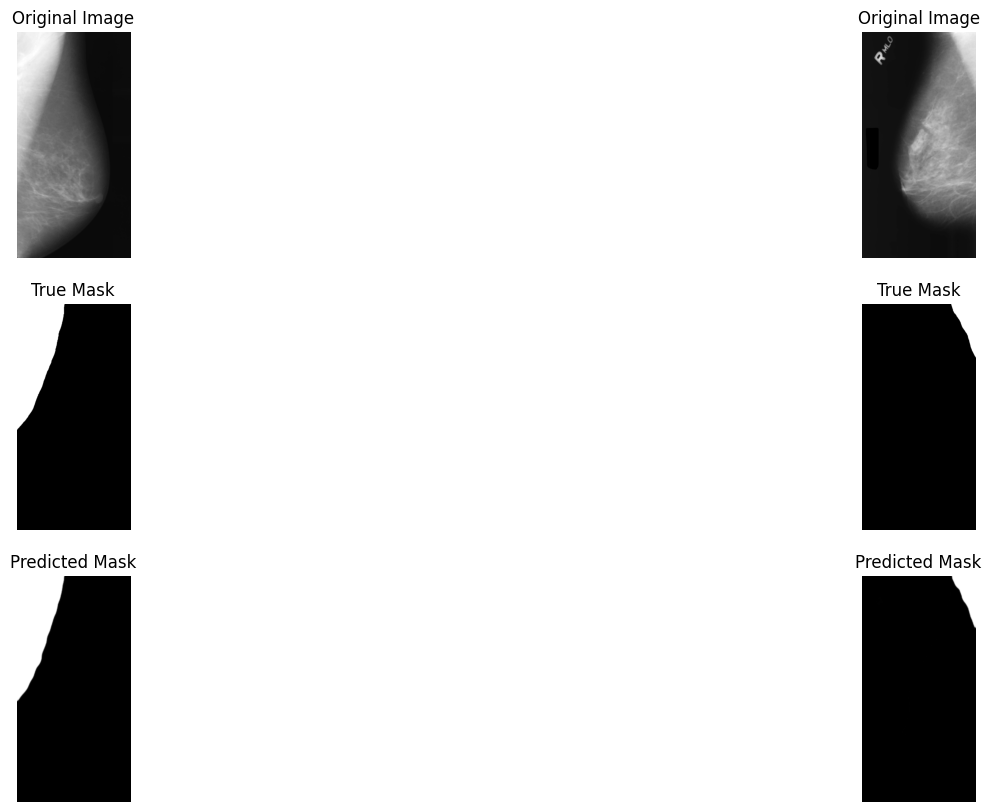

Epoch 115/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8273, Sensitivity: 0.7117, Specificity: 0.9818, IoU: 0.6493


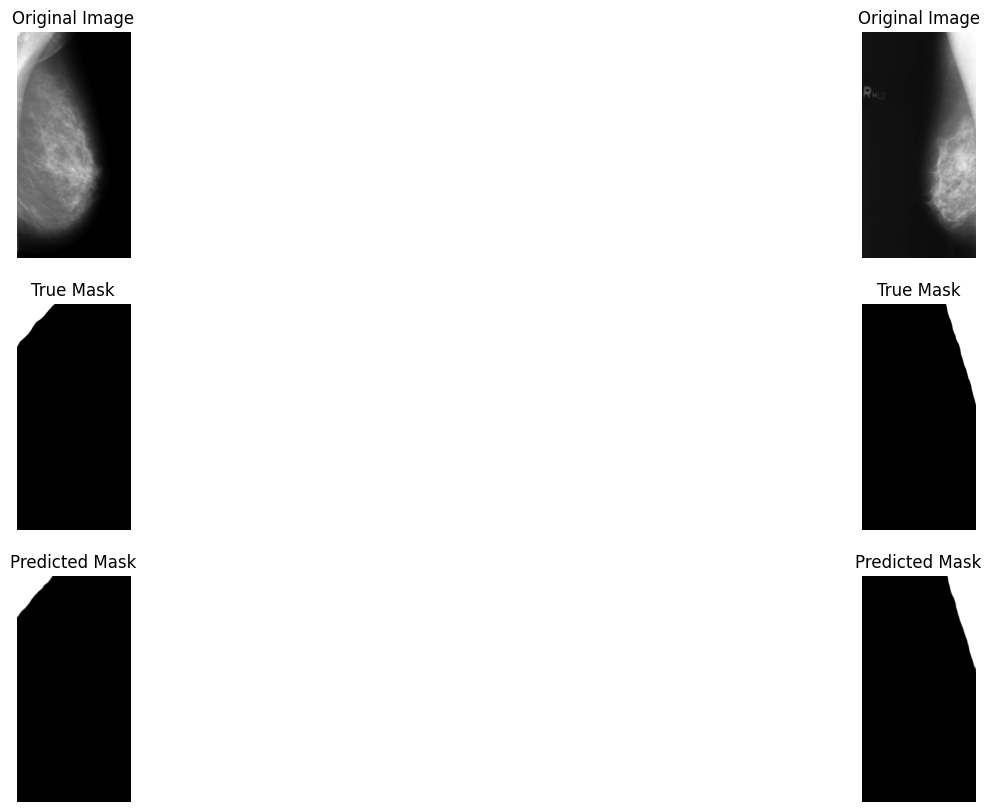

Epoch 116/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8259, Sensitivity: 0.7146, Specificity: 0.9817, IoU: 0.6511


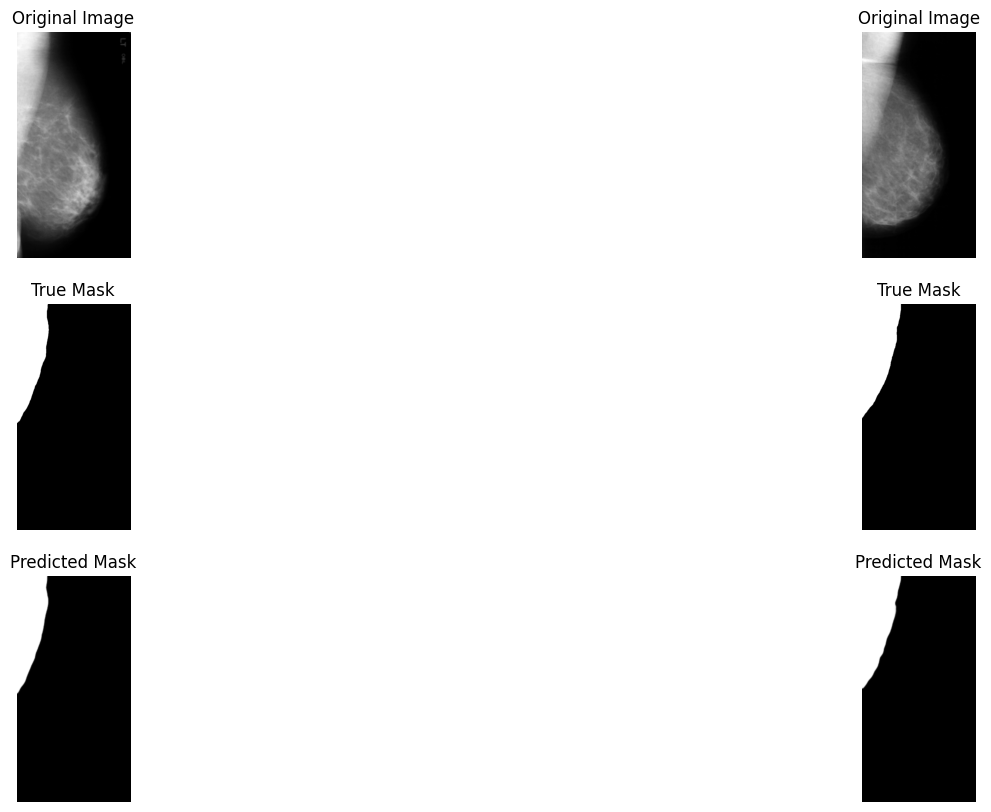

Epoch 00117: reducing learning rate of group 0 to 9.7656e-08.
Epoch 117/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8248, Sensitivity: 0.7159, Specificity: 0.9817, IoU: 0.6523


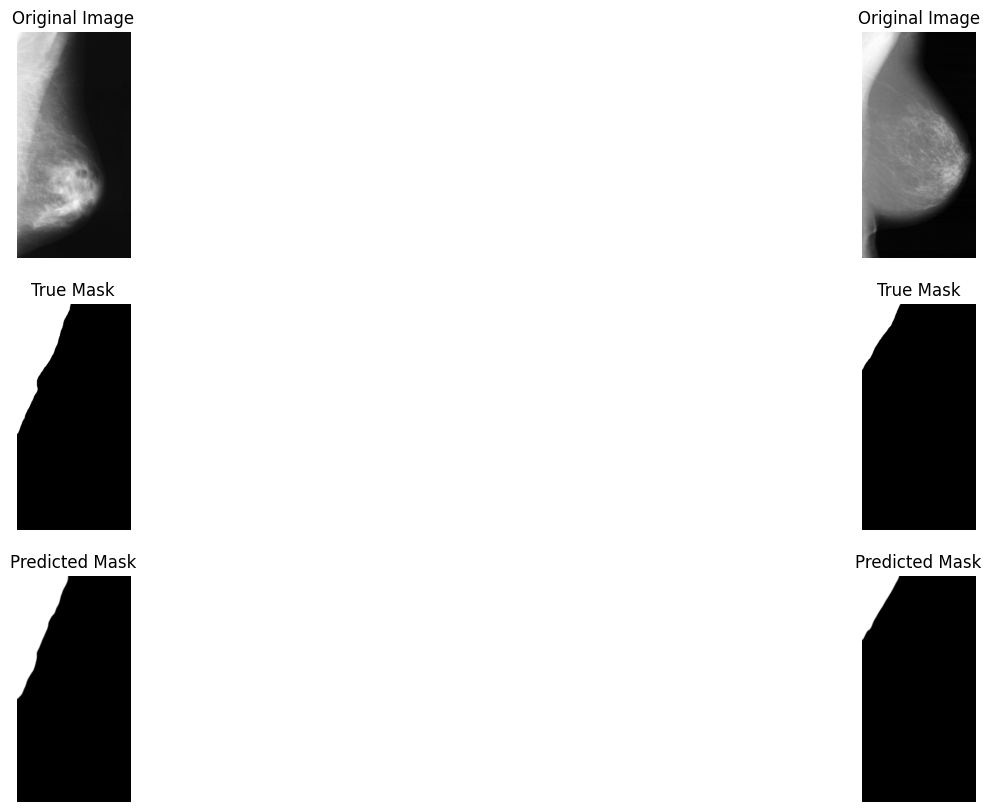

Epoch 118/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8297, Sensitivity: 0.7059, Specificity: 0.9823, IoU: 0.6459


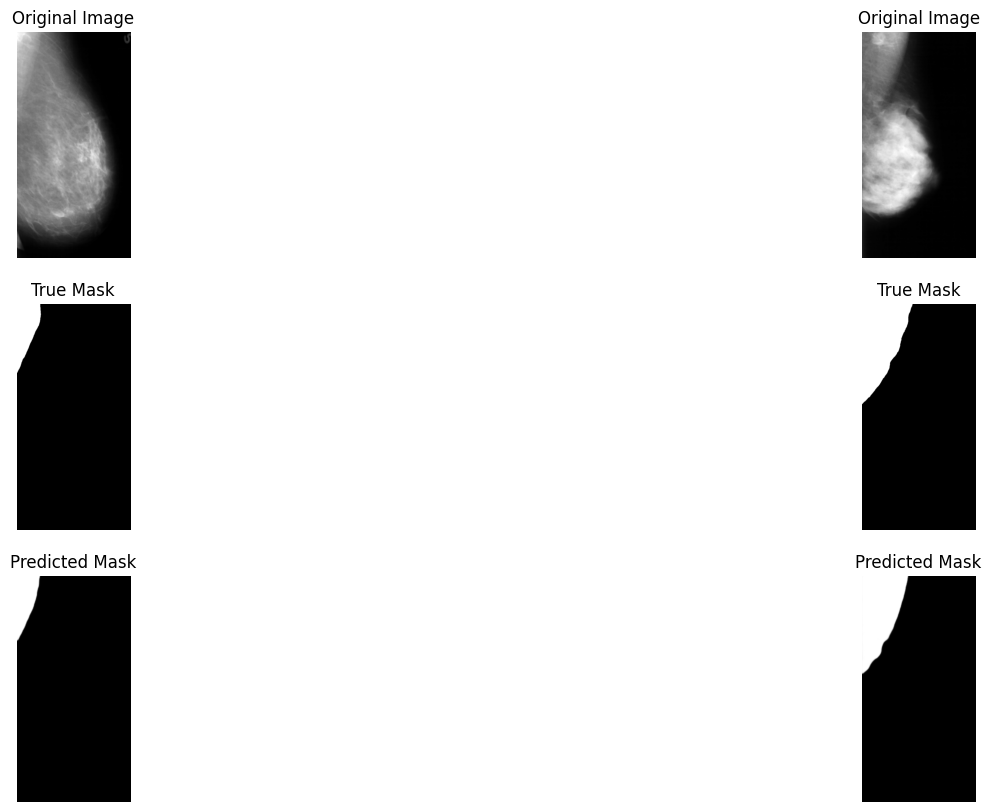

Epoch 119/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8282, Sensitivity: 0.7104, Specificity: 0.9821, IoU: 0.6494


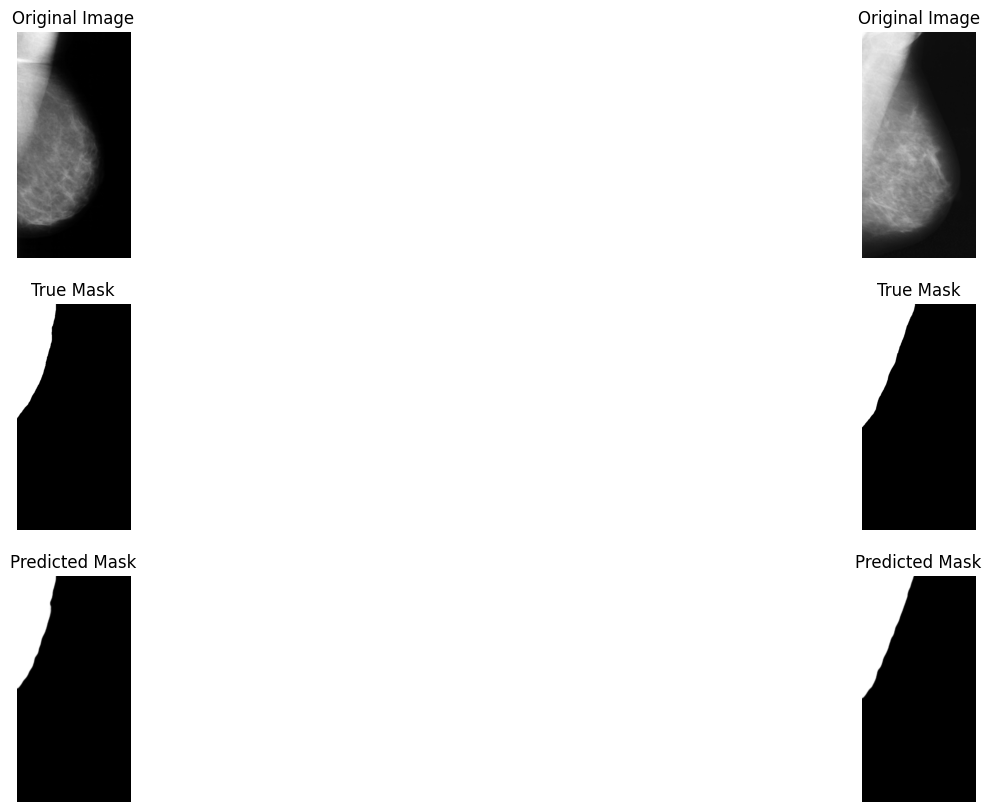

Epoch 120/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8262, Sensitivity: 0.7149, Specificity: 0.9817, IoU: 0.6515


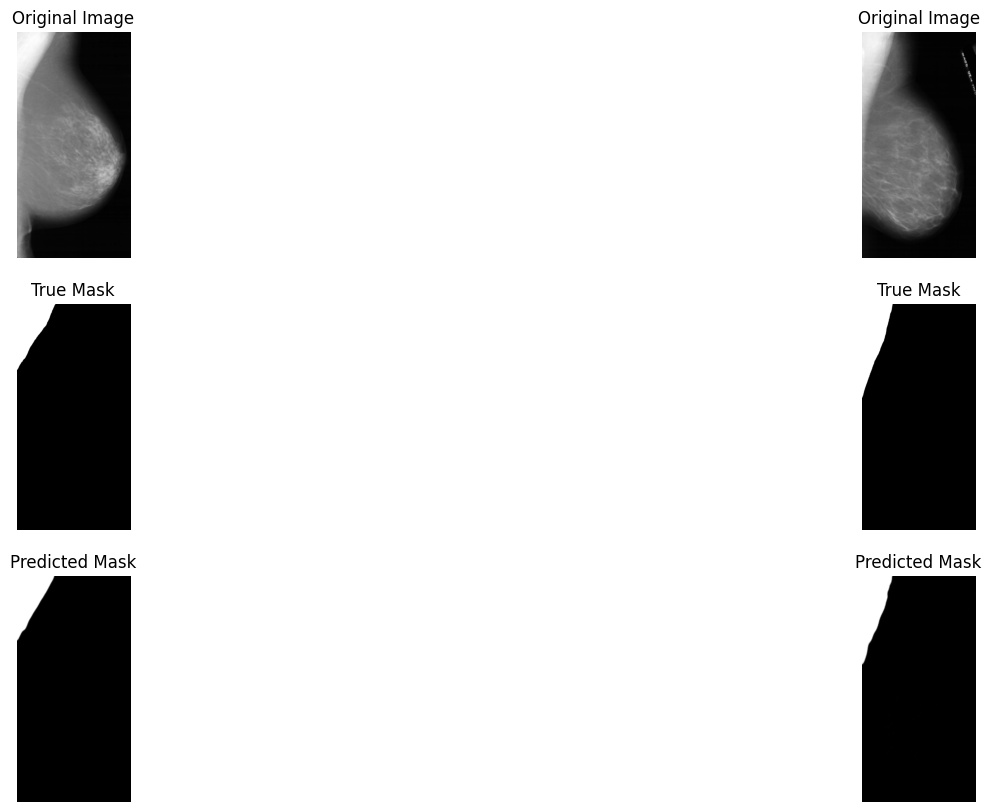

Epoch 121/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8281, Sensitivity: 0.7092, Specificity: 0.9821, IoU: 0.6482


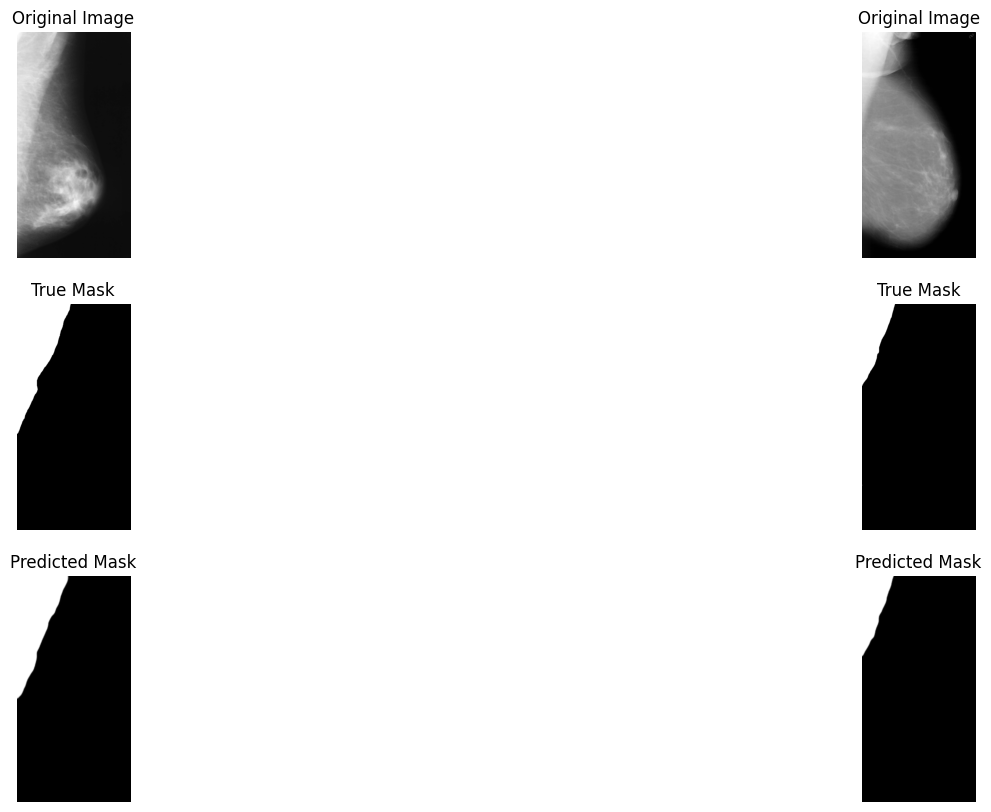

Epoch 122/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8247, Sensitivity: 0.7164, Specificity: 0.9816, IoU: 0.6525


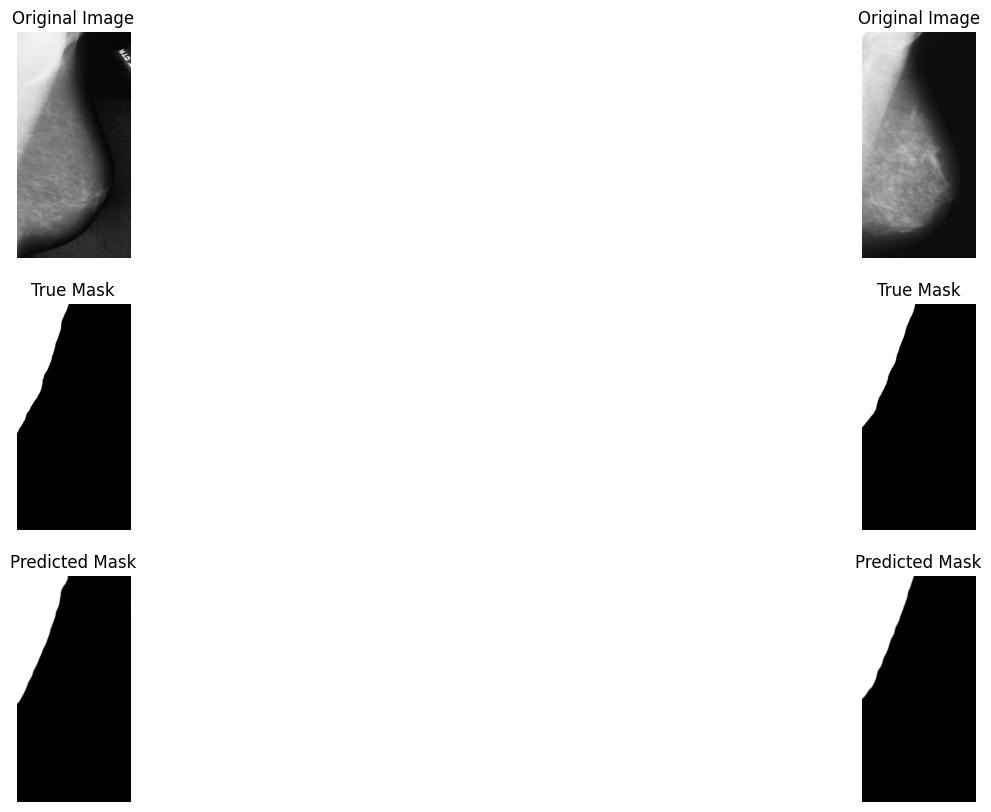

Epoch 00123: reducing learning rate of group 0 to 4.8828e-08.
Epoch 123/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8298, Sensitivity: 0.7061, Specificity: 0.9822, IoU: 0.6457


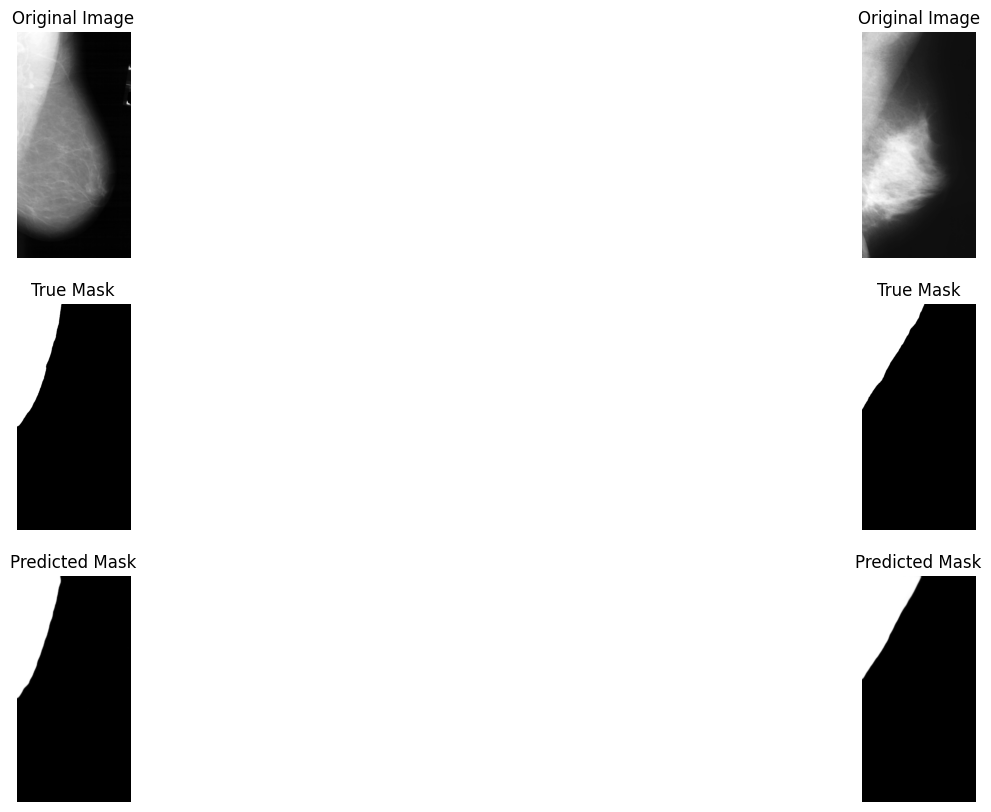

Epoch 124/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8261, Sensitivity: 0.7139, Specificity: 0.9819, IoU: 0.6515


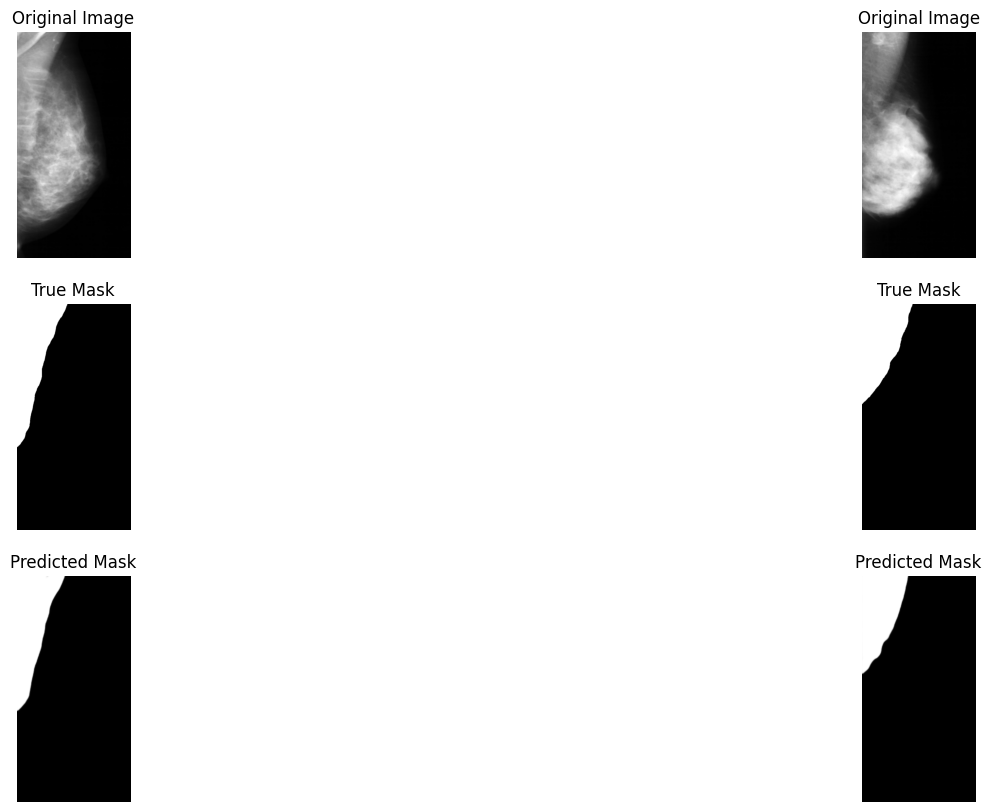

Epoch 125/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8273, Sensitivity: 0.7119, Specificity: 0.9821, IoU: 0.6503


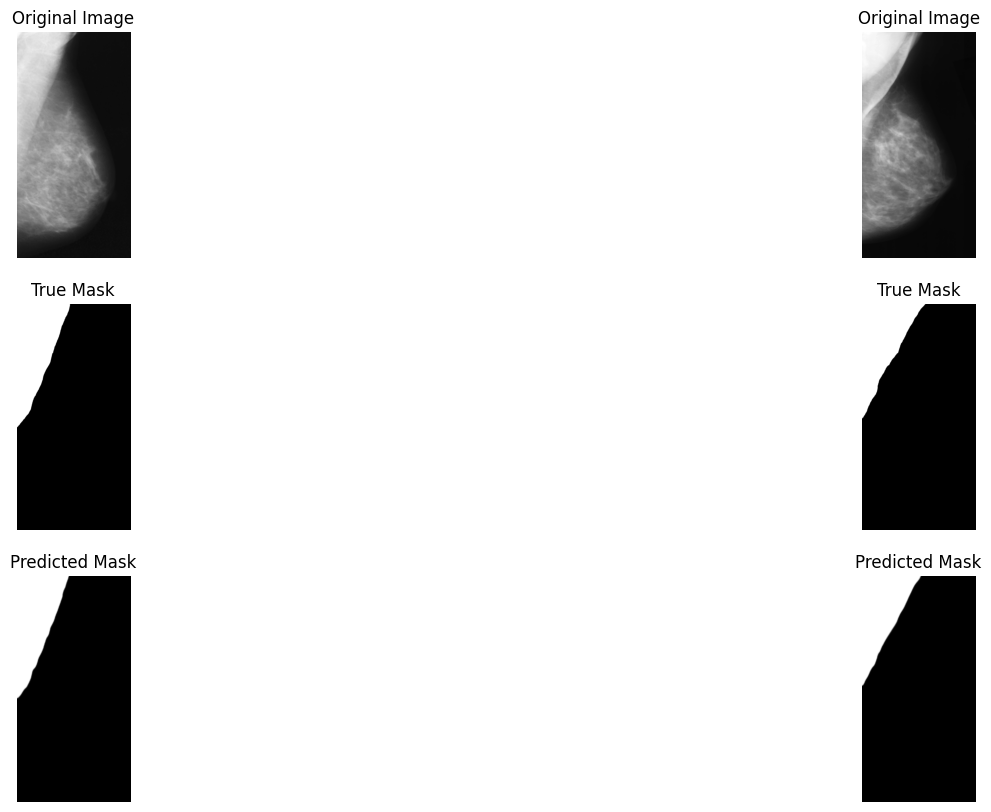

Epoch 126/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8280, Sensitivity: 0.7105, Specificity: 0.9821, IoU: 0.6493


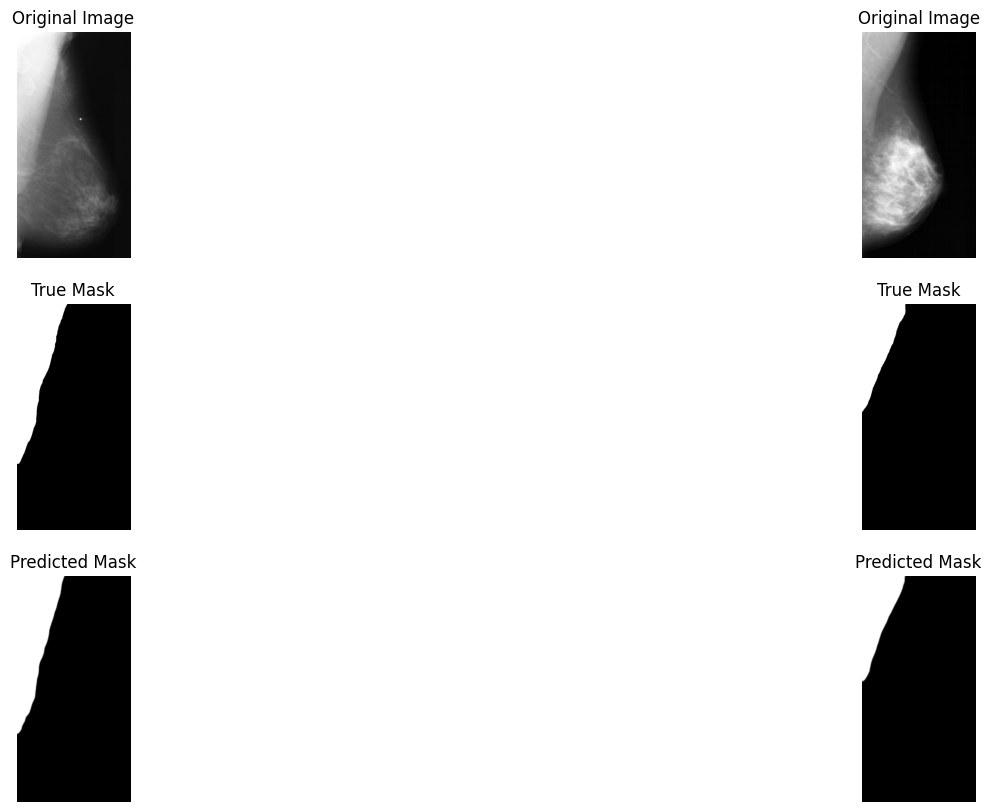

Epoch 127/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8282, Sensitivity: 0.7091, Specificity: 0.9821, IoU: 0.6480


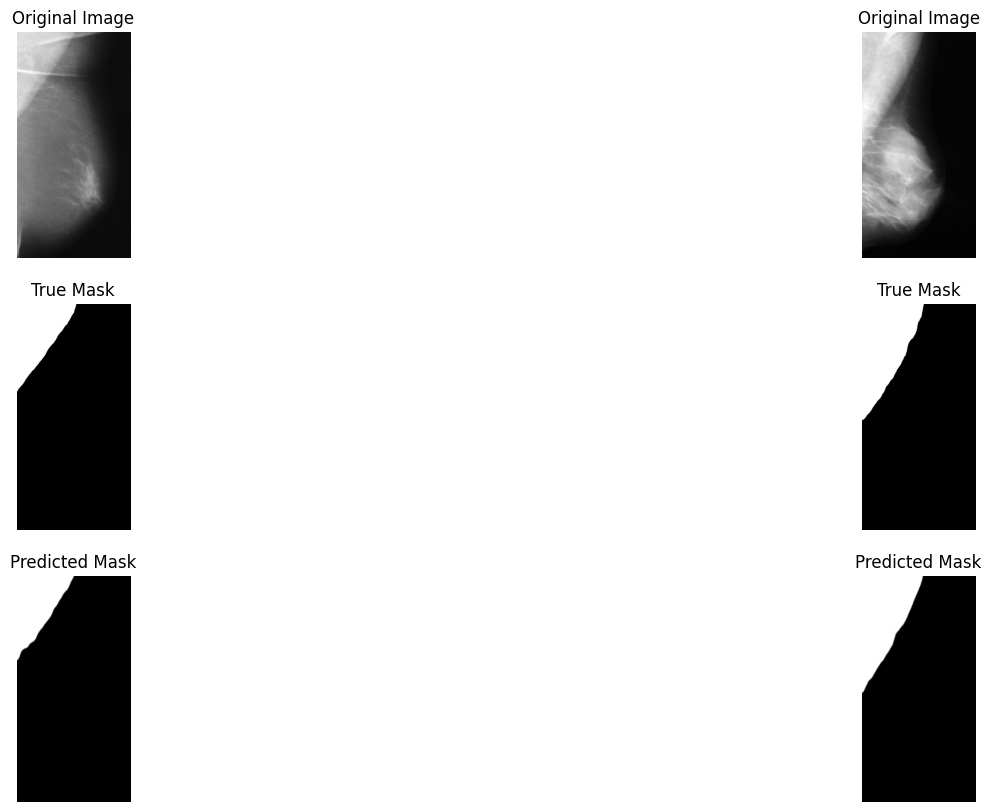

Epoch 128/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8281, Sensitivity: 0.7114, Specificity: 0.9820, IoU: 0.6499


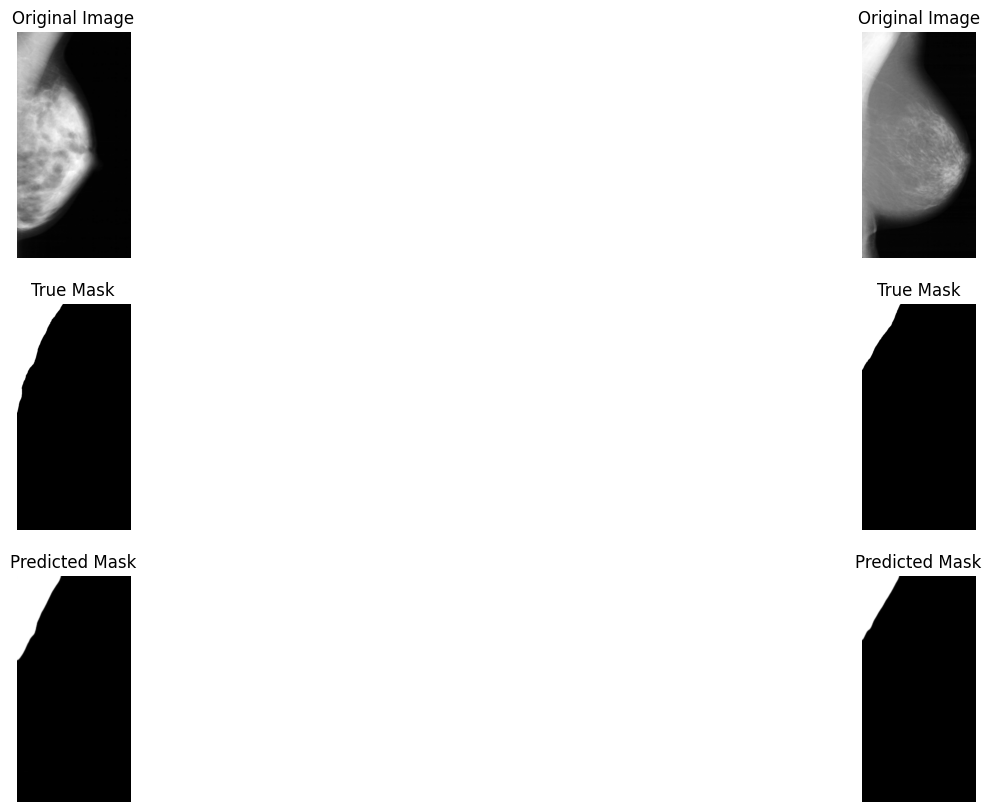

Epoch 00129: reducing learning rate of group 0 to 2.4414e-08.
Epoch 129/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8288, Sensitivity: 0.7102, Specificity: 0.9821, IoU: 0.6493


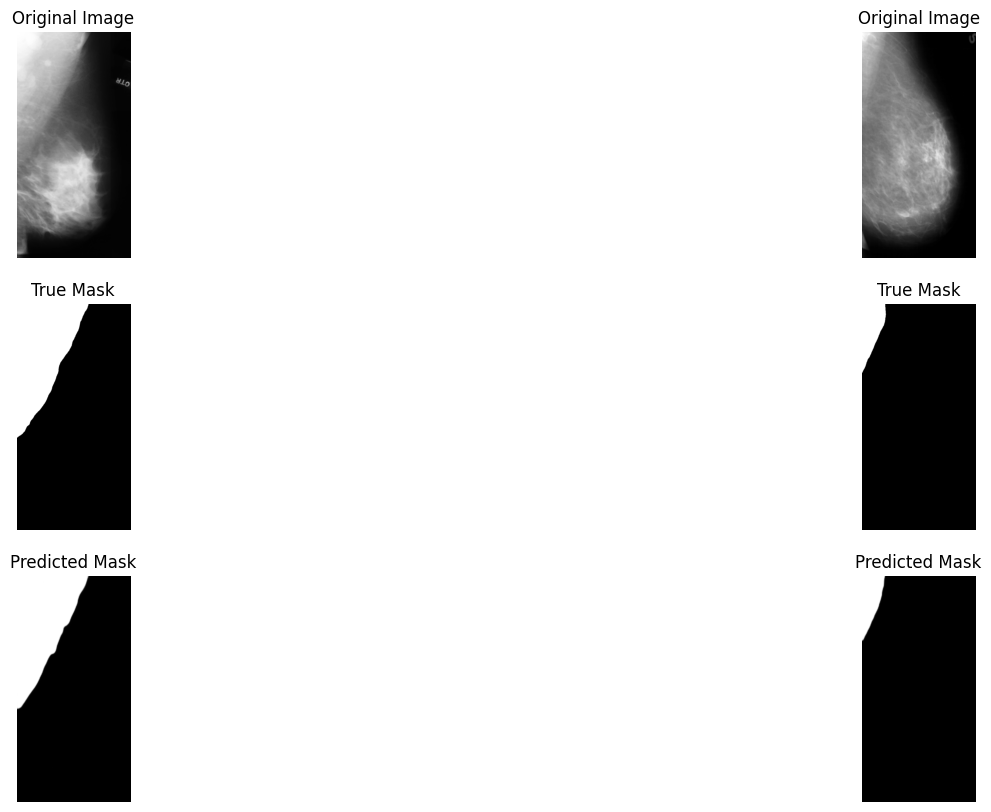

Epoch 130/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8258, Sensitivity: 0.7143, Specificity: 0.9818, IoU: 0.6512


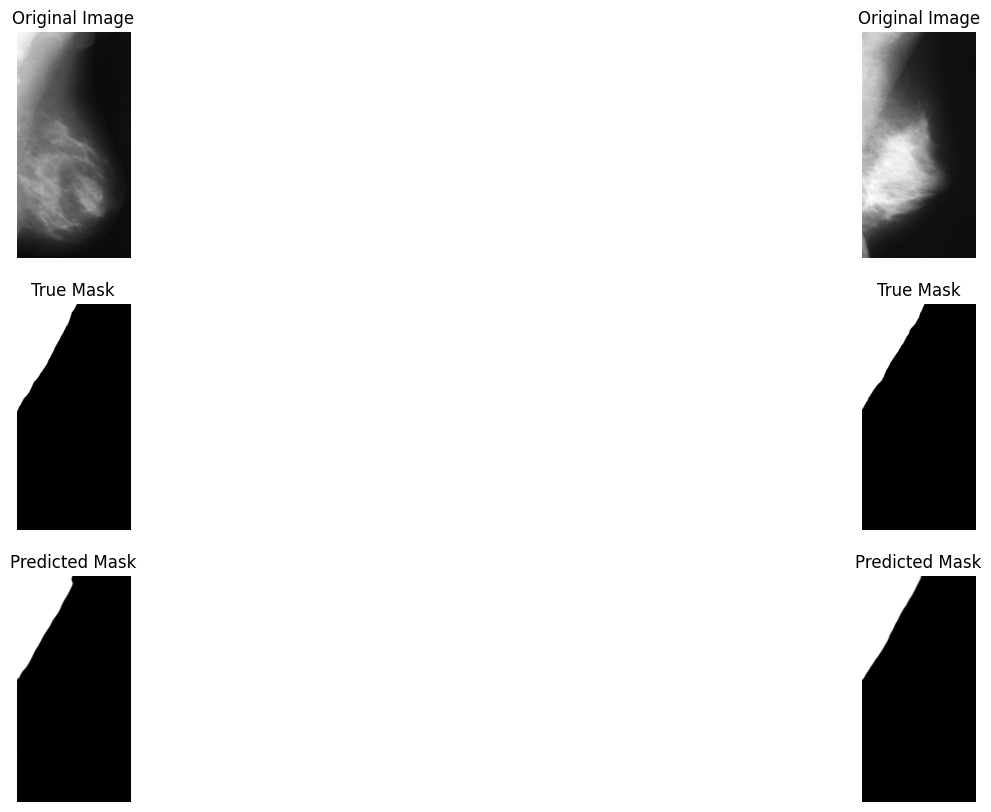

Epoch 131/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8305, Sensitivity: 0.7034, Specificity: 0.9824, IoU: 0.6440


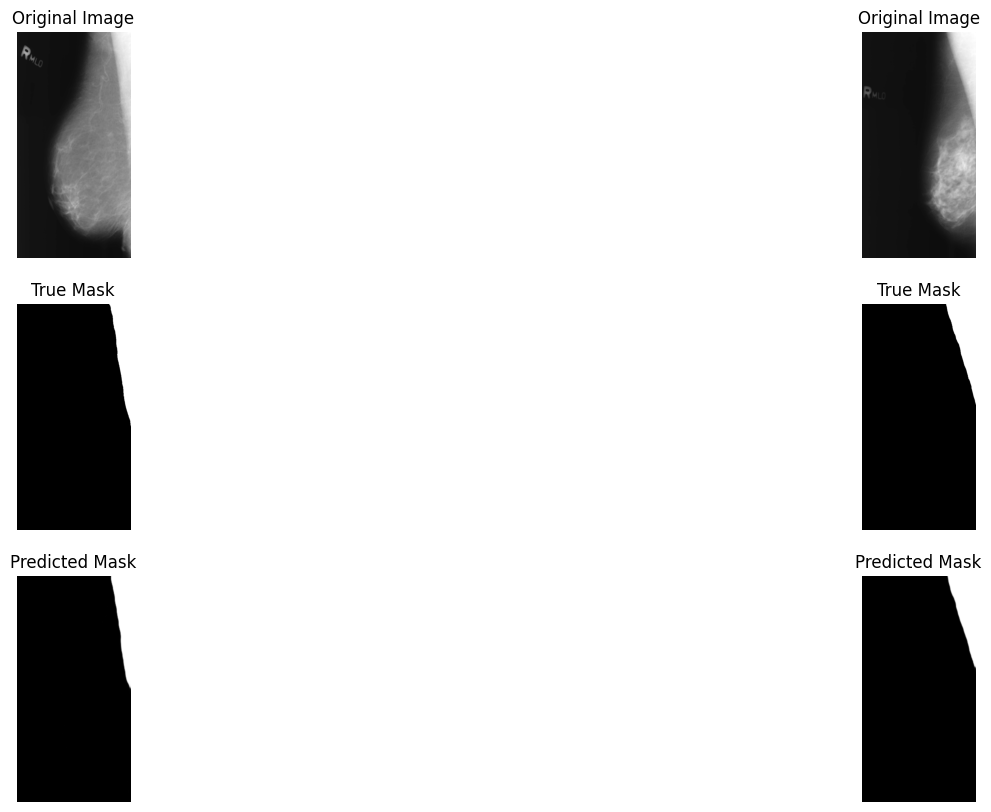

Epoch 132/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8292, Sensitivity: 0.7055, Specificity: 0.9822, IoU: 0.6453


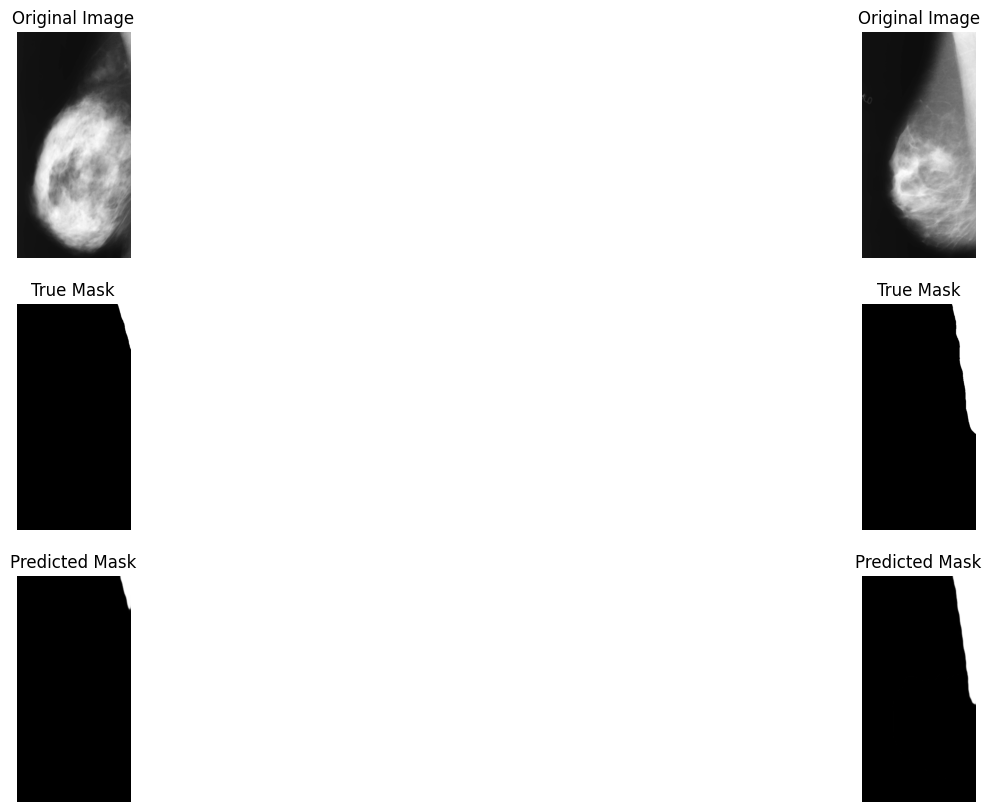

Epoch 133/150, Train Loss: 0.9928, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8262, Sensitivity: 0.7141, Specificity: 0.9818, IoU: 0.6513


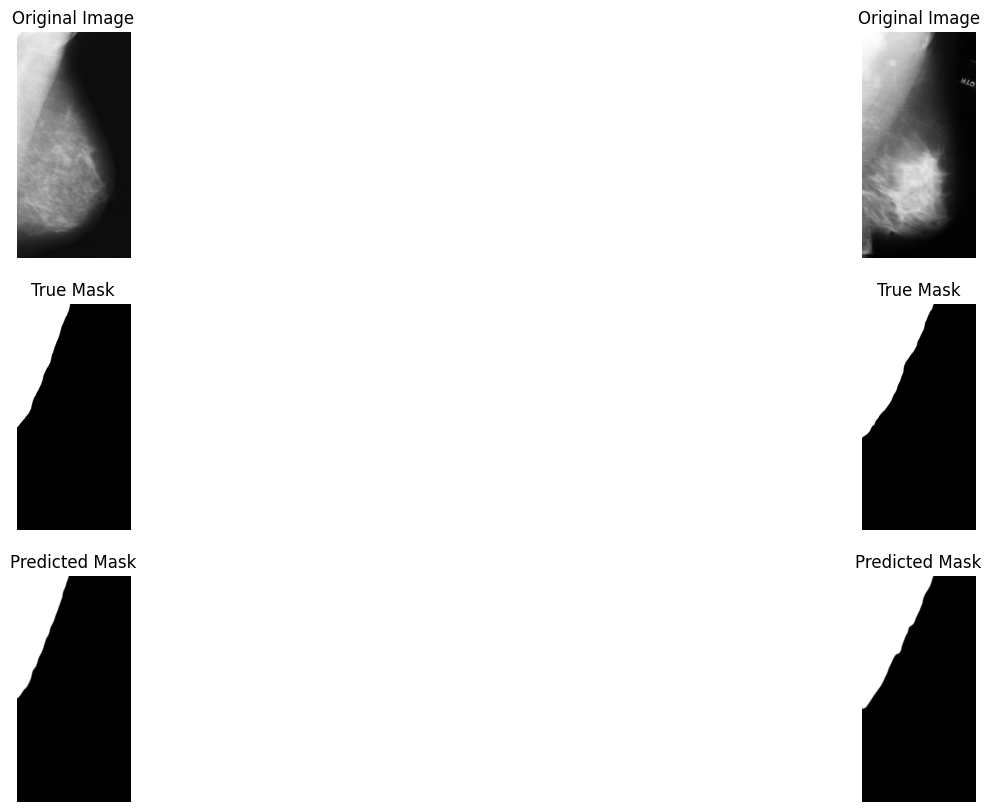

Epoch 134/150, Train Loss: 0.9929, Validation Loss: 0.9926, Dice Coef: 0.0074, Precision: 0.8268, Sensitivity: 0.7134, Specificity: 0.9819, IoU: 0.6511


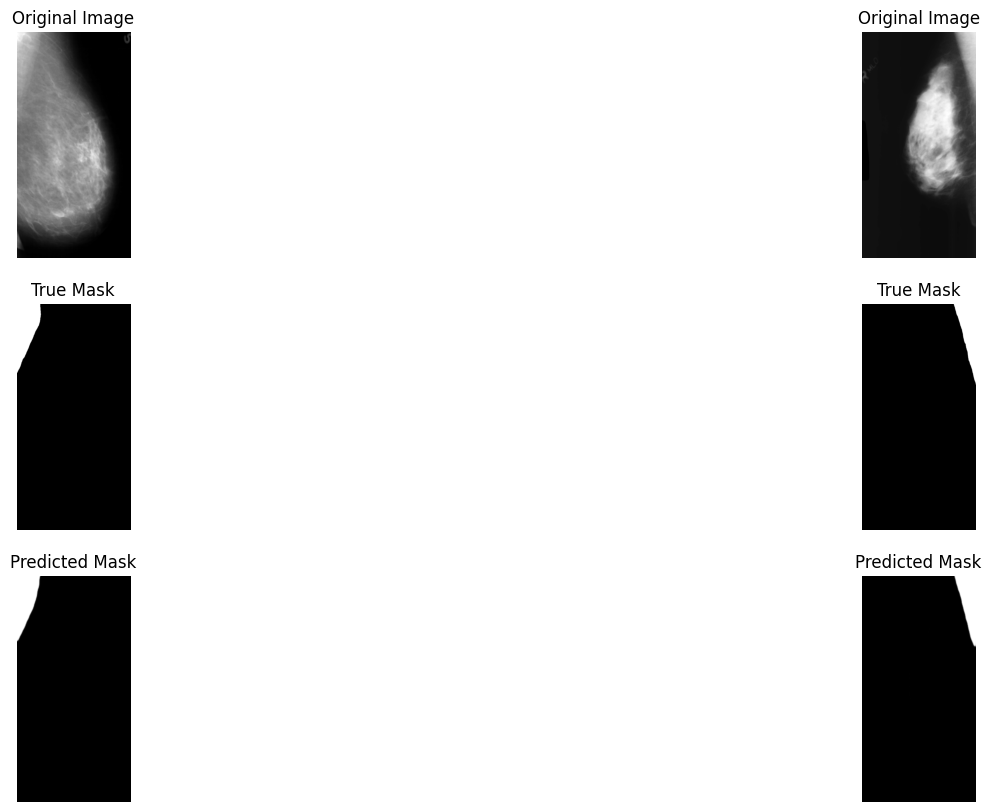

In [ ]:

import random
# Función para calcular el coeficiente de Dice

def dice_coeff(pred, target, smooth=1e-15):
    num = pred.size(0)
    pred_flat = pred.view(num, -1)
    target_flat = target.view(num, -1)

    intersection = (pred_flat * target_flat).sum()
    dice = (2. * intersection + smooth) / (pred_flat.sum() + target_flat.sum() + smooth)
    return dice.item()



#Función precisión, sensibiidad, especificidad y IoU

def calculate_metrics(outputs, labels):
    preds = outputs > 0.5
    preds_bool = preds.type(torch.bool)
    labels_bool = labels.type(torch.bool)

    true_positives = (preds_bool & labels_bool).sum().float()
    false_positives = (preds_bool & ~labels_bool).sum().float()
    false_negatives = (~preds_bool & labels_bool).sum().float()
    true_negatives = (~preds_bool & ~labels_bool).sum().float()

    precision = true_positives / (true_positives + false_positives + 1e-10)
    sensitivity = true_positives / (true_positives + false_negatives + 1e-10)
    specificity = true_negatives / (true_negatives + false_positives + 1e-10)
    iou = true_positives / (true_positives + false_positives + false_negatives + 1e-10)

    return precision.item(), sensitivity.item(), specificity.item(), iou.item()

history = {
    "train_loss": [],
    "val_loss": [],
    "train_dice": [],
    "val_dice": [],
    "iou": [],

}

# Bucle de entrenamiento
num_epochs = 150 # número de épocas

for epoch in range(num_epochs):
    model.train()  # Pone el modelo en modo de entrenamiento
    train_loss = 0.0
    train_dice= 0.0
    first_batch = True
    for images, masks in train_loader:
        optimizer.zero_grad()  # Limpia los gradientes
        masks = masks.unsqueeze(1)
        outputs = model(images)  # Pasada hacia adelante
        loss = criterion(outputs, masks)  # Calcula la pérdida
        loss.backward()  # Retropropagación
        optimizer.step()  # Actualiza los pesos
        train_loss += loss.item()
        train_dice += dice_coeff(outputs, masks.unsqueeze(1))
        if first_batch:
            with torch.no_grad():
                model.eval()
                preds = model(images)
                model.train()
            plot_images(images.cpu(), masks.cpu(), preds, num_images=3)
            first_batch = False
    train_loss /= len(train_loader)
    train_dice /= len(train_loader)

    # Validación
    model.eval()  # Pone el modelo en modo de evaluación
    val_loss = 0.0
    val_dice = 0.0
    precision_total = 0.0
    sensitivity_total = 0.0
    specificity_total = 0.0
    iou_total = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            masks = masks.unsqueeze(1)
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()
            val_dice += dice_coeff(outputs, masks.unsqueeze(1))
            precision, sensitivity, specificity, iou = calculate_metrics(outputs, masks)
            precision_total += precision
            sensitivity_total += sensitivity
            specificity_total += specificity
            iou_total += iou


    # Calcular la pérdida media y el coeficiente de Dice
        val_loss /= len(val_loader)
        val_dice /= len(val_loader)
        scheduler.step(val_loss)  # Actualiza la tasa de aprendizaje

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_dice'].append(train_dice)
        history['val_dice'].append(val_dice)


    # Calcular promedios de las métricas
    num_batches = len(val_loader)
    avg_precision = precision_total / num_batches
    avg_sensitivity = sensitivity_total / num_batches
    avg_specificity = specificity_total / num_batches
    avg_iou = iou_total / num_batches
    history['iou'].append(avg_iou)

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}, Dice Coef: {val_dice:.4f}, Precision: {avg_precision:.4f}, Sensitivity: {avg_sensitivity:.4f}, Specificity: {avg_specificity:.4f}, IoU: {avg_iou:.4f}')


In [ ]:
import matplotlib.pyplot as plt

# Gráfico de pérdida
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Pérdida durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

# Gráfico del coeficiente de Dice
plt.subplot(1, 3, 2)
plt.plot(history['train_dice'], label='Train Dice')
plt.plot(history['val_dice'], label='Validation Dice')
plt.title('Coeficiente de Dice durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('Dice Coefficient')
plt.legend()

#Gráfico del coeficiente IoU

plt.subplot(1, 3, 3)
plt.plot(history['IoU'], label='IoU')
plt.title('Coeficiente de IoU durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('IoU')
plt.legend()

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import torch

model.eval()

# Selecciona una muestra del conjunto de validación
images, masks = next(iter(val_loader))

# Obtiene predicciones del modelo
with torch.no_grad():
    outputs = model(images)
    outputs = torch.sigmoid(outputs)
    preds = (outputs > 0.5).float()

# Visualiza los resultados
def show_images(images, true_masks, preds, num_images=5):
    num_images = min(num_images, len(images))
    plt.figure(figsize=(10, 10))
    for i in range(num_images):
        plt.subplot(3, num_images, i+1)
        plt.imshow(images[i].permute(1, 2, 0))
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(3, num_images, num_images+i+1)
        plt.imshow(true_masks[i].squeeze(), cmap="gray")
        plt.title("True Mask")
        plt.axis('off')

        plt.subplot(3, num_images, 2*num_images+i+1)
        plt.imshow(preds[i].squeeze(), cmap="gray")
        plt.title("Predicted Mask")
        plt.axis('off')


show_images(images, masks, preds)
